In [ ]:
import gym
import gym_oscillator
import oscillator_cpp
from stable_baselines3.common.utils import set_random_seed

from stable_baselines3.common.policies import ActorCriticPolicy
from stable_baselines3.common.vec_env import DummyVecEnv, SubprocVecEnv, VecNormalize
from stable_baselines3 import PPO

import numpy as np
from matplotlib import pyplot as plt



In [2]:
def make_env(env_id, rank, seed=0,):
    """
    Utility function for multiprocessed env.
    
    :param env_id: (str) the environment ID
    :param num_env: (int) the number of environment you wish to have in subprocesses
    :param seed: (int) the inital seed for RNG
    :param rank: (int) index of the subprocess
    :param s_i: (bool) reward form, only one can be true
    """
    def _init():
        # Import gym_oscillator in each subprocess to ensure registration
        import gym
        import gym_oscillator
        
        env = gym.make(env_id)
        print(f"Environment {env_id} created successfully in subprocess {rank}")
        print(env.reset().shape)
        return env
    set_random_seed(seed)
    return _init

### To train with stablebaselines

In [3]:
# Check if the environment is registered
try:
    gym.envs.registry['oscillator-v0']
    print("oscillator-v0 environment is registered")
except KeyError:
    print("oscillator-v0 environment is NOT registered")
    # Try to register it manually if needed

# Test with single environment first
env_id = 'oscillator-v0'
print(f"Creating single environment: {env_id}")

# Test single environment creation
test_env = gym.make(env_id)
print(f"Single environment created successfully!")
print(f"Observation space: {test_env.observation_space}")
print(f"Action space: {test_env.action_space}")
test_reset = test_env.reset()
print(f"Reset output shape: {test_reset.shape if hasattr(test_reset, 'shape') else type(test_reset)}")
test_env.close()

# Now try with DummyVecEnv (single process) first
print("\nTesting with DummyVecEnv (single process)...")
env = DummyVecEnv([lambda: gym.make(env_id)])
print("DummyVecEnv created successfully!")

# Create model with single environment
time_steps = int(10e6)
model = PPO("MlpPolicy", env, verbose=1, tensorboard_log="MLP/")
print("Model created successfully!")

# If single process works, we can try multiprocessing later
# Commented out multiprocessing for now:
# num_cpu = 8
# env = SubprocVecEnv([make_env(env_id, i) for i in range(num_cpu)])

oscillator-v0 environment is registered
Creating single environment: oscillator-v0
Single environment created successfully!
Observation space: Box(-1.5, 1.5, (2, 250), float32)
Action space: Box(-1.0, 1.0, (1,), float32)
Reset output shape: (2, 250)

Testing with DummyVecEnv (single process)...
DummyVecEnv created successfully!
Using cuda device


/mnt/c/Users/LabUser/Desktop/games/RL-DBS/rl_dbs_env/lib/python3.12/site-packages/gym/utils/passive_env_checker.py:31: UserWarning: WARN: A Box observation space has an unconventional shape (neither an image, nor a 1D vector). We recommend flattening the observation to have only a 1D vector or use a custom policy to properly process the data. Actual observation shape: (2, 250)
  logger.warn(
/mnt/c/Users/LabUser/Desktop/games/RL-DBS/rl_dbs_env/lib/python3.12/site-packages/gym/utils/passive_env_checker.py:174: UserWarning: WARN: Future gym versions will require that `Env.reset` can be passed a `seed` instead of using `Env.seed` for resetting the environment random number generator.
  logger.warn(
/mnt/c/Users/LabUser/Desktop/games/RL-DBS/rl_dbs_env/lib/python3.12/site-packages/gym/utils/passive_env_checker.py:187: UserWarning: WARN: Future gym versions will require that `Env.reset` can be passed `options` to allow the environment initialisation to be passed additional information.
  log

Model created successfully!


/mnt/c/Users/LabUser/Desktop/games/RL-DBS/rl_dbs_env/lib/python3.12/site-packages/stable_baselines3/common/on_policy_algorithm.py:150: UserWarning: You are trying to run PPO on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(


### Save

In [ ]:
# model.save('trained_models/model5layers.tf')

### Load model

In [4]:
env_id = 'oscillator-v0'
env = gym.make(env_id)
#Number of cpus
num_cpu = 1

env = SubprocVecEnv([make_env(env_id, i) for i in range(num_cpu)])
model = PPO2(MlpPolicy, env, verbose=1,tensorboard_log="MLP/")
model = model.load('trained_models/Ps6_final_3')

/mnt/c/Users/LabUser/Desktop/games/RL-DBS/rl_dbs_env/lib/python3.12/site-packages/gym/utils/passive_env_checker.py:31: UserWarning: WARN: A Box observation space has an unconventional shape (neither an image, nor a 1D vector). We recommend flattening the observation to have only a 1D vector or use a custom policy to properly process the data. Actual observation shape: (2, 250)
  logger.warn(
/mnt/c/Users/LabUser/Desktop/games/RL-DBS/rl_dbs_env/lib/python3.12/site-packages/gym/utils/passive_env_checker.py:31: UserWarning: WARN: A Box observation space has an unconventional shape (neither an image, nor a 1D vector). We recommend flattening the observation to have only a 1D vector or use a custom policy to properly process the data. Actual observation shape: (2, 250)
  logger.warn(
/mnt/c/Users/LabUser/Desktop/games/RL-DBS/rl_dbs_env/lib/python3.12/site-packages/gym/utils/passive_env_checker.py:174: UserWarning: WARN: Future gym versions will require that `Env.reset` can be passed a `seed

Environment oscillator-v0 created successfully in subprocess 0
(2, 250)


NameError: name 'PPO2' is not defined

In [5]:
if not hasattr(np, 'bool8'):
    np.bool8 = np.bool_

env = gym.make(env_id)
#Store rewards
rews_ = []
#Store observations
obs_ = []
obs = env.reset()
#Store actions
acs_ = []
#Store X,Y according to 
states_x = []
states_y = []

#Initial, non-suppresssion 
for i in range(25000):
    obs, rewards, dones, info = env.step([0])
    states_x.append(env.x_val)
    states_y.append(env.y_val)
    obs_.append(obs[0])
    acs_.append(0)
    rews_.append(rewards)

#Suppression stage
for i in range(25000):
    action, _states = model.predict(obs)
   
    obs, rewards, dones, info = env.step(action)
   
    states_x.append(env.x_val)
    states_y.append(env.y_val)
    obs_.append(obs[0])
    acs_.append(action)
    rews_.append(rewards)

#Final relaxation
for i in range(5000):
    obs, rewards, dones, info = env.step([0])
    states_x.append(env.x_val)
    states_y.append(env.y_val)
    obs_.append(obs[0])
    acs_.append(0)
    rews_.append(rewards)


/mnt/c/Users/LabUser/Desktop/games/RL-DBS/rl_dbs_env/lib/python3.12/site-packages/gym/utils/passive_env_checker.py:141: UserWarning: WARN: The obs returned by the `step()` method was expecting numpy array dtype to be float32, actual type: float64
  logger.warn(
/mnt/c/Users/LabUser/Desktop/games/RL-DBS/rl_dbs_env/lib/python3.12/site-packages/gym/utils/passive_env_checker.py:165: UserWarning: WARN: The obs returned by the `step()` method is not within the observation space.
  logger.warn(f"{pre} is not within the observation space.")


### Graph plot

In [ ]:
plt.figure(figsize=(25,5))
plt.title('Suppression plot')
plt.xlabel('TimeStep')
plt.ylabel('Signal Value')
plt.plot(states_x)

### Model score:

In [ ]:
print(np.std(states_x[5000:25000])/np.std(states_x[30000:45000]))
s = (np.std(states_x[5000:25000])/np.std(states_x[30000:45000]))
print(np.sqrt(s))

In [ ]:
print(np.mean(states_x[5000:150000]))

In [ ]:
np.sqrt(1.10554209724429/0.0367348421348131)

## Env Analysis

Environment Analysis:
Observation space: Box(-1.5, 1.5, (2, 250), float32)
Action space: Box(-1.0, 1.0, (1,), float32)
Initial observation shape: (2, 250)
Observation format: (2, 250) where obs[0]=x_state, obs[1]=y_state

Data collection complete!
X states shape: (1000, 250)
Y states shape: (1000, 250)
Current values shape: x_vals=(1000,), y_vals=(1000,)
Actions shape: (1000, 1)


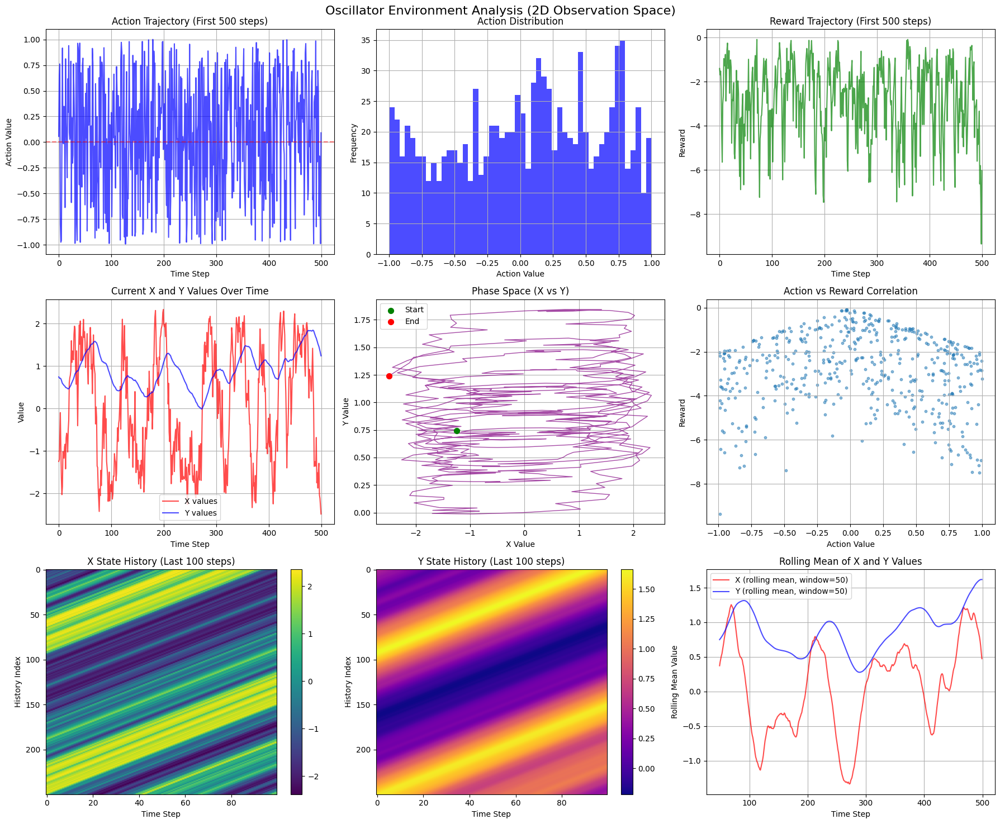


ENVIRONMENT STATISTICS (2D Observation Space)
Action Statistics:
  Mean: 0.0436
  Std:  0.5658
  Min:  -0.9992
  Max:  0.9998

Reward Statistics:
  Mean: -3.0429
  Std:  1.8425
  Min:  -9.3615
  Max:  -0.0848

Current State Statistics:
  X values - Mean: -0.1082, Std: 1.4160, Range: [-2.4879, 2.3549]
  Y values - Mean: 0.7857, Std: 0.4599, Range: [-0.2167, 1.8437]

State History Statistics:
  X state history shape: (1000, 250)
  Y state history shape: (1000, 250)
  X history - Mean: -0.0990, Std: 1.3616
  Y history - Mean: 0.7737, Std: 0.4505

Environment Behavior Analysis:
  Episodes completed: 0
  Average episode length: 1000.0
  Action-reward correlation: -0.0222
  X-Y correlation: 0.2630

Observation Structure Analysis:
  Observation space: (2, 250)
  obs[0] = X state history (length 250)
  obs[1] = Y state history (length 250)
  Current state extraction: x_val = obs[0, -1], y_val = obs[1, -1]


In [6]:
# Fix NumPy compatibility issue
import numpy as np
import warnings

# Patch numpy.bool8 if it doesn't exist (compatibility fix)
if not hasattr(np, 'bool8'):
    np.bool8 = np.bool_

# Environment Analysis: Plot Actions and States (Fixed for 2D obs)
import matplotlib.pyplot as plt
import gym
import gym_oscillator

# Create a single environment for analysis
env = gym.make('oscillator-v0')

# Handle both old and new gym API
try:
    obs = env.reset()
    if isinstance(obs, tuple):
        obs = obs[0]  # New gym API returns (obs, info)
except:
    obs = env.reset()

# Collect data from environment
num_steps = 1000
x_states = []  # Store x_state trajectories
y_states = []  # Store y_state trajectories
x_vals = []    # Store current x_val at each step
y_vals = []    # Store current y_val at each step
actions = []
rewards = []
dones = []

print(f"Environment Analysis:")
print(f"Observation space: {env.observation_space}")
print(f"Action space: {env.action_space}")
print(f"Initial observation shape: {obs.shape}")
print(f"Observation format: (2, {obs.shape[1]}) where obs[0]=x_state, obs[1]=y_state")

# Run random actions to collect data
print(f"\nCollecting {num_steps} steps of data...")
for step in range(num_steps):
    # Extract current state values from observation
    current_x = obs[0, -1]  # Last x value
    current_y = obs[1, -1]  # Last y value
    
    # Sample random action
    action = env.action_space.sample()
    
    # Take step - handle both old and new gym API
    try:
        step_result = env.step(action)
        if len(step_result) == 4:
            obs, reward, done, info = step_result
        else:  # New gym API returns 5 values
            obs, reward, terminated, truncated, info = step_result
            done = terminated or truncated
    except Exception as e:
        print(f"Step error: {e}")
        break
    
    # Store data
    x_states.append(obs[0].copy())  # Full x trajectory
    y_states.append(obs[1].copy())  # Full y trajectory
    x_vals.append(current_x)        # Current x value
    y_vals.append(current_y)        # Current y value
    actions.append(action.copy())
    rewards.append(reward)
    dones.append(done)
    
    # Reset if done
    if done:
        reset_result = env.reset()
        if isinstance(reset_result, tuple):
            obs = reset_result[0]  # New gym API
        else:
            obs = reset_result  # Old gym API

# Convert to numpy arrays
x_states = np.array(x_states)
y_states = np.array(y_states)
x_vals = np.array(x_vals)
y_vals = np.array(y_vals)
actions = np.array(actions)
rewards = np.array(rewards)

print(f"Data collection complete!")
print(f"X states shape: {x_states.shape}")
print(f"Y states shape: {y_states.shape}")
print(f"Current values shape: x_vals={x_vals.shape}, y_vals={y_vals.shape}")
print(f"Actions shape: {actions.shape}")

# Create comprehensive plots
fig, axes = plt.subplots(3, 3, figsize=(18, 15))
fig.suptitle('Oscillator Environment Analysis (2D Observation Space)', fontsize=16)

plot_steps = min(500, len(actions))

# Plot 1: Action trajectory
axes[0, 0].plot(actions[:plot_steps], 'b-', alpha=0.7)
axes[0, 0].set_title(f'Action Trajectory (First {plot_steps} steps)')
axes[0, 0].set_xlabel('Time Step')
axes[0, 0].set_ylabel('Action Value')
axes[0, 0].grid(True)
axes[0, 0].axhline(y=0, color='r', linestyle='--', alpha=0.5)

# Plot 2: Action distribution
axes[0, 1].hist(actions.flatten(), bins=50, alpha=0.7, color='blue')
axes[0, 1].set_title('Action Distribution')
axes[0, 1].set_xlabel('Action Value')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].grid(True)

# Plot 3: Reward trajectory
axes[0, 2].plot(rewards[:plot_steps], 'g-', alpha=0.7)
axes[0, 2].set_title(f'Reward Trajectory (First {plot_steps} steps)')
axes[0, 2].set_xlabel('Time Step')
axes[0, 2].set_ylabel('Reward')
axes[0, 2].grid(True)

# Plot 4: Current X and Y values over time
axes[1, 0].plot(x_vals[:plot_steps], 'r-', label='X values', alpha=0.7)
axes[1, 0].plot(y_vals[:plot_steps], 'b-', label='Y values', alpha=0.7)
axes[1, 0].set_title('Current X and Y Values Over Time')
axes[1, 0].set_xlabel('Time Step')
axes[1, 0].set_ylabel('Value')
axes[1, 0].legend()
axes[1, 0].grid(True)

# Plot 5: Phase space (X vs Y)
axes[1, 1].plot(x_vals[:plot_steps], y_vals[:plot_steps], 'purple', alpha=0.7, linewidth=1)
axes[1, 1].scatter(x_vals[0], y_vals[0], color='green', s=50, label='Start', zorder=5)
axes[1, 1].scatter(x_vals[plot_steps-1], y_vals[plot_steps-1], color='red', s=50, label='End', zorder=5)
axes[1, 1].set_title('Phase Space (X vs Y)')
axes[1, 1].set_xlabel('X Value')
axes[1, 1].set_ylabel('Y Value')
axes[1, 1].legend()
axes[1, 1].grid(True)

# Plot 6: Action vs Reward correlation
axes[1, 2].scatter(actions[:plot_steps], rewards[:plot_steps], alpha=0.5, s=10)
axes[1, 2].set_title('Action vs Reward Correlation')
axes[1, 2].set_xlabel('Action Value')
axes[1, 2].set_ylabel('Reward')
axes[1, 2].grid(True)

# Plot 7: X state trajectory heatmap (recent history)
recent_steps = min(100, x_states.shape[0])
im1 = axes[2, 0].imshow(x_states[-recent_steps:].T, aspect='auto', cmap='viridis')
axes[2, 0].set_title(f'X State History (Last {recent_steps} steps)')
axes[2, 0].set_xlabel('Time Step')
axes[2, 0].set_ylabel('History Index')
plt.colorbar(im1, ax=axes[2, 0])

# Plot 8: Y state trajectory heatmap (recent history)
im2 = axes[2, 1].imshow(y_states[-recent_steps:].T, aspect='auto', cmap='plasma')
axes[2, 1].set_title(f'Y State History (Last {recent_steps} steps)')
axes[2, 1].set_xlabel('Time Step')
axes[2, 1].set_ylabel('History Index')
plt.colorbar(im2, ax=axes[2, 1])

# Plot 9: State statistics over time
window_size = 50
if len(x_vals) > window_size:
    x_rolling_mean = np.convolve(x_vals, np.ones(window_size)/window_size, mode='valid')
    y_rolling_mean = np.convolve(y_vals, np.ones(window_size)/window_size, mode='valid')
    time_axis = np.arange(window_size-1, len(x_vals))
    
    axes[2, 2].plot(time_axis[:plot_steps-window_size+1], x_rolling_mean[:plot_steps-window_size+1], 'r-', label=f'X (rolling mean, window={window_size})', alpha=0.7)
    axes[2, 2].plot(time_axis[:plot_steps-window_size+1], y_rolling_mean[:plot_steps-window_size+1], 'b-', label=f'Y (rolling mean, window={window_size})', alpha=0.7)
    axes[2, 2].set_title(f'Rolling Mean of X and Y Values')
    axes[2, 2].set_xlabel('Time Step')
    axes[2, 2].set_ylabel('Rolling Mean Value')
    axes[2, 2].legend()
    axes[2, 2].grid(True)

plt.tight_layout()
plt.show()

# Print statistical analysis
print("\n" + "="*60)
print("ENVIRONMENT STATISTICS (2D Observation Space)")
print("="*60)
print(f"Action Statistics:")
print(f"  Mean: {np.mean(actions):.4f}")
print(f"  Std:  {np.std(actions):.4f}")
print(f"  Min:  {np.min(actions):.4f}")
print(f"  Max:  {np.max(actions):.4f}")

print(f"\nReward Statistics:")
print(f"  Mean: {np.mean(rewards):.4f}")
print(f"  Std:  {np.std(rewards):.4f}")
print(f"  Min:  {np.min(rewards):.4f}")
print(f"  Max:  {np.max(rewards):.4f}")

print(f"\nCurrent State Statistics:")
print(f"  X values - Mean: {np.mean(x_vals):.4f}, Std: {np.std(x_vals):.4f}, Range: [{np.min(x_vals):.4f}, {np.max(x_vals):.4f}]")
print(f"  Y values - Mean: {np.mean(y_vals):.4f}, Std: {np.std(y_vals):.4f}, Range: [{np.min(y_vals):.4f}, {np.max(y_vals):.4f}]")

print(f"\nState History Statistics:")
print(f"  X state history shape: {x_states.shape}")
print(f"  Y state history shape: {y_states.shape}")
print(f"  X history - Mean: {np.mean(x_states):.4f}, Std: {np.std(x_states):.4f}")
print(f"  Y history - Mean: {np.mean(y_states):.4f}, Std: {np.std(y_states):.4f}")

print(f"\nEnvironment Behavior Analysis:")
print(f"  Episodes completed: {np.sum(dones)}")
print(f"  Average episode length: {len(dones) / max(1, np.sum(dones)):.1f}")
if len(actions) > 0 and len(rewards) > 0:
    print(f"  Action-reward correlation: {np.corrcoef(actions.flatten(), rewards)[0,1]:.4f}")
if len(x_vals) > 0 and len(y_vals) > 0:
    print(f"  X-Y correlation: {np.corrcoef(x_vals, y_vals)[0,1]:.4f}")

# Analyze the 2D observation structure
print(f"\nObservation Structure Analysis:")
print(f"  Observation space: {env.observation_space.shape}")
print(f"  obs[0] = X state history (length {obs.shape[1]})")
print(f"  obs[1] = Y state history (length {obs.shape[1]})")
print(f"  Current state extraction: x_val = obs[0, -1], y_val = obs[1, -1]")

env.close()

## Multi ENV RL-DBS

In [7]:
# Corrected Multi-environment setup with SubprocVecEnv
import gym
import gym_oscillator
import numpy as np
from stable_baselines3.common.vec_env import SubprocVecEnv
from stable_baselines3.common.utils import set_random_seed
from stable_baselines3 import PPO

def make_env(env_id, rank, seed=0):
    """
    Utility function for multiprocessed env.
    
    :param env_id: (str) the environment ID
    :param rank: (int) index of the subprocess
    :param seed: (int) the initial seed for RNG
    """
    def _init():
        # Import gym_oscillator in each subprocess to ensure registration
        import gym
        import gym_oscillator
        import numpy as np
        
        # Set numpy random seed for this process
        np.random.seed(seed + rank)
        
        env = gym.make(env_id)
        
        # Try to seed the environment if it supports it
        try:
            if hasattr(env, 'seed'):
                env.seed(seed + rank)
            elif hasattr(env.unwrapped, 'seed'):
                env.unwrapped.seed(seed + rank)
        except AttributeError:
            # If no seed method, just set numpy seed (already done above)
            pass
        
        return env
    
    set_random_seed(seed + rank)
    return _init

# Environment configuration
env_id = 'oscillator-v0'
num_cpu = 4  # Reduced from 8 to start smaller
seed = 42

# Create multi-environment
print(f"Creating {num_cpu} parallel environments...")
try:
    env = SubprocVecEnv([make_env(env_id, i, seed) for i in range(num_cpu)])
    print("Multi-environment created successfully!")
    
    # Create PPO model for multi-environment training
    model = PPO(
        "MlpPolicy", 
        env, 
        verbose=1,
        tensorboard_log="MLP/",
        device="cpu"  # Use CPU to avoid GPU warnings with multiprocessing
    )
    
    print("PPO model created with multi-environment setup!")
    print(f"Total environments: {env.num_envs}")
    
except Exception as e:
    print(f"Multi-environment failed: {e}")
    print("Falling back to single environment...")
    
    # Fallback to single environment
    env = DummyVecEnv([lambda: gym.make(env_id)])
    model = PPO("MlpPolicy", env, verbose=1, tensorboard_log="MLP/")
    print("Single environment setup completed!")

Creating 4 parallel environments...


/mnt/c/Users/LabUser/Desktop/games/RL-DBS/rl_dbs_env/lib/python3.12/site-packages/gym/utils/passive_env_checker.py:31: UserWarning: WARN: A Box observation space has an unconventional shape (neither an image, nor a 1D vector). We recommend flattening the observation to have only a 1D vector or use a custom policy to properly process the data. Actual observation shape: (2, 250)
  logger.warn(
/mnt/c/Users/LabUser/Desktop/games/RL-DBS/rl_dbs_env/lib/python3.12/site-packages/gym/utils/passive_env_checker.py:31: UserWarning: WARN: A Box observation space has an unconventional shape (neither an image, nor a 1D vector). We recommend flattening the observation to have only a 1D vector or use a custom policy to properly process the data. Actual observation shape: (2, 250)
  logger.warn(
/mnt/c/Users/LabUser/Desktop/games/RL-DBS/rl_dbs_env/lib/python3.12/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend tra

Multi-environment created successfully!
Using cpu device
PPO model created with multi-environment setup!
Total environments: 4


/mnt/c/Users/LabUser/Desktop/games/RL-DBS/rl_dbs_env/lib/python3.12/site-packages/gym/utils/passive_env_checker.py:31: UserWarning: WARN: A Box observation space has an unconventional shape (neither an image, nor a 1D vector). We recommend flattening the observation to have only a 1D vector or use a custom policy to properly process the data. Actual observation shape: (2, 250)
  logger.warn(
/mnt/c/Users/LabUser/Desktop/games/RL-DBS/rl_dbs_env/lib/python3.12/site-packages/gym/utils/passive_env_checker.py:31: UserWarning: WARN: A Box observation space has an unconventional shape (neither an image, nor a 1D vector). We recommend flattening the observation to have only a 1D vector or use a custom policy to properly process the data. Actual observation shape: (2, 250)
  logger.warn(
/mnt/c/Users/LabUser/Desktop/games/RL-DBS/rl_dbs_env/lib/python3.12/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend tra

## Neural ODE for System Identification
Implementing a Neural ODE to learn the dynamics of the RL-DBS environment using PyTorch and torchdiffeq.

In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchdiffeq import odeint
import numpy as np
import gym
import gym_oscillator
import matplotlib.pyplot as plt

### Check the Env state dimentions

In [6]:
env = gym.make('oscillator-v0', len_state=8)
print("Observation space:", env.observation_space)
obs = env.reset()
print("Example observation:", obs)
print("Observation shape:", np.shape(obs))

Observation space: Box(-1.5, 1.5, (2, 8), float32)
Example observation: [[0.07940357 0.20645555 0.33391537 0.4542576  0.56258734 0.65667808
  0.73575774 0.7997723 ]
 [0.01995879 0.03636237 0.05504432 0.07589879 0.09869634 0.12314199
  0.14891776 0.1757029 ]]
Observation shape: (2, 8)


/mnt/c/Users/LabUser/Desktop/games/RL-DBS/rl_dbs_env/lib/python3.12/site-packages/gym/utils/passive_env_checker.py:31: UserWarning: WARN: A Box observation space has an unconventional shape (neither an image, nor a 1D vector). We recommend flattening the observation to have only a 1D vector or use a custom policy to properly process the data. Actual observation shape: (2, 8)
  logger.warn(
/mnt/c/Users/LabUser/Desktop/games/RL-DBS/rl_dbs_env/lib/python3.12/site-packages/gym/utils/passive_env_checker.py:174: UserWarning: WARN: Future gym versions will require that `Env.reset` can be passed a `seed` instead of using `Env.seed` for resetting the environment random number generator.
  logger.warn(
/mnt/c/Users/LabUser/Desktop/games/RL-DBS/rl_dbs_env/lib/python3.12/site-packages/gym/utils/passive_env_checker.py:187: UserWarning: WARN: Future gym versions will require that `Env.reset` can be passed `options` to allow the environment initialisation to be passed additional information.
  logge

### Simple Neural ODE for system ID

Epoch 100/1000, Loss: 0.022465
Epoch 200/1000, Loss: 0.006435
Epoch 300/1000, Loss: 0.002351
Epoch 400/1000, Loss: 0.001337
Epoch 500/1000, Loss: 0.000818
Epoch 600/1000, Loss: 0.000778
Epoch 700/1000, Loss: 0.000573
Epoch 800/1000, Loss: 0.000498
Epoch 900/1000, Loss: 0.000496
Epoch 1000/1000, Loss: 0.000411


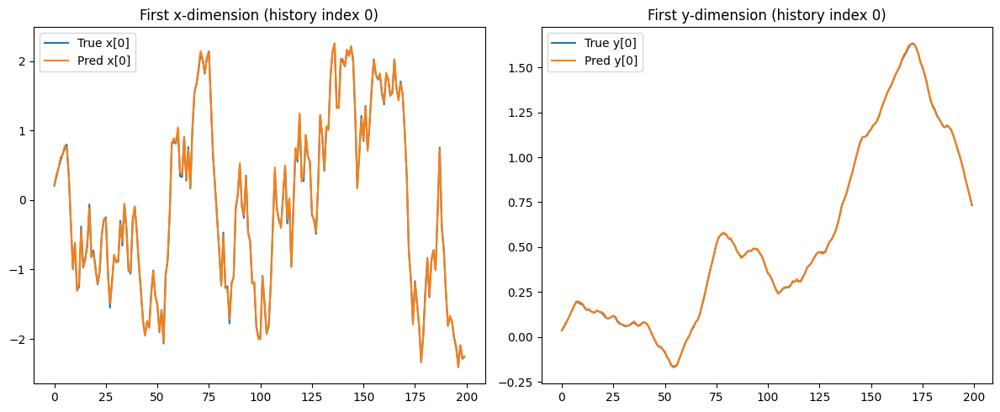

In [7]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchdiffeq import odeint
import numpy as np
import gym_oscillator.envs.osc_env as osc_env
import matplotlib.pyplot as plt

# 1. Collect data from the environment
env = osc_env.oscillatorEnv(len_state=8)
num_samples = 200000
states = []
actions = []
next_states = []

obs = env.reset()
for _ in range(num_samples):
    action = env.action_space.sample()
    # Save current state and action
    states.append(obs)
    actions.append(action)
    # Step the environment
    next_obs, reward, done, info = env.step(action)
    next_states.append(next_obs)
    obs = next_obs
    if done:
        obs = env.reset()

states = np.array(states)         # shape: (num_samples, 2, 8)
actions = np.array(actions)       # shape: (num_samples, 1)
next_states = np.array(next_states)  # shape: (num_samples, 2, 8)

# 2. Prepare data for PyTorch
state_dim = states.shape[1] * states.shape[2]  # 2*8 = 16
action_dim = actions.shape[1]                  # 1

torch_states = torch.tensor(states, dtype=torch.float32).view(-1, state_dim)         # (N, 16)
torch_actions = torch.tensor(actions, dtype=torch.float32).view(-1, action_dim)      # (N, 1)
torch_next_states = torch.tensor(next_states, dtype=torch.float32).view(-1, state_dim)  # (N, 16)

# 3. Define Neural ODE model
class ODEFunc(nn.Module):
    def __init__(self, state_dim, action_dim, hidden_dim=64):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(state_dim + action_dim, hidden_dim),
            nn.Tanh(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.Tanh(),
            nn.Linear(hidden_dim, state_dim)
        )

    def forward(self, t, state, action):
        # state: [batch, state_dim], action: [batch, action_dim]
        x = torch.cat([state, action], dim=1)
        return self.net(x)

class ODEBlock(nn.Module):
    def __init__(self, odefunc):
        super().__init__()
        self.odefunc = odefunc

    def forward(self, state, action, t):
        # Integrate only the state, action is constant over integration
        out = odeint(lambda t, y: self.odefunc(t, y, action), state, t)
        return out[-1]  # shape: [batch, state_dim]

# 4. Training loop
odefunc = ODEFunc(state_dim, action_dim)
odeblock = ODEBlock(odefunc)
optimizer = optim.Adam(odeblock.parameters(), lr=1e-3)
t = torch.tensor([0, 1], dtype=torch.float32)  # integrate from t=0 to t=1

num_epochs = 1000
batch_size = 128

for epoch in range(num_epochs):
    idx = np.random.choice(len(torch_states), batch_size)
    batch_state = torch_states[idx]
    batch_action = torch_actions[idx]
    batch_next_state = torch_next_states[idx]

    pred_next_state = odeblock(batch_state, batch_action, t)
    loss = nn.MSELoss()(pred_next_state, batch_next_state)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if (epoch + 1) % 100 == 0:
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {loss.item():.6f}")

# 5. Evaluation and visualization
with torch.no_grad():
    pred_next_states = odeblock(torch_states, torch_actions, t).numpy()

# Plot true vs predicted for the first element of x and y
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(torch_next_states.numpy()[:200, 0], label='True x[0]')
plt.plot(pred_next_states[:200, 0], label='Pred x[0]')
plt.legend()
plt.title('First x-dimension (history index 0)')

plt.subplot(1, 2, 2)
plt.plot(torch_next_states.numpy()[:200, 8], label='True y[0]')
plt.plot(pred_next_states[:200, 8], label='Pred y[0]')
plt.legend()
plt.title('First y-dimension (history index 0)')

plt.tight_layout()
plt.show()

### Test model on Unseen random data

Test MSE on unseen data: 0.000408


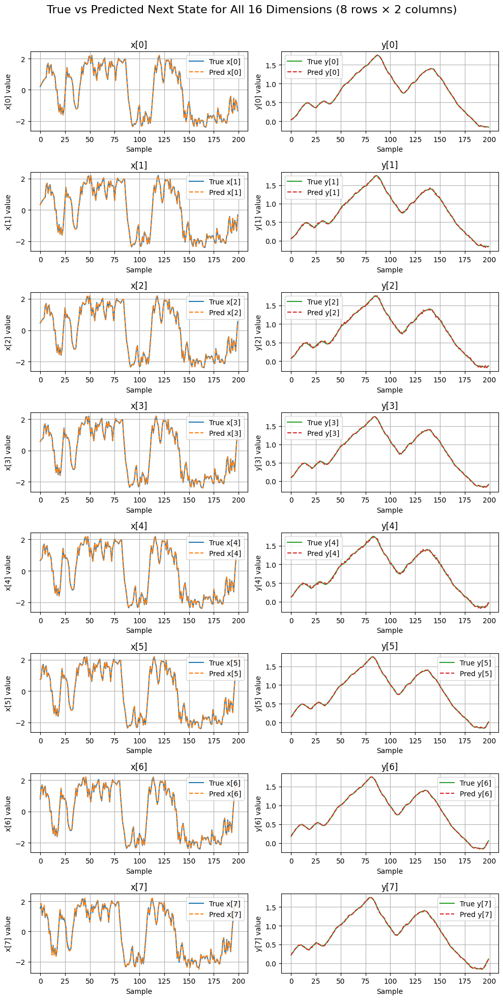

In [8]:
# 1. Collect unseen random data
test_env = osc_env.oscillatorEnv(len_state=8)
num_test_samples = 20000
test_states = []
test_actions = []
test_next_states = []

obs = test_env.reset()
for _ in range(num_test_samples):
    action = test_env.action_space.sample()
    test_states.append(obs)
    test_actions.append(action)
    next_obs, reward, done, info = test_env.step(action)
    test_next_states.append(next_obs)
    obs = next_obs
    if done:
        obs = test_env.reset()

test_states = np.array(test_states).reshape(num_test_samples, -1)         # (N, 16)
test_actions = np.array(test_actions).reshape(num_test_samples, -1)       # (N, 1)
test_next_states = np.array(test_next_states).reshape(num_test_samples, -1)  # (N, 16)

torch_test_states = torch.tensor(test_states, dtype=torch.float32)
torch_test_actions = torch.tensor(test_actions, dtype=torch.float32)
torch_test_next_states = torch.tensor(test_next_states, dtype=torch.float32)

# 2. Predict next state using the trained model
with torch.no_grad():
    pred_test_next_states = odeblock(torch_test_states, torch_test_actions, t).numpy()

# 3. Compute MSE for the test set
mse = np.mean((pred_test_next_states - test_next_states) ** 2)
print(f"Test MSE on unseen data: {mse:.6f}")

# 4. Visualize true vs predicted for all 16 dimensions in an 8x2 grid
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 20))
for i in range(8):
    # x dimension
    plt.subplot(8, 2, 2*i+1)
    plt.plot(test_next_states[:200, i], label=f'True x[{i}]', color='tab:blue')
    plt.plot(pred_test_next_states[:200, i], label=f'Pred x[{i}]', color='tab:orange', linestyle='--')
    plt.title(f'x[{i}]')
    plt.xlabel('Sample')
    plt.ylabel(f'x[{i}] value')
    plt.legend()
    plt.grid(True)

    # y dimension
    plt.subplot(8, 2, 2*i+2)
    plt.plot(test_next_states[:200, 8+i], label=f'True y[{i}]', color='tab:green')
    plt.plot(pred_test_next_states[:200, 8+i], label=f'Pred y[{i}]', color='tab:red', linestyle='--')
    plt.title(f'y[{i}]')
    plt.xlabel('Sample')
    plt.ylabel(f'y[{i}] value')
    plt.legend()
    plt.grid(True)

plt.suptitle('True vs Predicted Next State for All 16 Dimensions (8 rows × 2 columns)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

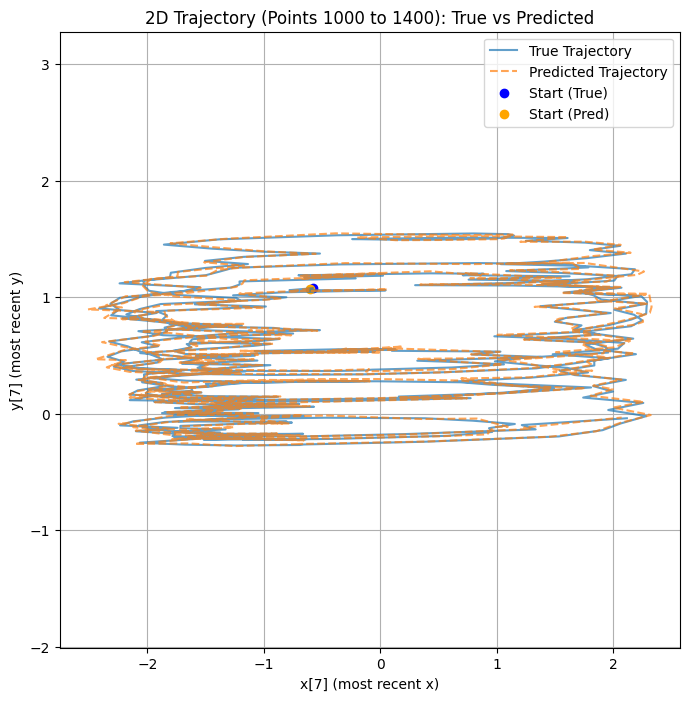

In [9]:
import matplotlib.pyplot as plt

start = 1000
end = 1400

true_x = test_next_states[start:end, 7]
true_y = test_next_states[start:end, 15]
pred_x = pred_test_next_states[start:end, 7]
pred_y = pred_test_next_states[start:end, 15]

plt.figure(figsize=(8, 8))
plt.plot(true_x, true_y, label='True Trajectory', color='tab:blue', alpha=0.7)
plt.plot(pred_x, pred_y, label='Predicted Trajectory', color='tab:orange', alpha=0.7, linestyle='--')
plt.scatter(true_x[0], true_y[0], color='blue', marker='o', label='Start (True)')
plt.scatter(pred_x[0], pred_y[0], color='orange', marker='o', label='Start (Pred)')
plt.xlabel('x[7] (most recent x)')
plt.ylabel('y[7] (most recent y)')
plt.title(f'2D Trajectory (Points {start} to {end}): True vs Predicted')
plt.legend()
plt.grid(True)
plt.axis('equal')
plt.show()

## Calculate Epistemic Uncertainty

In [10]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchdiffeq import odeint
import numpy as np
import gym_oscillator.envs.osc_env as osc_env
import matplotlib.pyplot as plt

# Evidential activation functions
def evidence(x):
    """Activation function to ensure positive evidence parameters"""
    return torch.log(1 + torch.exp(x))

def NIG_NLL(y_true, gamma, v, alpha, beta):
    """Normal Inverse-Gamma Negative Log-Likelihood"""
    v = torch.clamp(v, min=1e-6)
    alpha = torch.clamp(alpha, min=1.01)
    beta = torch.clamp(beta, min=1e-6)


    two_beta_lambda = 2 * beta * (1 + v)
    
    nll = 0.5 * torch.log(torch.pi / v) \
        - alpha * torch.log(two_beta_lambda) \
        + (alpha + 0.5) * torch.log(v * (y_true - gamma)**2 + two_beta_lambda) \
        + torch.lgamma(alpha) \
        - torch.lgamma(alpha + 0.5)
    
    return torch.mean(nll)

def NIG_Reg(y_true, gamma, v, alpha, beta, omega=0.01):
    """Regularization term for evidential learning"""
    error = torch.abs(y_true - gamma)
    evidence_term = 2 * v + alpha
    reg = error * evidence_term
    return torch.mean(reg)

def evidential_loss(y_true, evidential_output, coeff=1.0):
    """Complete evidential regression loss"""
    # Split the 4*state_dim output into 4 components
    gamma, v, alpha, beta = torch.chunk(evidential_output, 4, dim=-1)
    
    loss_nll = NIG_NLL(y_true, gamma, v, alpha, beta)
    loss_reg = NIG_Reg(y_true, gamma, v, alpha, beta)
    
    return loss_nll + coeff * loss_reg


class DenseNormalGamma(nn.Module):
    """
    Evidential layer that outputs Normal-Inverse-Gamma parameters
    """
    def __init__(self, input_dim, output_dim):
        super(DenseNormalGamma, self).__init__()
        self.input_dim = input_dim
        self.output_dim = output_dim
        # Output 4 times the desired dimension for evidential parameters
        self.dense = nn.Linear(input_dim, 4 * output_dim)

    def evidence(self, x):
        """Activation function to ensure positive evidence parameters"""
        return torch.log(1 + torch.exp(x))

    def forward(self, x):
        output = self.dense(x)
        # Split into 4 evidential parameters
        mu, logv, logalpha, logbeta = torch.chunk(output, 4, dim=-1)
        
        # Apply evidence activations to ensure positivity constraints
        v = self.evidence(logv)
        alpha = self.evidence(logalpha) + 1.0  # alpha > 1
        beta = self.evidence(logbeta)
        
        return torch.cat([mu, v, alpha, beta], dim=-1)

    def get_config(self):
        return {
            'input_dim': self.input_dim,
            'output_dim': self.output_dim
        }

class EvidentialLayer(nn.Module):
    """
    A general evidential layer that can be inserted into any network
    """
    def __init__(self, input_features, output_features, hidden_features=None):
        super(EvidentialLayer, self).__init__()
        self.input_features = input_features
        self.output_features = output_features
        
        if hidden_features is None:
            hidden_features = max(64, input_features)
        
        # Feature extraction layers
        self.feature_extractor = nn.Sequential(
            nn.Linear(input_features, hidden_features),
            nn.ReLU(),
            nn.Linear(hidden_features, hidden_features),
            nn.ReLU()
        )
        
        # Evidential output layer
        self.evidential_head = DenseNormalGamma(hidden_features, output_features)
    
    def forward(self, x):
        features = self.feature_extractor(x)
        evidential_output = self.evidential_head(features)
        return evidential_output

class EvidentialMLP(nn.Module):
    """
    Complete MLP with evidential output
    """
    def __init__(self, input_dim, output_dim, hidden_dims=[64, 64]):
        super(EvidentialMLP, self).__init__()
        
        layers = []
        prev_dim = input_dim
        
        # Hidden layers
        for hidden_dim in hidden_dims:
            layers.extend([
                nn.Linear(prev_dim, hidden_dim),
                nn.Tanh()  # or ReLU, depending on preference
            ])
            prev_dim = hidden_dim
        
        self.backbone = nn.Sequential(*layers)
        
        # Evidential output layer
        self.evidential_layer = DenseNormalGamma(prev_dim, output_dim)
    
    def forward(self, x):
        features = self.backbone(x)
        evidential_output = self.evidential_layer(features)
        return evidential_output


# class ODEFuncEvidential(nn.Module):
#     def __init__(self, state_dim, action_dim, hidden_dim=64):
#         super().__init__()
#         self.state_dim = state_dim
        
#         # Use the evidential MLP instead of raw linear layers
#         self.evidential_net = EvidentialMLP(
#             input_dim=state_dim + action_dim,
#             output_dim=state_dim,
#             hidden_dims=[hidden_dim, hidden_dim, hidden_dim]
#         )

#     def forward(self, t, state, action):
#         # state: [batch, state_dim], action: [batch, action_dim]
#         x = torch.cat([state, action], dim=1)
#         evidential_output = self.evidential_net(x)
        
#         # Extract only gamma (mean) for ODE integration
#         gamma, v, alpha, beta = torch.chunk(evidential_output, 4, dim=-1)
#         return gamma


# class ODEBlockEvidential(nn.Module):
#     def __init__(self, odefunc):
#         super().__init__()
#         self.odefunc = odefunc

#     def forward(self, state, action, t):
#         # Integrate only the mean (gamma)
#         out = odeint(lambda t, y: self.odefunc(t, y, action), state, t)
#         return out[-1]  # shape: [batch, state_dim]
    
#     def get_evidential_output(self, state, action):
#         """Get full evidential parameters without ODE integration"""
#         x = torch.cat([state, action], dim=1)
#         evidential_output = self.odefunc.evidential_net(x)
#         return evidential_output
    
#     def get_uncertainties(self, state, action):
#         """Directly get uncertainties without raw evidential parameters"""
#         evidential_output = self.get_evidential_output(state, action)
#         return extract_uncertainties(evidential_output)


class MLP(nn.Module):
    def __init__(self, in_dim, out_dim, hidden=[64, 64, 64], act=nn.Tanh):
        super().__init__()
        layers, d = [], in_dim
        for h in hidden:
            layers += [nn.Linear(d, h), act()]
            d = h
        layers.append(nn.Linear(d, out_dim))
        self.net = nn.Sequential(*layers)
    def forward(self, x): return self.net(x)

class ODEFunc(nn.Module):
    """dx/dt = f_theta(x, u)  (no evidential params here)"""
    def __init__(self, state_dim, action_dim, hidden=64):
        super().__init__()
        self.f = MLP(state_dim + action_dim, state_dim, hidden=[hidden]*3, act=nn.Tanh)
    def forward(self, t, x, u):
        xu = torch.cat([x, u], dim=-1)
        return self.f(xu)

class ODEBlock(nn.Module):
    """Integrates x_{t+Δt} = ODE(x_t, u)"""
    def __init__(self, func: ODEFunc):
        super().__init__()
        self.func = func
    def forward(self, x0, u, t):  # t: tensor([t0, t1])
        dyn = lambda tt, x: self.func(tt, x, u)
        x_traj = odeint(dyn, x0, t)        # [len(t)=2, B, state_dim]
        return x_traj[-1]                  # μ̂ (mean next state)

class EviNeuralODE(nn.Module):
    def __init__(self, state_dim, action_dim, hidden=64):
        super().__init__()
        self.func = ODEFunc(state_dim, action_dim, hidden)
        self.ode  = ODEBlock(self.func)
        self.unc  = UncertaintyHead(state_dim, action_dim, hidden)
    def forward(self, x, u, t):
        mu_hat = self.ode(x, u, t)         # predictive mean of next state
        v, alpha, beta = self.unc(x, u)    # evidential params
        return mu_hat, v, alpha, beta

In [11]:
class UncertaintyHead(nn.Module):
    """Predict (v, alpha, beta) for next-state NIG from (x,u)"""
    def __init__(self, state_dim, action_dim, hidden=64):
        super().__init__()
        self.backbone = nn.Sequential(
            nn.Linear(state_dim + action_dim, hidden), nn.ReLU(),
            nn.Linear(hidden, hidden), nn.ReLU(),
            nn.Linear(hidden, 3 * state_dim)
        )
    def forward(self, x, u):
        out = self.backbone(torch.cat([x, u], dim=-1))
        logv, logalpha, logbeta = torch.chunk(out, 3, dim=-1)
        v = evidence(logv)
        alpha = evidence(logalpha) + 1.0   # ensure >1
        beta = evidence(logbeta)
        return v, alpha, beta

In [12]:
# # Training loop with evidential loss
# odefunc = ODEFuncEvidential(state_dim, action_dim)
# odeblock = ODEBlockEvidential(odefunc)
# optimizer = optim.Adam(odeblock.parameters(), lr=1e-3)
# t = torch.tensor([0, 1], dtype=torch.float32)  # integrate from t=0 to t=1

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = EviNeuralODE(state_dim, action_dim, hidden=64).to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-3)

dt = 1.0  # set this to your env step (replace 1.0 if needed)
t = torch.tensor([0.0, dt], dtype=torch.float32, device=device)

num_epochs = 1000
batch_size = 128

# Store training losses for monitoring
train_losses = []
nll_losses = []
reg_losses = []

torch_states = torch_states.to(device)
torch_actions = torch_actions.to(device)
torch_next_states = torch_next_states.to(device)

reg_coeff_base = 0.01
warmup = max(50, num_epochs // 10)

for epoch in range(num_epochs):
    idx = torch.randint(0, torch_states.shape[0], (batch_size,))
    batch_state = torch_states[idx]
    batch_action = torch_actions[idx]
    batch_next_state = torch_next_states[idx]

    # forward: integrate to get mean next state, get evidential params from (x,u)
    mu_hat, v, alpha, beta = model(batch_state, batch_action, t)

    # evidential losses using μ̂ as γ
    loss_nll = NIG_NLL(batch_next_state, mu_hat, v, alpha, beta)
    # small anneal for stability
    coeff = reg_coeff_base * min(1.0, (epoch+1)/max(1, warmup))
    loss_reg = NIG_Reg(batch_next_state, mu_hat, v, alpha, beta)
    loss = loss_nll + coeff * loss_reg

    optimizer.zero_grad()
    loss.backward()
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
    optimizer.step()

    train_losses.append(loss.item())
    nll_losses.append(loss_nll.item())
    reg_losses.append(loss_reg.item())

    if (epoch + 1) % 100 == 0:
        print(f"Epoch {epoch+1}/{num_epochs} | NLL {loss_nll.item():.6f} | Reg {loss_reg.item():.6f} | Total {loss.item():.6f}")

print("Training completed!")

Epoch 100/1000 | NLL -1.381684 | Reg 1.005329 | Total -1.371631
Epoch 200/1000 | NLL -1.509420 | Reg 1.067667 | Total -1.498744
Epoch 300/1000 | NLL -1.686034 | Reg 1.031546 | Total -1.675719
Epoch 400/1000 | NLL -1.854960 | Reg 0.924091 | Total -1.845719
Epoch 500/1000 | NLL -1.985486 | Reg 0.875907 | Total -1.976727
Epoch 600/1000 | NLL -2.033186 | Reg 0.792844 | Total -2.025258
Epoch 700/1000 | NLL -2.301337 | Reg 0.734803 | Total -2.293989
Epoch 800/1000 | NLL -2.388011 | Reg 0.699097 | Total -2.381021
Epoch 900/1000 | NLL -2.600749 | Reg 0.595858 | Total -2.594791
Epoch 1000/1000 | NLL -2.785470 | Reg 0.534859 | Total -2.780122
Training completed!


In [13]:
# def extract_uncertainties(evidential_output):
#     """Extract epistemic and aleatoric uncertainties from evidential parameters"""
#     gamma, v, alpha, beta = torch.chunk(evidential_output, 4, dim=-1)
    
#     # Ensure numerical stability
#     alpha = torch.clamp(alpha, min=1.01)
#     v = torch.clamp(v, min=1e-6)
#     beta = torch.clamp(beta, min=1e-6)
    
#     # Predictive mean
#     mu = gamma
    
#     # Aleatoric uncertainty (inherent data noise)
#     aleatoric_uncertainty = beta / (alpha - 1)
    
#     # Epistemic uncertainty (model uncertainty)
#     epistemic_uncertainty = beta / (v * (alpha - 1))
    
#     # Total predictive uncertainty
#     total_uncertainty = aleatoric_uncertainty + epistemic_uncertainty
    
#     return mu, epistemic_uncertainty, aleatoric_uncertainty, total_uncertainty

@torch.no_grad()
def extract_uncertainties(model, x, u, t):
    mu_hat, v, alpha, beta = model(x, u, t)
    alpha = torch.clamp(alpha, min=1.01)
    v = torch.clamp(v, min=1e-6)
    beta = torch.clamp(beta, min=1e-6)
    aleatoric = beta / (alpha - 1.0)
    epistemic = beta / (v * (alpha - 1.0))
    total = aleatoric + epistemic
    return mu_hat, epistemic, aleatoric, total

model.eval()

# pick test samples (GPU-safe)
test_size = min(5000, torch_states.shape[0])
idx = torch.randint(0, torch_states.shape[0], (test_size,),
                    device=torch_states.device)

test_states       = torch_states[idx]
test_actions      = torch_actions[idx]
test_next_states  = torch_next_states[idx]

with torch.no_grad():
    # Get predictive mean and uncertainties via the refactored API
    pred_mean, epistemic_unc, aleatoric_unc, total_unc = extract_uncertainties(
        model, test_states, test_actions, t
    )

    # Move to CPU before NumPy
    pred_mean_np      = pred_mean.detach().cpu().numpy()
    epistemic_unc_np  = epistemic_unc.detach().cpu().numpy()
    aleatoric_unc_np  = aleatoric_unc.detach().cpu().numpy()
    total_unc_np      = total_unc.detach().cpu().numpy()
    test_true_np      = test_next_states.detach().cpu().numpy()

# Errors
pred_errors = np.abs(test_true_np - pred_mean_np)

print(f"Mean Absolute Error: {np.mean(pred_errors):.6f}")
print(f"Mean Epistemic Uncertainty: {np.mean(epistemic_unc_np):.6f}")
print(f"Mean Aleatoric Uncertainty: {np.mean(aleatoric_unc_np):.6f}")
print(f"Mean Total Uncertainty: {np.mean(total_unc_np):.6f}")

Mean Absolute Error: 0.053349
Mean Epistemic Uncertainty: 0.005167
Mean Aleatoric Uncertainty: 0.007094
Mean Total Uncertainty: 0.012261


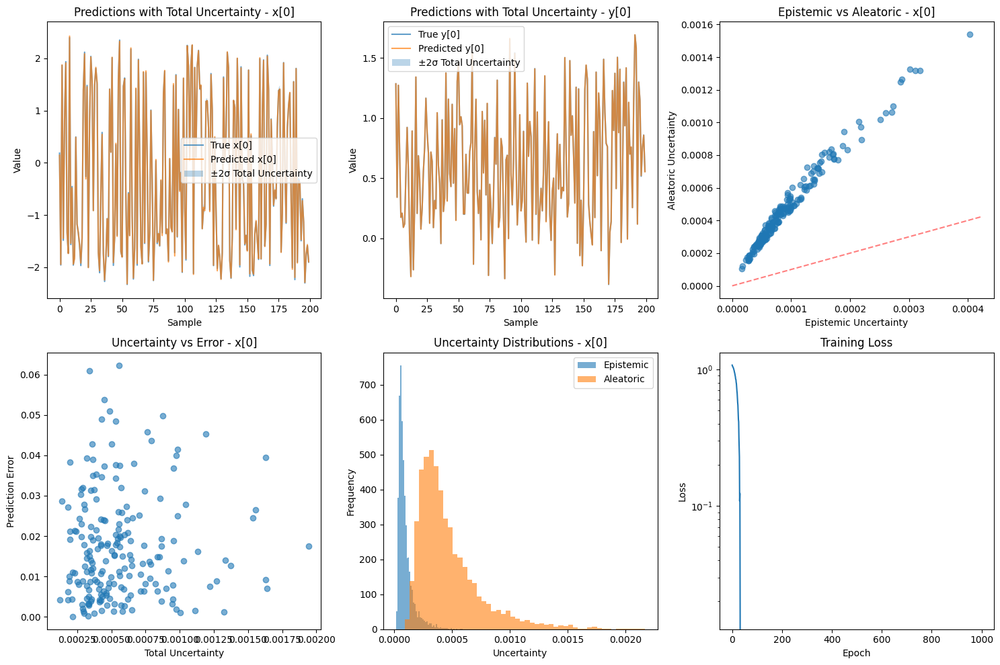


Correlations with prediction error:
Epistemic Uncertainty: 0.0836
Total Uncertainty: 0.0956


In [14]:
# Visualize predictions with uncertainties
n_points = 200
plt.figure(figsize=(15, 10))

# Plot for first state dimension (x[0])
plt.subplot(2, 3, 1)
plt.plot(test_true_np[:n_points, 0], label='True x[0]', alpha=0.7)
plt.plot(pred_mean_np[:n_points, 0], label='Predicted x[0]', alpha=0.7)
plt.fill_between(range(n_points), 
                 pred_mean_np[:n_points, 0] - 2*np.sqrt(total_unc_np[:n_points, 0]),
                 pred_mean_np[:n_points, 0] + 2*np.sqrt(total_unc_np[:n_points, 0]),
                 alpha=0.3, label='±2σ Total Uncertainty')
plt.legend()
plt.title('Predictions with Total Uncertainty - x[0]')
plt.xlabel('Sample')
plt.ylabel('Value')

# Plot for first y dimension (y[0])
plt.subplot(2, 3, 2)
plt.plot(test_true_np[:n_points, 8], label='True y[0]', alpha=0.7)
plt.plot(pred_mean_np[:n_points, 8], label='Predicted y[0]', alpha=0.7)
plt.fill_between(range(n_points),
                 pred_mean_np[:n_points, 8] - 2*np.sqrt(total_unc_np[:n_points, 8]),
                 pred_mean_np[:n_points, 8] + 2*np.sqrt(total_unc_np[:n_points, 8]),
                 alpha=0.3, label='±2σ Total Uncertainty')
plt.legend()
plt.title('Predictions with Total Uncertainty - y[0]')
plt.xlabel('Sample')
plt.ylabel('Value')

# Epistemic vs Aleatoric Uncertainty
plt.subplot(2, 3, 3)
plt.scatter(epistemic_unc_np[:n_points, 0], aleatoric_unc_np[:n_points, 0], alpha=0.6)
plt.xlabel('Epistemic Uncertainty')
plt.ylabel('Aleatoric Uncertainty')
plt.title('Epistemic vs Aleatoric - x[0]')
plt.plot([0, plt.xlim()[1]], [0, plt.xlim()[1]], 'r--', alpha=0.5)

# Uncertainty vs Error correlation
plt.subplot(2, 3, 4)
plt.scatter(total_unc_np[:n_points, 0], pred_errors[:n_points, 0], alpha=0.6)
plt.xlabel('Total Uncertainty')
plt.ylabel('Prediction Error')
plt.title('Uncertainty vs Error - x[0]')

# Distribution of uncertainties
plt.subplot(2, 3, 5)
plt.hist(epistemic_unc_np[:, 0], bins=50, alpha=0.6, label='Epistemic')
plt.hist(aleatoric_unc_np[:, 0], bins=50, alpha=0.6, label='Aleatoric')
plt.xlabel('Uncertainty')
plt.ylabel('Frequency')
plt.title('Uncertainty Distributions - x[0]')
plt.legend()

# Training loss
plt.subplot(2, 3, 6)
plt.plot(train_losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.yscale('log')

plt.tight_layout()
plt.show()

# Correlation between uncertainty and error
correlation_epistemic = np.corrcoef(epistemic_unc_np[:, 0], pred_errors[:, 0])[0, 1]
correlation_total = np.corrcoef(total_unc_np[:, 0], pred_errors[:, 0])[0, 1]

print(f"\nCorrelations with prediction error:")
print(f"Epistemic Uncertainty: {correlation_epistemic:.4f}")
print(f"Total Uncertainty: {correlation_total:.4f}")

### Evaluate the Neural ODE + Epistemic Uncertainty

=== EVIDENTIAL NEURAL ODE EVALUATION ON UNSEEN DATA ===
Test MSE:  0.011885
Test MAE:  0.052867
Test RMSE: 0.109020

Uncertainty Statistics:
Mean Epistemic Uncertainty: 0.005270
Mean Aleatoric Uncertainty: 0.007206
Mean Total Uncertainty:     0.012477
Epistemic/Total Ratio:       0.422

Uncertainty-Error Correlations:
Epistemic-Error Correlation: 0.6688
Total-Error Correlation:     0.6951


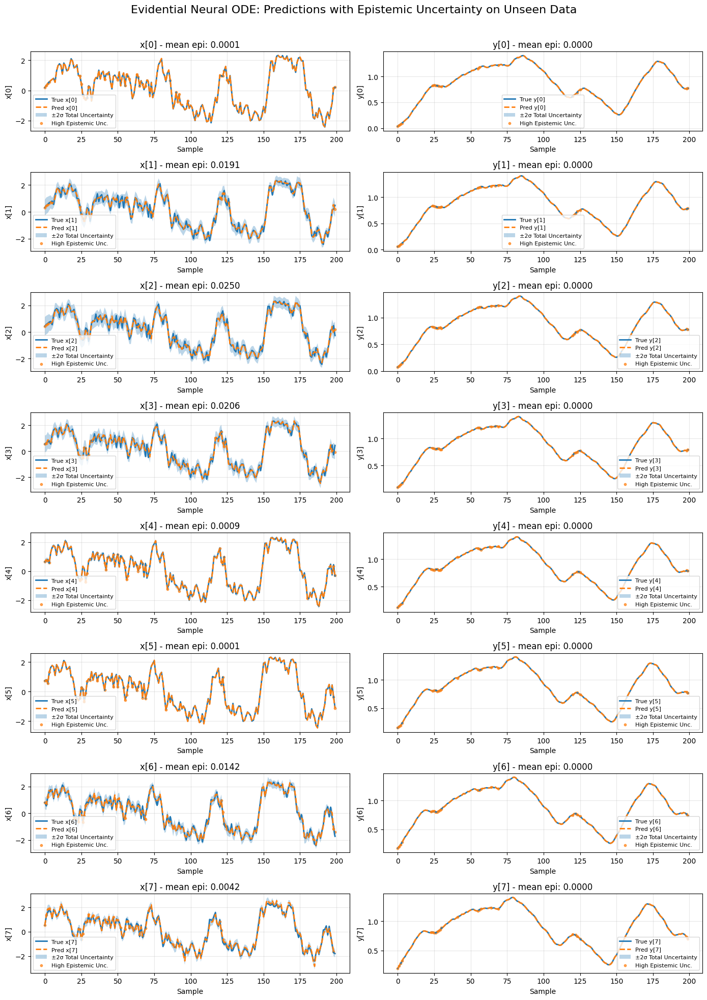

In [15]:
# 1) Collect unseen random data
test_env = osc_env.oscillatorEnv(len_state=8)
num_test_samples = 20000
test_states, test_actions, test_next_states = [], [], []

# Gym API compatibility (old/new)
reset_out = test_env.reset()
obs = reset_out[0] if isinstance(reset_out, tuple) else reset_out

for _ in range(num_test_samples):
    action = test_env.action_space.sample()
    test_states.append(obs)
    test_actions.append(action)

    step_out = test_env.step(action)
    if len(step_out) == 5:
        next_obs, reward, terminated, truncated, info = step_out
        done = terminated or truncated
    else:
        next_obs, reward, done, info = step_out

    test_next_states.append(next_obs)
    obs = next_obs
    if done:
        reset_out = test_env.reset()
        obs = reset_out[0] if isinstance(reset_out, tuple) else reset_out

# Numpy arrays
test_states       = np.asarray(test_states, dtype=np.float32).reshape(num_test_samples, -1)       # (N, 16)
test_actions      = np.asarray(test_actions, dtype=np.float32).reshape(num_test_samples, -1)      # (N, 1) if that’s your env
test_next_states  = np.asarray(test_next_states, dtype=np.float32).reshape(num_test_samples, -1)  # (N, 16)

# Torch tensors on the same device as the model
torch_test_states       = torch.from_numpy(test_states).to(device)
torch_test_actions      = torch.from_numpy(test_actions).to(device)
torch_test_next_states  = torch.from_numpy(test_next_states).to(device)

# 2) Predict next state using the trained evidential Neural ODE
model.eval()
with torch.no_grad():
    # Predictive mean and uncertainties around the integrated next state
    pred_mean, epistemic_unc, aleatoric_unc, total_unc = extract_uncertainties(
        model, torch_test_states, torch_test_actions, t
    )

    # (Optional) raw ODE rollout (this equals pred_mean's μ̂)
    pred_test_next_states_ode = model.ode(torch_test_states, torch_test_actions, t)

    # Move to CPU NumPy
    pred_test_next_states = pred_mean.detach().cpu().numpy()
    epistemic_unc_np      = epistemic_unc.detach().cpu().numpy()
    aleatoric_unc_np      = aleatoric_unc.detach().cpu().numpy()
    total_unc_np          = total_unc.detach().cpu().numpy()
    test_true_np          = torch_test_next_states.detach().cpu().numpy()
    # If you want the separate ODE rollout for comparison:
    pred_test_next_states_ode_np = pred_test_next_states_ode.detach().cpu().numpy()

# 3) Metrics
mse  = np.mean((pred_test_next_states - test_next_states) ** 2)
mae  = np.mean(np.abs(pred_test_next_states - test_next_states))
rmse = np.sqrt(mse)

mean_epistemic = np.mean(epistemic_unc_np)
mean_aleatoric = np.mean(aleatoric_unc_np)
mean_total     = np.mean(total_unc_np)

pred_errors = np.abs(pred_test_next_states - test_next_states)

epistemic_error_corr = np.corrcoef(epistemic_unc_np.flatten(), pred_errors.flatten())[0, 1]
total_error_corr     = np.corrcoef(total_unc_np.flatten(),     pred_errors.flatten())[0, 1]

print("=== EVIDENTIAL NEURAL ODE EVALUATION ON UNSEEN DATA ===")
print(f"Test MSE:  {mse:.6f}")
print(f"Test MAE:  {mae:.6f}")
print(f"Test RMSE: {rmse:.6f}")
print("\nUncertainty Statistics:")
print(f"Mean Epistemic Uncertainty: {mean_epistemic:.6f}")
print(f"Mean Aleatoric Uncertainty: {mean_aleatoric:.6f}")
print(f"Mean Total Uncertainty:     {mean_total:.6f}")
print(f"Epistemic/Total Ratio:       {mean_epistemic/mean_total:.3f}")
print("\nUncertainty-Error Correlations:")
print(f"Epistemic-Error Correlation: {epistemic_error_corr:.4f}")
print(f"Total-Error Correlation:     {total_error_corr:.4f}")

# 4) Visualization
import matplotlib.pyplot as plt
plt.figure(figsize=(14, 20))
samples = slice(0, 200)

for i in range(8):
    # x[i]
    plt.subplot(8, 2, 2*i+1)
    plt.plot(test_next_states[samples, i],             label=f'True x[{i}]', linewidth=2)
    plt.plot(pred_test_next_states[samples, i],        label=f'Pred x[{i}]', linestyle='--', linewidth=2)
    ub = pred_test_next_states[samples, i] + 2*np.sqrt(total_unc_np[samples, i])
    lb = pred_test_next_states[samples, i] - 2*np.sqrt(total_unc_np[samples, i])
    plt.fill_between(range(200), lb, ub, alpha=0.3, label='±2σ Total Uncertainty')

    high_epi_mask = epistemic_unc_np[samples, i] > np.percentile(epistemic_unc_np[:, i], 90)
    if np.any(high_epi_mask):
        idxs = np.where(high_epi_mask)[0]
        plt.scatter(idxs, pred_test_next_states[samples, i][high_epi_mask], s=10, alpha=0.7, label='High Epistemic Unc.')

    plt.title(f'x[{i}] - mean epi: {np.mean(epistemic_unc_np[:, i]):.4f}')
    plt.xlabel('Sample'); plt.ylabel(f'x[{i}]'); plt.legend(fontsize=8); plt.grid(True, alpha=0.3)

    # y[i]
    plt.subplot(8, 2, 2*i+2)
    plt.plot(test_next_states[samples, 8+i],          label=f'True y[{i}]', linewidth=2)
    plt.plot(pred_test_next_states[samples, 8+i],     label=f'Pred y[{i}]', linestyle='--', linewidth=2)
    ub = pred_test_next_states[samples, 8+i] + 2*np.sqrt(total_unc_np[samples, 8+i])
    lb = pred_test_next_states[samples, 8+i] - 2*np.sqrt(total_unc_np[samples, 8+i])
    plt.fill_between(range(200), lb, ub, alpha=0.3, label='±2σ Total Uncertainty')

    high_epi_mask = epistemic_unc_np[samples, 8+i] > np.percentile(epistemic_unc_np[:, 8+i], 90)
    if np.any(high_epi_mask):
        idxs = np.where(high_epi_mask)[0]
        plt.scatter(idxs, pred_test_next_states[samples, 8+i][high_epi_mask], s=10, alpha=0.7, label='High Epistemic Unc.')

    plt.title(f'y[{i}] - mean epi: {np.mean(epistemic_unc_np[:, 8+i]):.4f}')
    plt.xlabel('Sample'); plt.ylabel(f'y[{i}]'); plt.legend(fontsize=8); plt.grid(True, alpha=0.3)

plt.suptitle('Evidential Neural ODE: Predictions with Epistemic Uncertainty on Unseen Data', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

## Check the trained model and its response to a stimuli 

In [36]:
def comprehensive_model_vs_system_test(odeblock, test_env, num_episodes=10, episode_length=100, 
                                       control_interval=10, comparison_length=50, 
                                       use_ode_integration=False):
    """
    Test trained evidential neural ODE model against actual RL-DBS system.

    When use_ode_integration=False (default), compares env next_state to the evidential mean
    (direct next-state prediction, consistent with your current training).
    If you later train the model on derivatives (gamma ≈ dy/dt), set use_ode_integration=True
    to compare env next_state to the ODE-integrated prediction instead.
    """
    results = {
        'episode_metrics': [],
        'prediction_errors': [],
        'uncertainties': [],
        'system_states': [],
        'model_predictions': [],
        'actions_applied': [],
        'divergence_points': []
    }

    t_integration = torch.tensor([0, 1], dtype=torch.float32)

    for episode in range(num_episodes):
        print(f"Testing Episode {episode + 1}/{num_episodes}")

        system_state_2d = test_env.reset()
        system_state = system_state_2d.flatten()

        episode_results = {
            'mse_values': [],
            'mae_values': [],
            'epistemic_uncertainties': [],
            'aleatoric_uncertainties': [],
            'total_uncertainties': [],
            'max_divergence': 0,
            'divergence_timestep': -1
        }

        episode_system_states = []
        episode_model_predictions = []
        episode_actions = []
        episode_pred_errors = []
        episode_uncertainties = []

        for step in range(episode_length):
            current_system_state = system_state.copy()

            if step % control_interval == 0:
                random_action = test_env.action_space.sample()
                print(f"  Step {step}: Applying random action {random_action}")
            else:
                random_action = np.array([0.0])

            next_system_state_2d, _, done, _ = test_env.step(random_action)
            next_system_state = next_system_state_2d.flatten()

            with torch.no_grad():
                torch_state = torch.tensor(current_system_state, dtype=torch.float32).unsqueeze(0)
                torch_action = torch.tensor(random_action, dtype=torch.float32).unsqueeze(0)

                # Evidential prediction (direct next-state) + uncertainties
                evidential_output = odeblock.get_evidential_output(torch_state, torch_action)
                pred_mean, epistemic_unc, aleatoric_unc, total_unc = extract_uncertainties(evidential_output)

                if use_ode_integration:
                    # Only sensible if the model was trained on derivatives (gamma ≈ dy/dt)
                    ode_next = odeblock(torch_state, torch_action, t_integration)
                    model_prediction = ode_next.squeeze(0).numpy()
                else:
                    # This matches how you computed metrics elsewhere (no integration)
                    model_prediction = pred_mean.squeeze(0).numpy()

                epistemic_unc_np = epistemic_unc.squeeze(0).numpy()
                aleatoric_unc_np = aleatoric_unc.squeeze(0).numpy()
                total_unc_np = total_unc.squeeze(0).numpy()

            pred_error = np.abs(next_system_state - model_prediction)
            mse_step = np.mean((next_system_state - model_prediction) ** 2)
            mae_step = np.mean(pred_error)

            max_error_step = np.max(pred_error)
            if max_error_step > episode_results['max_divergence']:
                episode_results['max_divergence'] = max_error_step
                episode_results['divergence_timestep'] = step

            episode_system_states.append(next_system_state)
            episode_model_predictions.append(model_prediction)
            episode_actions.append(random_action)
            episode_pred_errors.append(pred_error)
            episode_uncertainties.append({
                'epistemic': epistemic_unc_np,
                'aleatoric': aleatoric_unc_np,
                'total': total_unc_np
            })

            episode_results['mse_values'].append(mse_step)
            episode_results['mae_values'].append(mae_step)
            episode_results['epistemic_uncertainties'].append(np.mean(epistemic_unc_np))
            episode_results['aleatoric_uncertainties'].append(np.mean(aleatoric_unc_np))
            episode_results['total_uncertainties'].append(np.mean(total_unc_np))

            system_state = next_system_state
            if done:
                print(f"  Episode terminated early at step {step}")
                break

        episode_results['mean_mse'] = np.mean(episode_results['mse_values'])
        episode_results['mean_mae'] = np.mean(episode_results['mae_values'])
        episode_results['mean_epistemic'] = np.mean(episode_results['epistemic_uncertainties'])
        episode_results['mean_aleatoric'] = np.mean(episode_results['aleatoric_uncertainties'])
        episode_results['mean_total_uncertainty'] = np.mean(episode_results['total_uncertainties'])

        results['episode_metrics'].append(episode_results)
        results['system_states'].append(np.array(episode_system_states))
        results['model_predictions'].append(np.array(episode_model_predictions))
        results['actions_applied'].append(np.array(episode_actions))
        results['prediction_errors'].append(np.array(episode_pred_errors))
        results['uncertainties'].append(episode_uncertainties)

        print(f"  Episode {episode + 1} Results:")
        print(f"    Mean MSE: {episode_results['mean_mse']:.6f}")
        print(f"    Mean MAE: {episode_results['mean_mae']:.6f}")
        print(f"    Mean Epistemic Uncertainty: {episode_results['mean_epistemic']:.6f}")
        print(f"    Max Divergence: {episode_results['max_divergence']:.6f} at step {episode_results['divergence_timestep']}")

    all_mse = [ep['mean_mse'] for ep in results['episode_metrics']]
    all_mae = [ep['mean_mae'] for ep in results['episode_metrics']]
    all_epistemic = [ep['mean_epistemic'] for ep in results['episode_metrics']]
    all_aleatoric = [ep['mean_aleatoric'] for ep in results['episode_metrics']]
    all_total_unc = [ep['mean_total_uncertainty'] for ep in results['episode_metrics']]
    all_max_divergence = [ep['max_divergence'] for ep in results['episode_metrics']]

    results['overall_metrics'] = {
        'mean_mse': np.mean(all_mse),
        'std_mse': np.std(all_mse),
        'mean_mae': np.mean(all_mae),
        'std_mae': np.std(all_mae),
        'mean_epistemic_uncertainty': np.mean(all_epistemic),
        'mean_aleatoric_uncertainty': np.mean(all_aleatoric),
        'mean_total_uncertainty': np.mean(all_total_unc),
        'max_divergence_across_episodes': np.max(all_max_divergence),
        'mean_max_divergence': np.mean(all_max_divergence)
    }

    print("\n=== OVERALL TEST RESULTS ===")
    print(f"Mean MSE across episodes: {results['overall_metrics']['mean_mse']:.6f} ± {results['overall_metrics']['std_mse']:.6f}")
    print(f"Mean MAE across episodes: {results['overall_metrics']['mean_mae']:.6f} ± {results['overall_metrics']['std_mae']:.6f}")
    print(f"Mean Epistemic Uncertainty: {results['overall_metrics']['mean_epistemic_uncertainty']:.6f}")
    print(f"Mean Aleatoric Uncertainty: {results['overall_metrics']['mean_aleatoric_uncertainty']:.6f}")
    print(f"Mean Total Uncertainty: {results['overall_metrics']['mean_total_uncertainty']:.6f}")
    print(f"Maximum Divergence: {results['overall_metrics']['max_divergence_across_episodes']:.6f}")
    print(f"Average Maximum Divergence: {results['overall_metrics']['mean_max_divergence']:.6f}")

    return results


def plot_test_results(test_results, episode_idx=0, state_dims_to_plot=None):
    """
    Plot the test results for a specific episode - now plots all 16 dimensions like the evaluation code
    
    Args:
        test_results: Results from comprehensive_model_vs_system_test
        episode_idx: Which episode to plot (default: 0)
        state_dims_to_plot: List of state dimensions to plot (default: all 16)
    """
    if state_dims_to_plot is None:
        # Plot all 16 dimensions (8 x + 8 y) like in your evaluation code
        state_dims_to_plot = list(range(16))
    
    system_states = test_results['system_states'][episode_idx]
    model_predictions = test_results['model_predictions'][episode_idx]
    actions = test_results['actions_applied'][episode_idx]
    uncertainties = test_results['uncertainties'][episode_idx]
    
    # Extract uncertainty arrays
    epistemic_uncertainties = np.array([u['epistemic'] for u in uncertainties])
    total_uncertainties = np.array([u['total'] for u in uncertainties])
    
    # Create the same 8x2 grid layout as your evaluation code
    plt.figure(figsize=(14, 20))
    
    for i in range(8):
        # x dimension with uncertainty
        plt.subplot(8, 2, 2*i+1)
        
        # Plot true values (actual system)
        plt.plot(system_states[:, i], label=f'True x[{i}]', color='tab:blue', linewidth=2)
        
        # Plot predictions (model)
        plt.plot(model_predictions[:, i], label=f'Pred x[{i}]', color='tab:orange', linestyle='--', linewidth=2)
        
        # Plot uncertainty bounds (±2σ)
        upper_bound = model_predictions[:, i] + 2 * np.sqrt(total_uncertainties[:, i])
        lower_bound = model_predictions[:, i] - 2 * np.sqrt(total_uncertainties[:, i])
        
        plt.fill_between(range(len(system_states)), lower_bound, upper_bound, 
                        alpha=0.3, color='tab:gray', label='±2σ Total Uncertainty')
        
        # Highlight high epistemic uncertainty regions
        high_epistemic = epistemic_uncertainties[:, i] > np.percentile(epistemic_uncertainties[:, i], 90)
        if np.any(high_epistemic):
            plt.scatter(np.where(high_epistemic)[0], 
                       model_predictions[high_epistemic, i], 
                       color='red', s=10, alpha=0.7, label='High Epistemic Unc.')
        
        # Mark action application points (every 10 timesteps with non-zero actions)
        action_points = np.where(actions.flatten() != 0)[0]
        if len(action_points) > 0:
            for ap in action_points:
                plt.axvline(x=ap, color='green', alpha=0.5, linestyle=':', linewidth=1)
            # Add label only once
            plt.axvline(x=action_points[0], color='green', alpha=0.5, linestyle=':', 
                       linewidth=1, label='Action Applied')
        
        plt.title(f'x[{i}] - Epistemic Unc: {np.mean(epistemic_uncertainties[:, i]):.4f}')
        plt.xlabel('Timestep')
        plt.ylabel(f'x[{i}] value')
        plt.legend(fontsize=8)
        plt.grid(True, alpha=0.3)

        # y dimension with uncertainty
        plt.subplot(8, 2, 2*i+2)
        
        # Plot true values (actual system)
        plt.plot(system_states[:, 8+i], label=f'True y[{i}]', color='tab:green', linewidth=2)
        
        # Plot predictions (model)
        plt.plot(model_predictions[:, 8+i], label=f'Pred y[{i}]', color='tab:red', linestyle='--', linewidth=2)
        
        # Plot uncertainty bounds (±2σ)
        upper_bound = model_predictions[:, 8+i] + 2 * np.sqrt(total_uncertainties[:, 8+i])
        lower_bound = model_predictions[:, 8+i] - 2 * np.sqrt(total_uncertainties[:, 8+i])
        
        plt.fill_between(range(len(system_states)), lower_bound, upper_bound, 
                        alpha=0.3, color='tab:gray', label='±2σ Total Uncertainty')
        
        # Highlight high epistemic uncertainty regions
        high_epistemic = epistemic_uncertainties[:, 8+i] > np.percentile(epistemic_uncertainties[:, 8+i], 90)
        if np.any(high_epistemic):
            plt.scatter(np.where(high_epistemic)[0], 
                       model_predictions[high_epistemic, 8+i], 
                       color='red', s=10, alpha=0.7, label='High Epistemic Unc.')
        
        # Mark action application points
        if len(action_points) > 0:
            for ap in action_points:
                plt.axvline(x=ap, color='green', alpha=0.5, linestyle=':', linewidth=1)
            # Add label only once
            plt.axvline(x=action_points[0], color='green', alpha=0.5, linestyle=':', 
                       linewidth=1, label='Action Applied')
        
        plt.title(f'y[{i}] - Epistemic Unc: {np.mean(epistemic_uncertainties[:, 8+i]):.4f}')
        plt.xlabel('Timestep')
        plt.ylabel(f'y[{i}] value')
        plt.legend(fontsize=8)
        plt.grid(True, alpha=0.3)

    plt.suptitle(f'Model vs System Comparison - Episode {episode_idx}: All 16 Dimensions with Epistemic Uncertainty', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

    # Additional summary statistics for this episode
    print(f"\n=== EPISODE {episode_idx} SUMMARY ===")
    print(f"Mean Epistemic Uncertainty per dimension:")
    for i in range(8):
        print(f"  x[{i}]: {np.mean(epistemic_uncertainties[:, i]):.4f}")
    for i in range(8):
        print(f"  y[{i}]: {np.mean(epistemic_uncertainties[:, 8+i]):.4f}")
    
    # Overall episode metrics
    episode_mse = np.mean((model_predictions - system_states) ** 2)
    episode_mae = np.mean(np.abs(model_predictions - system_states))
    print(f"\nEpisode MSE: {episode_mse:.6f}")
    print(f"Episode MAE: {episode_mae:.6f}")
    print(f"Mean Total Uncertainty: {np.mean(total_uncertainties):.6f}")
    print(f"Actions applied: {len(action_points)} times")


In [37]:
def plot_2d_trajectory_test_results(test_results, episode_idx=0, start_step=0, end_step=None, 
                                   x_dim=7, y_dim=15, with_uncertainty=True):
    """
    Plot 2D trajectory comparison for test results from comprehensive_model_vs_system_test
    
    Args:
        test_results: Results from comprehensive_model_vs_system_test
        episode_idx: Which episode to plot (default: 0)
        start_step: Starting timestep for trajectory segment
        end_step: Ending timestep for trajectory segment (None = use all)
        x_dim: X dimension index (default: 7, last x channel)
        y_dim: Y dimension index (default: 15, last y channel)
        with_uncertainty: Whether to include uncertainty bounds
    """
    
    system_states = test_results['system_states'][episode_idx]
    model_predictions = test_results['model_predictions'][episode_idx]
    actions = test_results['actions_applied'][episode_idx]
    uncertainties = test_results['uncertainties'][episode_idx]
    
    # Set end_step if not provided
    if end_step is None:
        end_step = len(system_states)
    
    # Extract trajectory segments
    true_x = system_states[start_step:end_step, x_dim]
    true_y = system_states[start_step:end_step, y_dim]
    pred_x = model_predictions[start_step:end_step, x_dim]
    pred_y = model_predictions[start_step:end_step, y_dim]
    
    # Extract uncertainties if requested
    if with_uncertainty:
        total_uncertainties = np.array([u['total'] for u in uncertainties])
        unc_x = total_uncertainties[start_step:end_step, x_dim]
        unc_y = total_uncertainties[start_step:end_step, y_dim]
    
    # Find action points in the segment
    action_points = np.where(actions[start_step:end_step].flatten() != 0)[0]
    
    plt.figure(figsize=(10, 10))
    
    # Plot trajectories
    plt.plot(true_x, true_y, label='True Trajectory (System)', color='tab:blue', 
             linewidth=2, alpha=0.8)
    plt.plot(pred_x, pred_y, label='Predicted Trajectory (Model)', color='tab:orange', 
             linewidth=2, alpha=0.8, linestyle='--')
    
    # Mark start and end points
    plt.scatter(true_x[0], true_y[0], color='blue', marker='o', s=100, 
                label='Start (True)', zorder=5)
    plt.scatter(pred_x[0], pred_y[0], color='orange', marker='o', s=100, 
                label='Start (Pred)', zorder=5)
    plt.scatter(true_x[-1], true_y[-1], color='blue', marker='s', s=100, 
                label='End (True)', zorder=5)
    plt.scatter(pred_x[-1], pred_y[-1], color='orange', marker='s', s=100, 
                label='End (Pred)', zorder=5)
    
    # Mark action application points
    if len(action_points) > 0:
        action_true_x = true_x[action_points]
        action_true_y = true_y[action_points]
        action_pred_x = pred_x[action_points]
        action_pred_y = pred_y[action_points]
        
        plt.scatter(action_true_x, action_true_y, color='green', marker='^', 
                   s=80, alpha=0.7, label='Action Points (True)', zorder=4)
        plt.scatter(action_pred_x, action_pred_y, color='lime', marker='^', 
                   s=80, alpha=0.7, label='Action Points (Pred)', zorder=4)
    
    # Add uncertainty ellipses if requested
    if with_uncertainty:
        # Sample every nth point to avoid cluttering
        sample_every = max(1, len(pred_x) // 20)  # Show ~20 uncertainty ellipses
        for i in range(0, len(pred_x), sample_every):
            # Create uncertainty ellipse
            from matplotlib.patches import Ellipse
            ellipse = Ellipse((pred_x[i], pred_y[i]), 
                            width=4*np.sqrt(unc_x[i]), 
                            height=4*np.sqrt(unc_y[i]),
                            alpha=0.2, color='red', zorder=1)
            plt.gca().add_patch(ellipse)
        
        # Add legend entry for uncertainty
        plt.scatter([], [], color='red', alpha=0.3, s=100, 
                   label='±2σ Uncertainty (sampled)', marker='o')
    
    plt.xlabel(f'x[{x_dim}] ({"most recent x" if x_dim == 7 else f"x dimension {x_dim}"})')
    plt.ylabel(f'y[{y_dim-8}] ({"most recent y" if y_dim == 15 else f"y dimension {y_dim-8}"})')
    plt.title(f'2D Trajectory Episode {episode_idx} (Steps {start_step} to {end_step-1}): System vs Model')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.axis('equal')
    
    # Calculate and display trajectory metrics
    trajectory_mse = np.mean((pred_x - true_x)**2 + (pred_y - true_y)**2)
    trajectory_mae = np.mean(np.sqrt((pred_x - true_x)**2 + (pred_y - true_y)**2))
    
    plt.figtext(0.02, 0.02, f'Trajectory MSE: {trajectory_mse:.6f}\n'
                           f'Trajectory MAE: {trajectory_mae:.6f}\n'
                           f'Actions applied: {len(action_points)}', 
                fontsize=10, bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray"))
    
    plt.tight_layout()
    plt.show()
    
    print(f"\n=== 2D TRAJECTORY ANALYSIS ===")
    print(f"Episode {episode_idx}, Steps {start_step} to {end_step-1}")
    print(f"Trajectory MSE: {trajectory_mse:.6f}")
    print(f"Trajectory MAE: {trajectory_mae:.6f}")
    print(f"Actions applied: {len(action_points)} times")
    if len(action_points) > 0:
        print(f"Action timesteps: {action_points + start_step}")

# Additional function for multiple trajectory segments
def plot_multiple_2d_trajectories(test_results, episode_idx=0, num_segments=4, 
                                 segment_length=100, x_dim=7, y_dim=15):
    """
    Plot multiple 2D trajectory segments from the same episode
    """
    system_states = test_results['system_states'][episode_idx]
    total_length = len(system_states)
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 15))
    axes = axes.flatten()
    
    for i in range(min(num_segments, 4)):
        start = i * segment_length
        end = min(start + segment_length, total_length)
        
        if start >= total_length:
            break
            
        ax = axes[i]
        
        # Extract trajectory segments
        true_x = system_states[start:end, x_dim]
        true_y = system_states[start:end, y_dim]
        pred_x = test_results['model_predictions'][episode_idx][start:end, x_dim]
        pred_y = test_results['model_predictions'][episode_idx][start:end, y_dim]
        
        # Find action points
        actions = test_results['actions_applied'][episode_idx]
        action_points = np.where(actions[start:end].flatten() != 0)[0]
        
        # Plot trajectories
        ax.plot(true_x, true_y, label='True', color='tab:blue', linewidth=2, alpha=0.8)
        ax.plot(pred_x, pred_y, label='Predicted', color='tab:orange', linewidth=2, 
                alpha=0.8, linestyle='--')
        
        # Mark start points
        ax.scatter(true_x[0], true_y[0], color='blue', marker='o', s=80, zorder=5)
        ax.scatter(pred_x[0], pred_y[0], color='orange', marker='o', s=80, zorder=5)
        
        # Mark action points
        if len(action_points) > 0:
            ax.scatter(true_x[action_points], true_y[action_points], 
                      color='green', marker='^', s=60, alpha=0.7, zorder=4)
        
        ax.set_xlabel(f'x[{x_dim}]')
        ax.set_ylabel(f'y[{y_dim-8}]')
        ax.set_title(f'Segment {i+1}: Steps {start}-{end-1}')
        ax.legend()
        ax.grid(True, alpha=0.3)
        ax.axis('equal')
    
    # Hide unused subplots
    for i in range(num_segments, 4):
        axes[i].set_visible(False)
    
    plt.suptitle(f'Multiple 2D Trajectory Segments - Episode {episode_idx}', fontsize=16)
    plt.tight_layout()
    plt.show()

Testing Episode 1/5
  Step 0: Applying random action [-0.3265913]
  Step 10: Applying random action [0.32028913]
  Step 20: Applying random action [-0.9508995]
  Step 30: Applying random action [0.68627316]
  Step 40: Applying random action [0.24615501]
  Step 50: Applying random action [0.25815174]
  Step 60: Applying random action [-0.4199159]
  Step 70: Applying random action [0.12471437]
  Step 80: Applying random action [0.47361302]
  Step 90: Applying random action [-0.15629245]
  Step 100: Applying random action [-0.39530522]
  Step 110: Applying random action [0.7122428]
  Step 120: Applying random action [0.06384473]
  Step 130: Applying random action [0.6804417]
  Step 140: Applying random action [-0.9086443]
  Step 150: Applying random action [0.82568604]
  Step 160: Applying random action [-0.9605765]
  Step 170: Applying random action [-0.21454282]
  Step 180: Applying random action [0.45526764]
  Step 190: Applying random action [0.6463948]
  Episode 1 Results:
    Mean M

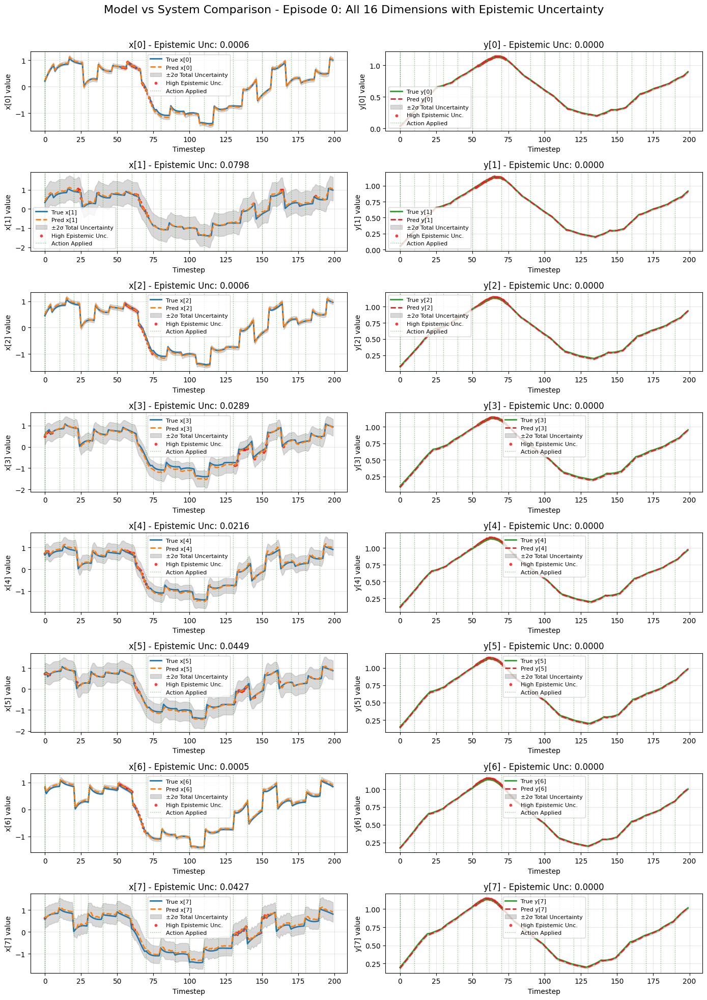


=== EPISODE 0 SUMMARY ===
Mean Epistemic Uncertainty per dimension:
  x[0]: 0.0006
  x[1]: 0.0798
  x[2]: 0.0006
  x[3]: 0.0289
  x[4]: 0.0216
  x[5]: 0.0449
  x[6]: 0.0005
  x[7]: 0.0427
  y[0]: 0.0000
  y[1]: 0.0000
  y[2]: 0.0000
  y[3]: 0.0000
  y[4]: 0.0000
  y[5]: 0.0000
  y[6]: 0.0000
  y[7]: 0.0000

Episode MSE: 0.002940
Episode MAE: 0.031150
Mean Total Uncertainty: 0.016791
Actions applied: 20 times


In [38]:
test_results = comprehensive_model_vs_system_test(odeblock, test_env, num_episodes=5, episode_length=200)
plot_test_results(test_results, episode_idx=0, state_dims_to_plot=[0, 1, 8, 9])  # Plot first 2 x and y dimensions

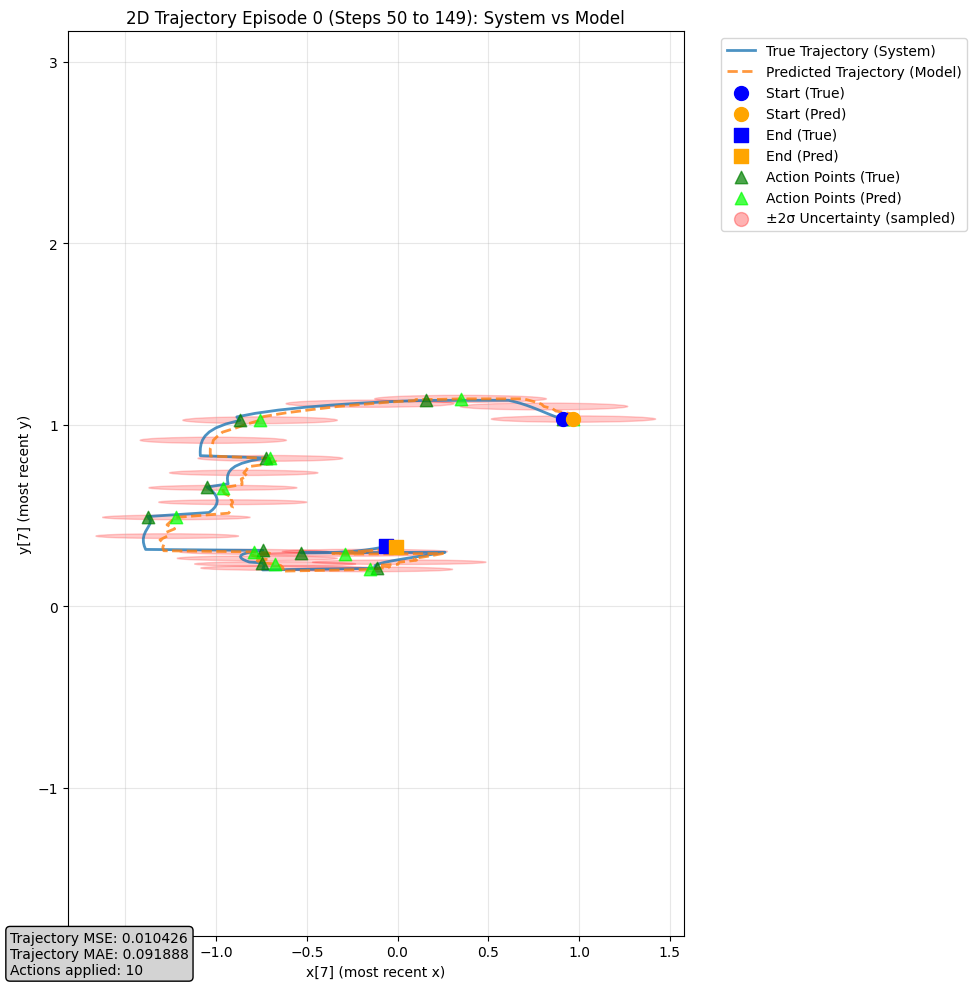


=== 2D TRAJECTORY ANALYSIS ===
Episode 0, Steps 50 to 149
Trajectory MSE: 0.010426
Trajectory MAE: 0.091888
Actions applied: 10 times
Action timesteps: [ 50  60  70  80  90 100 110 120 130 140]


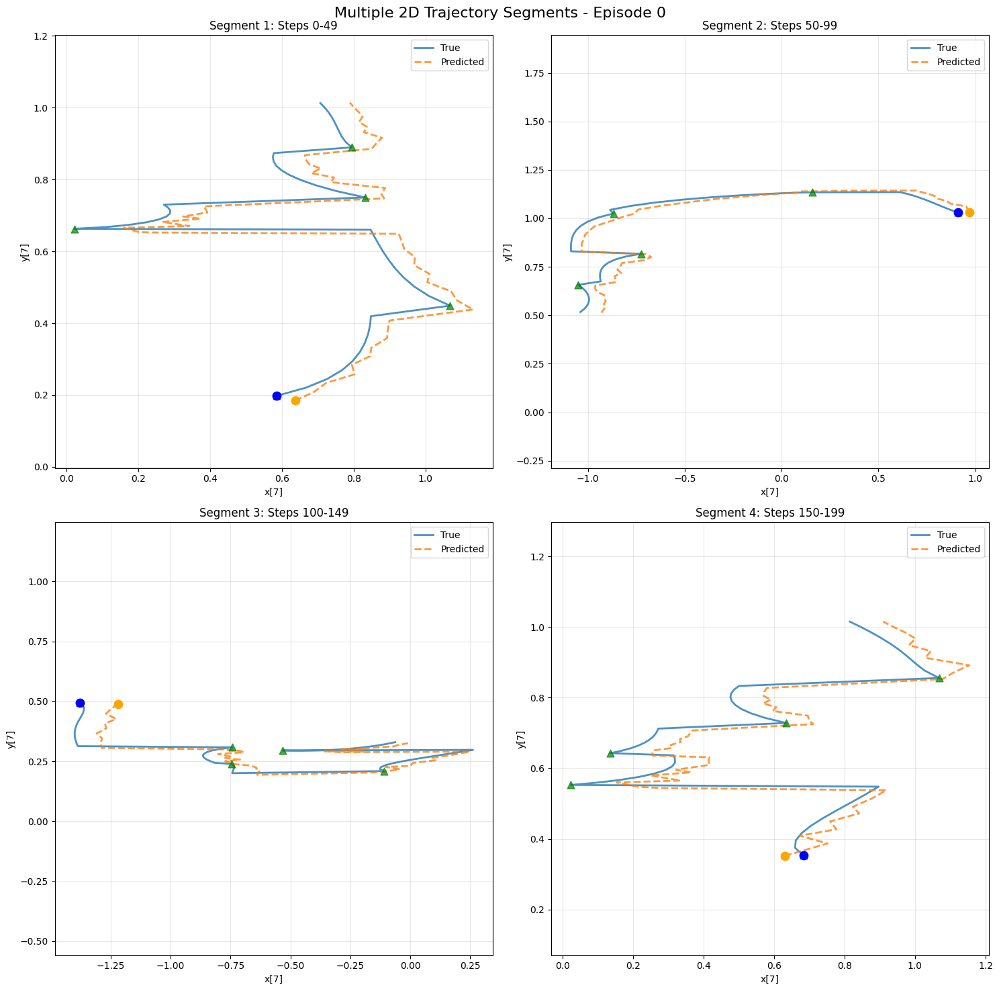

In [39]:
# Plot a single 2D trajectory segment
plot_2d_trajectory_test_results(test_results, episode_idx=0, start_step=50, end_step=150, 
                               x_dim=7, y_dim=15, with_uncertainty=True)

# Plot multiple trajectory segments
plot_multiple_2d_trajectories(test_results, episode_idx=0, num_segments=4, 
                             segment_length=50, x_dim=7, y_dim=15)

### Testing rollout of the System ID

In [44]:
def rollout_convergence_test(
    odeblock,
    env,
    horizon=200,
    mode="direct",                # "direct" uses evidential mean as next-state; "ode" integrates dy/dt
    action_policy="random",       # "random" | "zero" | "sine" | "step" | callable(step, state)->np.ndarray
    policy_params=None,           # dict for policy params: sine={"amp":1.0,"freq":0.05,"phase":0.0}, step={"amp":1.0,"t0":50}
    action_sequence=None,         # optional precomputed np.array of shape (horizon, action_dim)
    with_uncertainty=True,        # extract evidential uncertainties if available
    dims_to_plot=(0, 8),          # which state dims to visualize
    render_plots=True,
    seed=None,
):
    """
    Roll out the same action sequence on the actual system and the model to check convergence.

    Returns a dict with states, actions, errors, uncertainties (if available), and metrics.
    """
    import numpy as np
    import torch
    import math
    import matplotlib.pyplot as plt

    assert mode in ("direct", "ode"), "mode must be 'direct' or 'ode'"

    if seed is not None:
        np.random.seed(seed)
        try:
            env.seed(seed)
        except Exception:
            pass

    # Build time vector for single-step ODE integration if needed
    t_vec = torch.tensor([0., 1.], dtype=torch.float32)

    # Helpers
    def clip_action(a):
        if hasattr(env.action_space, "low") and hasattr(env.action_space, "high"):
            low, high = env.action_space.low, env.action_space.high
            return np.clip(a, low, high)
        return a

    def policy(step_idx, state_flat):
        if callable(action_policy):
            return np.asarray(action_policy(step_idx, state_flat), dtype=np.float32)
        pp = policy_params or {}
        if action_policy == "zero":
            return np.zeros_like(env.action_space.sample(), dtype=np.float32)
        if action_policy == "sine":
            amp = float(pp.get("amp", 1.0))
            freq = float(pp.get("freq", 0.05))  # cycles per step
            phase = float(pp.get("phase", 0.0))
            val = amp * math.sin(2 * math.pi * freq * step_idx + phase)
            return np.array([val], dtype=np.float32)
        if action_policy == "step":
            amp = float(pp.get("amp", 1.0))
            t0 = int(pp.get("t0", horizon // 4))
            val = amp if step_idx >= t0 else 0.0
            return np.array([val], dtype=np.float32)
        # default random
        return np.asarray(env.action_space.sample(), dtype=np.float32)

    # Reset environment and initialize
    s0_2d = env.reset()
    s0 = np.asarray(s0_2d).flatten().astype(np.float32)

    # Action sequence
    if action_sequence is not None:
        action_sequence = np.asarray(action_sequence, dtype=np.float32)
        assert action_sequence.shape[0] >= horizon, "action_sequence shorter than horizon"
    else:
        action_sequence = np.zeros((horizon, env.action_space.shape[0]), dtype=np.float32)
        st = s0.copy()
        for t in range(horizon):
            action_sequence[t] = clip_action(policy(t, st))

    # Buffers
    state_dim = s0.shape[0]
    sys_states = np.zeros((horizon, state_dim), dtype=np.float32)
    mdl_states = np.zeros((horizon, state_dim), dtype=np.float32)
    actions = np.zeros_like(action_sequence)
    errors = np.zeros_like(sys_states)

    ep_unc = np.zeros_like(sys_states) if with_uncertainty else None
    al_unc = np.zeros_like(sys_states) if with_uncertainty else None
    tot_unc = np.zeros_like(sys_states) if with_uncertainty else None

    # Current states
    sys_s = s0.copy()
    mdl_s = s0.copy()

    # Rollout
    for t in range(horizon):
        a = clip_action(action_sequence[t])

        # Step environment
        next_sys_s_2d, _, done, _ = env.step(a)
        next_sys_s = np.asarray(next_sys_s_2d).flatten().astype(np.float32)

        # Model prediction
        with torch.no_grad():
            ts = torch.tensor(mdl_s, dtype=torch.float32).unsqueeze(0)
            ta = torch.tensor(a, dtype=torch.float32).unsqueeze(0)

            # Always get evidential outputs for uncertainties
            evidential_output = odeblock.get_evidential_output(ts, ta)

            # Extract uncertainties if requested
            if with_uncertainty:
                try:
                    pred_mean, ep_u, al_u, tot_u = extract_uncertainties(evidential_output)
                    ep_u_np = ep_u.squeeze(0).cpu().numpy().astype(np.float32)
                    al_u_np = al_u.squeeze(0).cpu().numpy().astype(np.float32)
                    tot_u_np = tot_u.squeeze(0).cpu().numpy().astype(np.float32)
                except Exception:
                    ep_u_np = al_u_np = tot_u_np = None
            else:
                ep_u_np = al_u_np = tot_u_np = None

            if mode == "ode":
                next_mdl_s = odeblock(ts, ta, t_vec).squeeze(0).cpu().numpy().astype(np.float32)
            else:
                # direct next-state from evidential mean
                pred_mean, _, _, _ = extract_uncertainties(evidential_output)
                next_mdl_s = pred_mean.squeeze(0).cpu().numpy().astype(np.float32)

        # Store
        sys_states[t] = next_sys_s
        mdl_states[t] = next_mdl_s
        actions[t] = a
        errors[t] = np.abs(next_sys_s - next_mdl_s)
        if with_uncertainty and ep_u_np is not None:
            ep_unc[t] = ep_u_np
            al_unc[t] = al_u_np
            tot_unc[t] = tot_u_np

        # Advance
        sys_s = next_sys_s
        mdl_s = next_mdl_s

        if done:
            # Truncate results if env terminates early
            sys_states = sys_states[: t + 1]
            mdl_states = mdl_states[: t + 1]
            actions = actions[: t + 1]
            errors = errors[: t + 1]
            if with_uncertainty and ep_unc is not None:
                ep_unc = ep_unc[: t + 1]
                al_unc = al_unc[: t + 1]
                tot_unc = tot_unc[: t + 1]
            break

    # Metrics
    error_norm = np.sqrt(np.mean(errors**2, axis=1))  # RMSE per step across dims
    rmse_all = float(np.sqrt(np.mean(errors**2)))
    last_k = max(5, min(50, len(error_norm)))
    rmse_last_k = float(np.sqrt(np.mean(errors[-last_k:]**2)))
    # Convergence heuristics: absolute and relative thresholds
    eps_abs = 1e-2
    eps_rel = 0.25 * (error_norm[0] if len(error_norm) > 0 else 1.0)
    converged = (error_norm[-1] <= max(eps_abs, eps_rel)) if len(error_norm) > 0 else False

    results = {
        "system_states": sys_states,
        "model_states": mdl_states,
        "actions": actions,
        "errors": errors,
        "error_norm": error_norm,
        "uncertainties": (
            {"epistemic": ep_unc, "aleatoric": al_unc, "total": tot_unc}
            if with_uncertainty and ep_unc is not None
            else None
        ),
        "metrics": {
            "rmse_all": rmse_all,
            "rmse_last_k": rmse_last_k,
            "final_error_norm": float(error_norm[-1]) if len(error_norm) > 0 else None,
            "converged": bool(converged),
            "abs_threshold": eps_abs,
            "rel_threshold": eps_rel,
            "steps": int(len(error_norm)),
            "mode": mode,
            "policy": action_policy,
        },
    }

    # Plots
    if render_plots and len(error_norm) > 0:
        plt.figure(figsize=(12, 4))
        plt.plot(error_norm, label="Per-step RMSE")
        plt.axhline(eps_abs, color="gray", linestyle="--", alpha=0.5, label="Abs. threshold")
        plt.axhline(eps_rel, color="orange", linestyle="--", alpha=0.5, label="Rel. threshold")
        plt.title(f"Rollout Error Norm (mode={mode})")
        plt.xlabel("Timestep")
        plt.ylabel("RMSE across state dims")
        plt.legend()
        plt.grid(alpha=0.3)
        plt.show()

        # Selected dimensions
        dims = list(dims_to_plot) if dims_to_plot is not None else []
        if dims:
            import math as _m
            rows = len(dims)
            plt.figure(figsize=(12, 3 * rows))
            for i, d in enumerate(dims, 1):
                plt.subplot(rows, 1, i)
                plt.plot(sys_states[:, d], label=f"System s[{d}]", color="tab:blue")
                plt.plot(mdl_states[:, d], label=f"Model s[{d}]", color="tab:orange", linestyle="--")
                if with_uncertainty and results["uncertainties"] is not None:
                    tu = results["uncertainties"]["total"]
                    if tu is not None:
                        ub = mdl_states[:, d] + 2 * np.sqrt(np.maximum(tu[:, d], 0))
                        lb = mdl_states[:, d] - 2 * np.sqrt(np.maximum(tu[:, d], 0))
                        plt.fill_between(range(len(ub)), lb, ub, color="tab:gray", alpha=0.2, label="±2σ total")
                # Mark non-zero actions
                non_zero = np.where(np.abs(actions.squeeze()) > 1e-9)[0]
                for nz in non_zero:
                    plt.axvline(nz, color="green", linestyle=":", alpha=0.3)
                plt.legend(fontsize=8)
                plt.grid(alpha=0.3)
                plt.title(f"State dim {d}")
            plt.tight_layout()
            plt.show()

    print("Rollout complete.")
    print(f"- Steps: {results['metrics']['steps']}")
    print(f"- RMSE (all): {results['metrics']['rmse_all']:.6f}")
    print(f"- RMSE (last {last_k}): {results['metrics']['rmse_last_k']:.6f}")
    print(f"- Final error norm: {results['metrics']['final_error_norm']:.6f}")
    print(f"- Converged: {results['metrics']['converged']} (abs={eps_abs}, rel={eps_rel:.6f})")
    return results

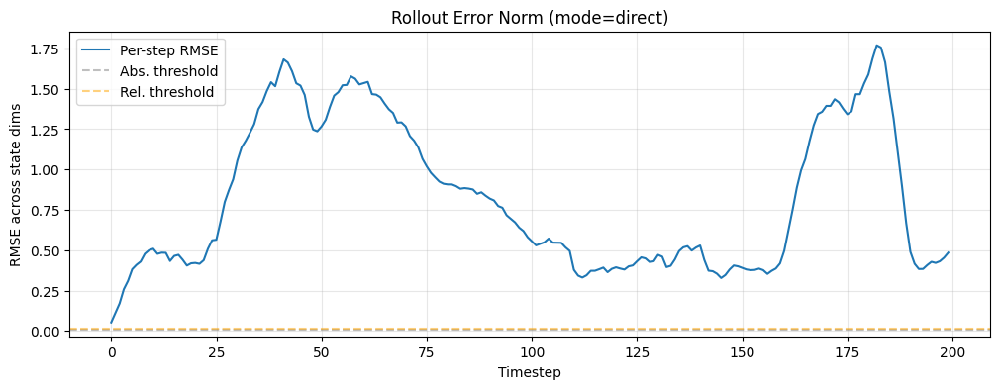

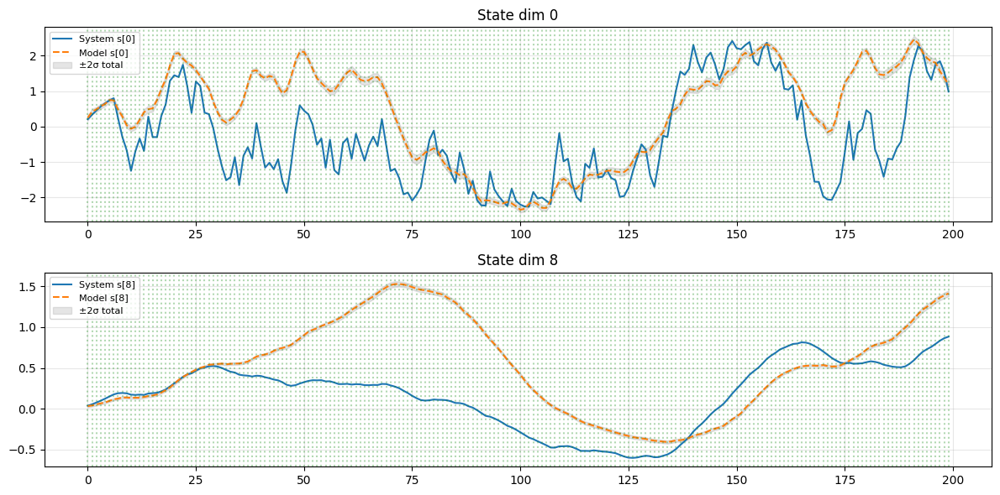

Rollout complete.
- Steps: 200
- RMSE (all): 0.943796
- RMSE (last 50): 1.048257
- Final error norm: 0.484872
- Converged: False (abs=0.01, rel=0.013204)
{'rmse_all': 0.9437956213951111, 'rmse_last_k': 1.048256754875183, 'final_error_norm': 0.4848719835281372, 'converged': False, 'abs_threshold': 0.01, 'rel_threshold': np.float32(0.013204472), 'steps': 200, 'mode': 'direct', 'policy': 'random'}


In [45]:
import gym_oscillator.envs.osc_env as osc_env

env = osc_env.oscillatorEnv(len_state=8)

results = rollout_convergence_test(
    odeblock,
    env,
    horizon=200,
    mode="direct",          # use "direct" with your current training
    action_policy="random", # try "zero", "sine", or "step" below
    with_uncertainty=True,  # set to False to speed up
    dims_to_plot=(0, 8),    # show x[0], y[0] by default
    render_plots=True,
    seed=0
)

print(results["metrics"])

## MPC Approach

In [39]:
# ========= Fast vectorized planner (CEM over epi/ale) =========
from dataclasses import dataclass

def rk4_step_batch(f, x, u, dt, n_sub=1):
    """Vectorized RK4: x [B, n], u [B, m], returns x' [B, n]."""
    h = dt / n_sub
    for _ in range(n_sub):
        k1 = f(x, u)
        k2 = f(x + 0.5*h*k1, u)
        k3 = f(x + 0.5*h*k2, u)
        k4 = f(x + h*k3,     u)
        x  = x + (h/6.0)*(k1 + 2*k2 + 2*k3 + k4)
    return x

def mpc_objective_uncertainty_batch(model, x0, U, dt, *,
                                    lam_ale=0.1, lam_u=1e-3, lam_du=0.1,
                                    barrier=1e3, state_low=None, state_high=None, n_sub=1):
    """
    Vectorized objective for a batch of candidate sequences.
    U: [P, H, m], x0: [1, n]. Returns scores [P].
    Objective = sum_k (sum(epi) - lam_ale*sum(ale) - lam_u||u||^2 - lam_du||Δu||^2 - barriers)
    """
    P, H, m = U.shape
    device = x0.device
    # replicate initial state for population
    X = x0.expand(P, -1)                           # [P, n]
    scores = torch.zeros(P, device=device)
    prev_u = None

    for k in range(H):
        u_k = U[:, k, :]                           # [P, m]

        # evidential params (no ODE integration here)
        v, alpha, beta = model.unc(X, u_k)         # each [P, n]
        alpha = torch.clamp(alpha, min=1.01)
        v     = torch.clamp(v,     min=1e-6)
        beta  = torch.clamp(beta,  min=1e-6)

        epi = beta / (v * (alpha - 1.0))           # [P, n]
        ale = beta / (alpha - 1.0)                 # [P, n]
        scores = scores + epi.sum(dim=-1) - lam_ale * ale.sum(dim=-1) - lam_u * (u_k*u_k).sum(dim=-1)

        if prev_u is not None:
            scores = scores - lam_du * ((u_k - prev_u)**2).sum(dim=-1)
        prev_u = u_k

        # safety (pre)
        if (state_low is not None) and (state_high is not None):
            oob = ((X < state_low) | (X > state_high)).any(dim=1)
            scores[oob] = scores[oob] - barrier

        # rollout mean dynamics (vectorized RK4)
        X = rk4_step_batch(lambda xx, uu: model.f_mean(xx, uu), X, u_k, dt, n_sub=n_sub)

        # safety (post)
        if (state_low is not None) and (state_high is not None):
            oob = ((X < state_low) | (X > state_high)).any(dim=1)
            scores[oob] = scores[oob] - barrier

    return scores  # [P]

@dataclass
class CEMState:
    z_mean: torch.Tensor  # [H, m]
    z_std:  torch.Tensor  # [H, m]

def plan_mpc_cem_fast(model, x0, *, H, action_dim, dt,
                      cem_state: 'CEMState|None' = None, u_init=None,
                      n_pop=64, n_elite=8, iters=2, sigma=0.5,
                      lam_ale=0.1, lam_u=1e-3, lam_du=0.1,
                      barrier=1e3, state_low=None, state_high=None, n_sub=1):
    """
    Fast CEM:
    - vectorized scoring over population
    - low n_pop / iters
    - warms from previous step's distribution (shifted)
    Returns (u0, U_best, new_cem_state)
    """
    device = x0.device
    m = action_dim

    # Build initial (z-space) Gaussian
    if cem_state is not None:
        # shift distribution forward by one step (MPC receding horizon)
        z_mean = torch.vstack([cem_state.z_mean[1:], cem_state.z_mean[-1:]]).clone()
        z_std  = torch.vstack([cem_state.z_std[1:],  cem_state.z_std[-1:]]).clone()
        z_std  = torch.clamp(z_std, min=0.15)  # avoid collapse
    else:
        if u_init is not None:
            u_init = torch.tensor(u_init, dtype=torch.float32, device=device)
            z_mean = atanh(torch.clamp(u_init, -0.999, 0.999))
        else:
            z_mean = torch.zeros(H, m, device=device)
        z_std = torch.full((H, m), sigma, device=device)

    # light blend with last plan if provided
    if u_init is not None:
        u_init = torch.tensor(u_init, dtype=torch.float32, device=device)
        z_init = atanh(torch.clamp(u_init, -0.999, 0.999))
        z_mean = 0.5 * z_mean + 0.5 * z_init

    best_U, best_score = None, -1e18

    for _ in range(iters):
        Z = torch.randn(n_pop, H, m, device=device) * z_std + z_mean       # [P,H,m]
        U = torch.tanh(Z)                                                  # project to [-1,1]
        scores = mpc_objective_uncertainty_batch(
            model, x0, U, dt,
            lam_ale=lam_ale, lam_u=lam_u, lam_du=lam_du,
            barrier=barrier, state_low=state_low, state_high=state_high, n_sub=n_sub
        )                                                                   # [P]
        topk = torch.topk(scores, k=min(n_elite, n_pop)).indices
        elite_Z = Z[topk]                                                   # [E,H,m]
        z_mean, z_std = elite_Z.mean(dim=0), elite_Z.std(dim=0) + 1e-4

        # track best
        elite_scores = scores[topk]
        i_star = torch.argmax(elite_scores)
        if elite_scores[i_star] > best_score:
            best_score = elite_scores[i_star].item()
            best_U = torch.tanh(elite_Z[i_star]).detach()                   # [H,m]

    u0 = best_U[0].detach().cpu().numpy()
    U_best = best_U.detach().cpu().numpy()
    new_state = CEMState(z_mean=z_mean.detach(), z_std=z_std.detach())
    return u0, U_best, new_state


In [ ]:
# ==========================================
# Active System ID with Neural ODE + CEM/EGL
# ==========================================
# - Plans actions that maximize expected learning (EGL)
# - Robust sequence optimizer: CEM (no backprop through actions)
# - Works with continuous states/actions
#
# Requirements: torch, torchdiffeq, numpy, gym_oscillator (your env)
# ==========================================

# ...existing imports...
import torch
import torch.nn as nn
import torch.optim as optim
from torchdiffeq import odeint
import numpy as np
import gym_oscillator.envs.osc_env as osc_env
from dataclasses import dataclass

# ========= Evidential utilities =========

def evidence(x):
    # Softplus-ish; stable positive
    return torch.log1p(torch.exp(x))

def NIG_NLL(y_true, gamma, v, alpha, beta):
    v     = torch.clamp(v,     min=1e-6)
    alpha = torch.clamp(alpha, min=1.01)
    beta  = torch.clamp(beta,  min=1e-6)
    two_beta_lambda = 2.0 * beta * (1.0 + v)
    nll = (
        0.5 * torch.log(torch.pi / v)
        - alpha * torch.log(two_beta_lambda)
        + (alpha + 0.5) * torch.log(v * (y_true - gamma) ** 2 + two_beta_lambda)
        + torch.lgamma(alpha)
        - torch.lgamma(alpha + 0.5)
    )
    return torch.mean(nll)

def NIG_Reg(y_true, gamma, v, alpha, beta, omega=0.01):
    error = torch.abs(y_true - gamma)
    reg = error * (2.0 * v + alpha)
    return torch.mean(reg)

@torch.no_grad()
def extract_uncertainties(model, x, u, dt=1.0):
    t = torch.tensor([0.0, dt], dtype=torch.float32, device=x.device)
    mu_hat, v, alpha, beta = model(x, u, t)
    alpha = torch.clamp(alpha, min=1.01)
    v     = torch.clamp(v,     min=1e-6)
    beta  = torch.clamp(beta,  min=1e-6)
    ale   = beta / (alpha - 1.0)
    epi   = beta / (v * (alpha - 1.0))
    return mu_hat, epi, ale, epi + ale

# ========= Model =========

class MLP(nn.Module):
    def __init__(self, in_dim, out_dim, hidden=[64, 64, 64], act=nn.Tanh):
        super().__init__()
        layers, d = [], in_dim
        for h in hidden:
            layers += [nn.Linear(d, h), act()]
            d = h
        layers.append(nn.Linear(d, out_dim))
        self.net = nn.Sequential(*layers)
    def forward(self, x): return self.net(x)

class ODEFunc(nn.Module):
    # dx/dt = f_theta(x, u)
    def __init__(self, state_dim, action_dim, hidden=64):
        super().__init__()
        self.f = MLP(state_dim + action_dim, state_dim, hidden=[hidden]*3, act=nn.Tanh)
    def forward(self, t, x, u):
        xu = torch.cat([x, u], dim=-1)
        return self.f(xu)

class ODEBlock(nn.Module):
    # Integrates mean: x_{t+dt}
    def __init__(self, func: ODEFunc):
        super().__init__()
        self.func = func
    def forward(self, x0, u, t):  # t = [t0, t1]
        dyn = lambda tt, x: self.func(tt, x, u)
        x_traj = odeint(dyn, x0, t)        # [2, B, state_dim]
        return x_traj[-1]

class UncertaintyHead(nn.Module):
    # Predict (v, alpha, beta) for next-state NIG from (x, u)
    def __init__(self, state_dim, action_dim, hidden=64):
        super().__init__()
        self.backbone = nn.Sequential(
            nn.Linear(state_dim + action_dim, hidden), nn.ReLU(),
            nn.Linear(hidden, hidden), nn.ReLU(),
            nn.Linear(hidden, 3 * state_dim)
        )
    def forward(self, x, u):
        out = self.backbone(torch.cat([x, u], dim=-1))
        logv, logalpha, logbeta = torch.chunk(out, 3, dim=-1)
        v     = evidence(logv)
        alpha = evidence(logalpha) + 1.0
        beta  = evidence(logbeta)
        return v, alpha, beta

class EviNeuralODE(nn.Module):
    # Mean next state via ODE + NIG evidential params
    def __init__(self, state_dim, action_dim, hidden=64):
        super().__init__()
        self.func = ODEFunc(state_dim, action_dim, hidden)
        self.ode  = ODEBlock(self.func)
        self.unc  = UncertaintyHead(state_dim, action_dim, hidden)
    def f_mean(self, x, u):
        # mean derivative for planning integrator
        return self.func(0.0, x, u)
    def forward(self, x, u, t):
        mu_hat = self.ode(x, u, t)
        v, alpha, beta = self.unc(x, u)
        return mu_hat, v, alpha, beta

def get_dims_from_model(model: EviNeuralODE):
    # Robustly infer (state_dim, action_dim) from first/last linear layers
    first_linear = next(m for m in model.func.f.net if isinstance(m, nn.Linear))
    last_linear  = list(m for m in model.func.f.net if isinstance(m, nn.Linear))[-1]
    in_features  = first_linear.in_features
    out_features = last_linear.out_features
    state_dim    = int(out_features)
    action_dim   = int(in_features - out_features)
    return state_dim, action_dim

# ========= Integrator & helpers =========

def atanh(x, eps=1e-6):
    x = torch.clamp(x, -1+eps, 1-eps)
    return 0.5 * (torch.log1p(x) - torch.log1p(-x))

def rk4_step(f, x, u, dt, n_sub=1):
    h = dt / n_sub
    for _ in range(n_sub):
        k1 = f(x, u)
        k2 = f(x + 0.5*h*k1, u)
        k3 = f(x + 0.5*h*k2, u)
        k4 = f(x + h*k3,     u)
        x  = x + (h/6.0)*(k1 + 2*k2 + 2*k3 + k4)
    return x

@torch.no_grad()
def squash_to_env(u):
    # Ensure in [-1, 1]
    return torch.clamp(u, -1.0, 1.0)

# ========= Information-Gain scoring (EGL) =========

def egl_score(model: EviNeuralODE, x, u, t, n_mc=2):
    """
    Expected Gradient Length: E_{y~p(y|x,u)} || ∂/∂θ [-log pθ(y|x,u)] ||^2
    We approximate with MC samples from the model's predictive Normal.
    To keep it tractable, we compute grads w.r.t. ODE func params only.
    """
    params = [p for p in model.func.parameters() if p.requires_grad]
    # Forward once to get distribution parameters
    mu, v, alpha, beta = model(x, u, t)
    alpha = torch.clamp(alpha, min=1.01)
    v     = torch.clamp(v,     min=1e-6)
    beta  = torch.clamp(beta,  min=1e-6)
    # Predictive variance ~ ale + epi
    sigma2 = beta / (alpha - 1.0) + beta / (v * (alpha - 1.0))  # [1, state_dim]

    # Monte Carlo over hypothetical labels
    scores = []
    for _ in range(n_mc):
        y_samp = mu + torch.randn_like(mu) * torch.sqrt(sigma2 + 1e-8)
        loss = NIG_NLL(y_samp, mu, v, alpha, beta)
        grads = torch.autograd.grad(loss, params, retain_graph=True, allow_unused=True)
        g2 = 0.0
        for g in grads:
            if g is not None:
                g2 = g2 + (g * g).sum()
        scores.append(g2)
    return torch.stack(scores).mean()

# ========= CEM Planner with EGL objective =========

def mpc_objective_egl(model, x0, U, dt, lam_ale=0.1, lam_u=1e-3, lam_du=0.1,
                      barrier=1e3, state_low=None, state_high=None, n_sub=1):
    """
    Sum over horizon: EGL(x_k,u_k) - λ_ale*ale - λ_u||u||^2 - λ_du||Δu||^2 - barriers
    Roll x forward using mean dynamics (RK4).
    """
    # Ensure gradients are enabled (we compute grads wrt params inside EGL)
    torch._C._log_api_usage_once("mpc_objective_egl")
    model.eval()
    x = x0
    score = torch.tensor(0.0, device=x0.device)
    prev_u = None
    t = torch.tensor([0.0, dt], dtype=torch.float32, device=x0.device)

    for k in range(U.shape[0]):
        u_k = U[k].unsqueeze(0)

        # 1) Information gain via EGL
        egl = egl_score(model, x, u_k, t, n_mc=2)
        score = score + egl

        # 2) Small penalties: aleatoric variance, effort, jerk
        with torch.no_grad():
            _, v, alpha, beta = model(x, u_k, t)
            alpha = torch.clamp(alpha, min=1.01)
            v     = torch.clamp(v,     min=1e-6)
            beta  = torch.clamp(beta,  min=1e-6)
            ale = (beta / (alpha - 1.0)).sum()
            score = score - lam_ale * ale - lam_u * (u_k * u_k).sum()
            if prev_u is not None:
                score = score - lam_du * ((u_k - prev_u) ** 2).sum()
            prev_u = u_k

        # 3) Safety barrier (pre step)
        if (state_low is not None) and (state_high is not None):
            out_of_bounds = ((x < state_low) | (x > state_high)).any()
            if bool(out_of_bounds):
                score = score - barrier

        # 4) Roll forward one step with mean dynamics (no grads through actions)
        x = rk4_step(lambda xx, uu: model.f_mean(xx, uu), x, u_k, dt, n_sub=n_sub)

        # 5) Safety barrier (post step)
        if (state_low is not None) and (state_high is not None):
            out_of_bounds = ((x < state_low) | (x > state_high)).any()
            if bool(out_of_bounds):
                score = score - barrier

    return score

def plan_mpc_cem(model, x0, *, H, action_dim, dt, n_pop=256, n_elite=32, iters=6,
                 u_init=None, sigma=0.6, lam_ale=0.1, lam_u=1e-3, lam_du=0.1,
                 barrier=1e3, state_low=None, state_high=None, n_sub=1):
    """
    Cross-Entropy Method (CEM) action-sequence planner.
    Returns (u0, U_best) both in [-1, 1].
    """
    device = x0.device
    mean = torch.zeros(H, action_dim, device=device) if u_init is None \
           else atanh(torch.clamp(torch.tensor(u_init, device=device), -0.999, 0.999))
    std  = torch.full((H, action_dim), sigma, device=device)

    best_u, best_score = None, -1e18

    for _ in range(iters):
        # Sample candidates in z-space then tanh to [-1,1]
        Z = torch.randn(n_pop, H, action_dim, device=device) * std + mean
        U = torch.tanh(Z)

        # Score all samples
        scores = []
        for i in range(n_pop):
            s = mpc_objective_egl(
                model, x0, U[i], dt,
                lam_ale=lam_ale, lam_u=lam_u, lam_du=lam_du,
                barrier=barrier, state_low=state_low, state_high=state_high, n_sub=n_sub
            )
            scores.append(s)
        scores = torch.stack(scores)

        # Elite selection
        topk = torch.topk(scores, k=n_elite).indices
        elite = Z[topk]  # NOTE: refit in z-space for better exploration
        mean, std = elite.mean(dim=0), elite.std(dim=0) + 1e-4

        # Track best (by score on U)
        elite_U = torch.tanh(elite)
        elite_scores = scores[topk]
        i_star = torch.argmax(elite_scores)
        if elite_scores[i_star] > best_score:
            best_score = elite_scores[i_star].item()
            best_u = elite_U[i_star].detach()

    # First control and the full sequence
    u0 = best_u[0].detach().cpu().numpy()
    U_best = best_u.detach().cpu().numpy()
    return u0, U_best

# ========= Env adapters =========

def reset_obs(env):
    out = env.reset()
    return out[0] if isinstance(out, tuple) else out

def step_env(env, a):
    out = env.step(a)
    if len(out) == 4:   # Gym
        obs_next, reward, done, info = out
    else:               # Gymnasium
        obs_next, reward, terminated, truncated, info = out
        done = bool(terminated or truncated)
    return obs_next, reward, done, info

# ========= Replay & training =========

# Simple replay buffers
states, actions, next_states = [], [], []

def add_transition(x, u, x_next, state_dim, action_dim):
    x      = np.asarray(x,      dtype=np.float32).reshape(state_dim)
    u      = np.asarray(u,      dtype=np.float32).reshape(action_dim)
    x_next = np.asarray(x_next, dtype=np.float32).reshape(state_dim)
    states.append(x); actions.append(u); next_states.append(x_next)

def to_torch(device):
    X = torch.tensor(np.stack(states),      dtype=torch.float32, device=device)
    U = torch.tensor(np.stack(actions),     dtype=torch.float32, device=device)
    Y = torch.tensor(np.stack(next_states), dtype=torch.float32, device=device)
    return X, U, Y

def train_steps(model, opt, X, U, Y, steps=50, batch=128, reg_coeff=0.01, dt=1.0):
    model.train()
    t = torch.tensor([0.0, dt], dtype=torch.float32, device=X.device)
    print("Training Neural ODE starts ...")
    for step in range(steps):
        bsz = min(batch, X.shape[0])
        idx = torch.randint(0, X.shape[0], (bsz,), device=X.device)
        xb, ub, yb = X[idx], U[idx], Y[idx]
        mu_hat, v, alpha, beta = model(xb, ub, t)
        loss_nll = NIG_NLL(yb, mu_hat, v, alpha, beta)
        loss_reg = NIG_Reg(yb, mu_hat, v, alpha, beta)
        loss = loss_nll + reg_coeff * loss_reg
        opt.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        opt.step()

        if step % 20 == 0:
            print(f"Step {step}: Loss = {loss.item():.6f}")



# ========= Main: seed, fit, active loop =========

def main():
    # Create env and derive dims from its spaces
    env = osc_env.oscillatorEnv(len_state=8)  # obs shape: (2, 8)
    obs_shape = env.observation_space.shape   # (2, len_state)
    state_dim = int(np.prod(obs_shape))       # flatten to 16
    action_dim = int(env.action_space.shape[0])  # 1

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = EviNeuralODE(state_dim, action_dim, hidden=64).to(device)
    optimizer = optim.Adam(model.parameters(), lr=1e-3)

    # Seed data
    seed_steps = 200
    obs = reset_obs(env)
    for _ in range(seed_steps):
        a = env.action_space.sample()  # in [-1,1]
        a = np.clip(np.asarray(a, dtype=np.float32).reshape(action_dim), -1.0, 1.0)
        obs_next, reward, done, info = step_env(env, a)
        add_transition(obs, a, obs_next, state_dim, action_dim)
        obs = obs_next

    # Initial fit
    X, U, Y = to_torch(device)
    dt_env = 1.0  # oscillator_env has no dt; one env step per integration step
    train_steps(model, optimizer, X, U, Y, steps=100, batch=256, reg_coeff=0.01, dt=dt_env)
    print("Initial Training of Neural ODE is completed!")

    # Active learning loop
    episodes, steps_per_ep = 40, 100
    H = 12
    dt_plan = dt_env
    u_prev_seq = None  # warm start (mean in z-space)
    cem_state = None

    # Optional safety bounds on flattened state (None = off)
    state_low  = None  # torch.full((1, state_dim), -np.inf, device=device)
    state_high = None  # torch.full((1, state_dim),  np.inf, device=device)

    # Reuse a single obs if main() re-run in a REPL
    if 'obs' not in locals():
        obs = reset_obs(env)

    for ep in range(episodes):
        for tstep in range(steps_per_ep):
            x0 = torch.tensor(np.asarray(obs, dtype=np.float32).reshape(state_dim),
                              dtype=torch.float32, device=device).unsqueeze(0)

            # print("Planning MPC...")

            # u0, U_star = plan_mpc_cem(
            #     model, x0,
            #     H=H, action_dim=action_dim, dt=dt_plan,
            #     n_pop=256, n_elite=32, iters=6,
            #     u_init=u_prev_seq,
            #     sigma=0.6,
            #     lam_ale=0.1, lam_u=1e-3, lam_du=0.1,
            #     barrier=1e3, state_low=state_low, state_high=state_high, n_sub=1
            # )

            u0, U_star, cem_state = plan_mpc_cem_fast(
                model, x0,
                H=H, action_dim=action_dim, dt=dt_plan,
                cem_state=cem_state,            # <— warm-start distribution across steps
                u_init=u_prev_seq,              # <— warm-start with last plan itself (optional)
                n_pop=64, n_elite=8, iters=2,   # <— small numbers; bump slightly if needed
                sigma=0.5,
                lam_ale=0.1, lam_u=1e-3, lam_du=0.1,
                barrier=1e3, state_low=state_low, state_high=state_high, n_sub=1
            )

            a = np.clip(u0.reshape(action_dim).astype(np.float32), -1.0, 1.0)
            obs_next, reward, done, info = step_env(env, a)
            add_transition(obs, a, obs_next, state_dim, action_dim)

            # Warm-start next planning step with the last plan
            u_prev_seq = U_star   # [H, m]

            obs = obs_next
            if done:
                obs = reset_obs(env)

        # Short retrain after each collection burst
        X, U, Y = to_torch(device)
        train_steps(model, optimizer, X, U, Y, steps=20, batch=256, reg_coeff=0.01, dt=dt_plan)
        print(f"Episode {ep+1} collected so far: {len(states)} samples")

if __name__ == "__main__":
    main()


Training Neural ODE starts ...
Step 0: Loss = 1.102334
Step 20: Loss = 0.754568
Step 40: Loss = -0.061236
Step 60: Loss = -0.894066
Step 80: Loss = -1.081700
Initial Training of Neural ODE is completed!
Training Neural ODE starts ...
Step 0: Loss = -0.863894
Episode 1 collected so far: 300 samples
Training Neural ODE starts ...
Step 0: Loss = -1.154721
Episode 2 collected so far: 400 samples
Training Neural ODE starts ...
Step 0: Loss = -1.399788
Episode 3 collected so far: 500 samples
Training Neural ODE starts ...
Step 0: Loss = 5.460100
Episode 4 collected so far: 600 samples
Training Neural ODE starts ...
Step 0: Loss = 11.705529
Episode 5 collected so far: 700 samples
Training Neural ODE starts ...
Step 0: Loss = -0.968810
Episode 6 collected so far: 800 samples
Training Neural ODE starts ...
Step 0: Loss = -1.029097
Episode 7 collected so far: 900 samples
Training Neural ODE starts ...
Step 0: Loss = -1.976441
Episode 8 collected so far: 1000 samples
Training Neural ODE starts ..

Evaluating MPC-trained Evidential Neural ODE...
=== MPC-TRAINED EVIDENTIAL NEURAL ODE EVALUATION ON UNSEEN DATA ===
Test MSE:  0.047565
Test MAE:  0.124031
Test RMSE: 0.218093

Uncertainty Statistics:
Mean Epistemic Uncertainty: 0.022890
Mean Aleatoric Uncertainty: 0.054363
Mean Total Uncertainty:     0.077254
Epistemic/Total Ratio:       0.296

Uncertainty-Error Correlations:
Epistemic-Error Correlation: 0.4155
Total-Error Correlation:     0.5128

Training Efficiency:
Total training samples collected: 4200
Samples per episode: 105.0


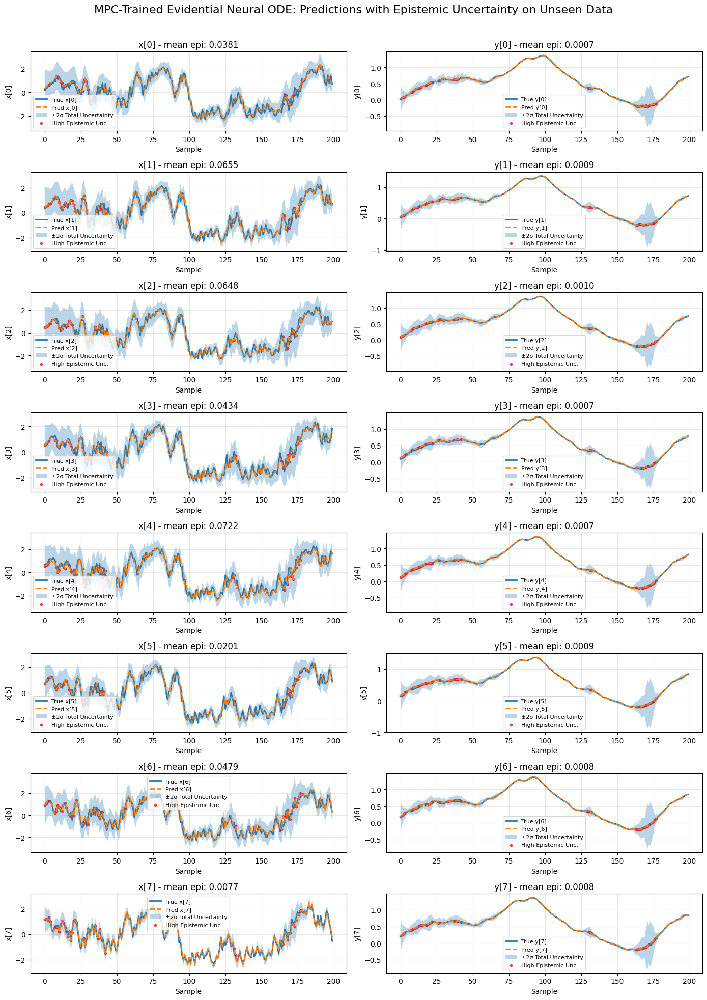


=== TRAINING VS TEST DATA ANALYSIS ===
State space coverage comparison:
  Dim 0: Train range [-2.297, 2.372], Test range [-2.523, 2.504], Coverage: 0.929
  Dim 1: Train range [-2.297, 2.372], Test range [-2.523, 2.504], Coverage: 0.929
  Dim 2: Train range [-2.297, 2.372], Test range [-2.523, 2.504], Coverage: 0.929
  Dim 3: Train range [-2.297, 2.372], Test range [-2.523, 2.504], Coverage: 0.929
Action exploration: Train std=0.287, Test std=0.577

Epistemic uncertainty comparison:
  Training data mean epistemic: 0.008290
  Test data mean epistemic:     0.022890
  Ratio (test/train):           2.761
  ✓ Model shows higher uncertainty on unseen data (good generalization)


In [43]:
# ==========================================
# Evaluation of MPC-Trained Evidential Neural ODE
# ==========================================

# First, let's collect unseen random test data (same as your original evaluation)
test_env = osc_env.oscillatorEnv(len_state=8)
num_test_samples = 20000
test_states, test_actions, test_next_states = [], [], []

# Gym API compatibility (old/new)
reset_out = test_env.reset()
obs = reset_out[0] if isinstance(reset_out, tuple) else reset_out

for _ in range(num_test_samples):
    action = test_env.action_space.sample()
    test_states.append(obs)
    test_actions.append(action)

    step_out = test_env.step(action)
    if len(step_out) == 5:
        next_obs, reward, terminated, truncated, info = step_out
        done = terminated or truncated
    else:
        next_obs, reward, done, info = step_out

    test_next_states.append(next_obs)
    obs = next_obs
    if done:
        reset_out = test_env.reset()
        obs = reset_out[0] if isinstance(reset_out, tuple) else reset_out

# Prepare test data (same shape handling as your original)
state_dim = 16  # (2, 8) flattened
action_dim = 1
test_states       = np.asarray(test_states, dtype=np.float32).reshape(num_test_samples, -1)       # (N, 16)
test_actions      = np.asarray(test_actions, dtype=np.float32).reshape(num_test_samples, -1)      # (N, 1)
test_next_states  = np.asarray(test_next_states, dtype=np.float32).reshape(num_test_samples, -1)  # (N, 16)

# Convert to torch tensors on the same device as the model
torch_test_states       = torch.from_numpy(test_states).to(device)
torch_test_actions      = torch.from_numpy(test_actions).to(device)
torch_test_next_states  = torch.from_numpy(test_next_states).to(device)

# Create the dt tensor for evaluation
dt = 1.0  # same as training
t = torch.tensor([0.0, dt], dtype=torch.float32, device=device)


# Evaluate the MPC-trained model
print("Evaluating MPC-trained Evidential Neural ODE...")
model.eval()
with torch.no_grad():
    # Predictive mean and uncertainties around the integrated next state
    pred_mean, epistemic_unc, aleatoric_unc, total_unc = extract_uncertainties(
        model, torch_test_states, torch_test_actions, dt=dt
    )

    # (Optional) raw ODE rollout for comparison
    pred_test_next_states_ode = model.ode(torch_test_states, torch_test_actions, t)

    # Move to CPU NumPy for analysis
    pred_test_next_states = pred_mean.detach().cpu().numpy()
    epistemic_unc_np      = epistemic_unc.detach().cpu().numpy()
    aleatoric_unc_np      = aleatoric_unc.detach().cpu().numpy()
    total_unc_np          = total_unc.detach().cpu().numpy()
    test_true_np          = torch_test_next_states.detach().cpu().numpy()
    pred_test_next_states_ode_np = pred_test_next_states_ode.detach().cpu().numpy()

# Compute evaluation metrics
mse  = np.mean((pred_test_next_states - test_next_states) ** 2)
mae  = np.mean(np.abs(pred_test_next_states - test_next_states))
rmse = np.sqrt(mse)

mean_epistemic = np.mean(epistemic_unc_np)
mean_aleatoric = np.mean(aleatoric_unc_np)
mean_total     = np.mean(total_unc_np)

pred_errors = np.abs(pred_test_next_states - test_next_states)

# Uncertainty-error correlations
epistemic_error_corr = np.corrcoef(epistemic_unc_np.flatten(), pred_errors.flatten())[0, 1]
total_error_corr     = np.corrcoef(total_unc_np.flatten(),     pred_errors.flatten())[0, 1]

print("=== MPC-TRAINED EVIDENTIAL NEURAL ODE EVALUATION ON UNSEEN DATA ===")
print(f"Test MSE:  {mse:.6f}")
print(f"Test MAE:  {mae:.6f}")
print(f"Test RMSE: {rmse:.6f}")
print("\nUncertainty Statistics:")
print(f"Mean Epistemic Uncertainty: {mean_epistemic:.6f}")
print(f"Mean Aleatoric Uncertainty: {mean_aleatoric:.6f}")
print(f"Mean Total Uncertainty:     {mean_total:.6f}")
print(f"Epistemic/Total Ratio:       {mean_epistemic/mean_total:.3f}")
print("\nUncertainty-Error Correlations:")
print(f"Epistemic-Error Correlation: {epistemic_error_corr:.4f}")
print(f"Total-Error Correlation:     {total_error_corr:.4f}")

# Training data efficiency metrics
print(f"\nTraining Efficiency:")
print(f"Total training samples collected: {len(states)}")
print(f"Samples per episode: {len(states)/40:.1f}")

# Visualization (same format as your original)
import matplotlib.pyplot as plt
plt.figure(figsize=(14, 20))
samples = slice(0, 200)

for i in range(8):
    # x[i] components
    plt.subplot(8, 2, 2*i+1)
    plt.plot(test_next_states[samples, i],             label=f'True x[{i}]', linewidth=2)
    plt.plot(pred_test_next_states[samples, i],        label=f'Pred x[{i}]', linestyle='--', linewidth=2)
    ub = pred_test_next_states[samples, i] + 2*np.sqrt(total_unc_np[samples, i])
    lb = pred_test_next_states[samples, i] - 2*np.sqrt(total_unc_np[samples, i])
    plt.fill_between(range(200), lb, ub, alpha=0.3, label='±2σ Total Uncertainty')

    # Highlight high epistemic uncertainty regions
    high_epi_mask = epistemic_unc_np[samples, i] > np.percentile(epistemic_unc_np[:, i], 90)
    if np.any(high_epi_mask):
        idxs = np.where(high_epi_mask)[0]
        plt.scatter(idxs, pred_test_next_states[samples, i][high_epi_mask], 
                   s=10, alpha=0.7, label='High Epistemic Unc.', color='red')

    plt.title(f'x[{i}] - mean epi: {np.mean(epistemic_unc_np[:, i]):.4f}')
    plt.xlabel('Sample'); plt.ylabel(f'x[{i}]'); plt.legend(fontsize=8); plt.grid(True, alpha=0.3)

    # y[i] components  
    plt.subplot(8, 2, 2*i+2)
    plt.plot(test_next_states[samples, 8+i],          label=f'True y[{i}]', linewidth=2)
    plt.plot(pred_test_next_states[samples, 8+i],     label=f'Pred y[{i}]', linestyle='--', linewidth=2)
    ub = pred_test_next_states[samples, 8+i] + 2*np.sqrt(total_unc_np[samples, 8+i])
    lb = pred_test_next_states[samples, 8+i] - 2*np.sqrt(total_unc_np[samples, 8+i])
    plt.fill_between(range(200), lb, ub, alpha=0.3, label='±2σ Total Uncertainty')

    high_epi_mask = epistemic_unc_np[samples, 8+i] > np.percentile(epistemic_unc_np[:, 8+i], 90)
    if np.any(high_epi_mask):
        idxs = np.where(high_epi_mask)[0]
        plt.scatter(idxs, pred_test_next_states[samples, 8+i][high_epi_mask], 
                   s=10, alpha=0.7, label='High Epistemic Unc.', color='red')

    plt.title(f'y[{i}] - mean epi: {np.mean(epistemic_unc_np[:, 8+i]):.4f}')
    plt.xlabel('Sample'); plt.ylabel(f'y[{i}]'); plt.legend(fontsize=8); plt.grid(True, alpha=0.3)

plt.suptitle('MPC-Trained Evidential Neural ODE: Predictions with Epistemic Uncertainty on Unseen Data', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

# Additional analysis: Compare training data distribution vs test data
print("\n=== TRAINING VS TEST DATA ANALYSIS ===")
if len(states) > 0:
    train_states_np = np.stack(states)
    train_actions_np = np.stack(actions)
    
    # Compare state space coverage
    print("State space coverage comparison:")
    for i in range(min(4, state_dim)):  # Show first 4 dimensions
        train_min, train_max = train_states_np[:, i].min(), train_states_np[:, i].max()
        test_min, test_max = test_states[:, i].min(), test_states[:, i].max()
        coverage = min(1.0, (train_max - train_min) / (test_max - test_min + 1e-8))
        print(f"  Dim {i}: Train range [{train_min:.3f}, {train_max:.3f}], "
              f"Test range [{test_min:.3f}, {test_max:.3f}], Coverage: {coverage:.3f}")
    
    # Action distribution comparison
    train_action_std = train_actions_np.std()
    test_action_std = test_actions.std()
    print(f"Action exploration: Train std={train_action_std:.3f}, Test std={test_action_std:.3f}")

# Epistemic uncertainty analysis on training vs test
if len(states) > 0:
    # Get uncertainties on training data
    X_train, U_train, _ = to_torch(device)
    with torch.no_grad():
        _, train_epi, train_ale, _ = extract_uncertainties(model, X_train, U_train, dt=dt)
        train_epi_np = train_epi.detach().cpu().numpy()
        train_ale_np = train_ale.detach().cpu().numpy()
    
    print(f"\nEpistemic uncertainty comparison:")
    print(f"  Training data mean epistemic: {train_epi_np.mean():.6f}")
    print(f"  Test data mean epistemic:     {epistemic_unc_np.mean():.6f}")
    print(f"  Ratio (test/train):           {epistemic_unc_np.mean()/train_epi_np.mean():.3f}")
    
    if epistemic_unc_np.mean() > train_epi_np.mean():
        print("  ✓ Model shows higher uncertainty on unseen data (good generalization)")
    else:
        print("  ⚠ Model shows lower uncertainty on unseen data (potential overfitting)")

Training/eval with N=400 samples ...
Training Neural ODE starts ...
Step 0: Loss = 1.031737
Training Neural ODE starts ...
Step 0: Loss = 1.077847
Training/eval with N=1160 samples ...
Training Neural ODE starts ...
Step 0: Loss = 1.012388
Step 20: Loss = 0.172609
Step 40: Loss = -0.863827
Training Neural ODE starts ...
Step 0: Loss = 1.076880
Step 20: Loss = 0.616406
Step 40: Loss = -0.461457
Training/eval with N=1920 samples ...
Training Neural ODE starts ...
Step 0: Loss = 1.012063
Step 20: Loss = 0.007160
Step 40: Loss = -0.778075
Step 60: Loss = -1.576318
Training Neural ODE starts ...
Step 0: Loss = 1.072699
Step 20: Loss = 0.608590
Step 40: Loss = -0.453374
Step 60: Loss = -1.084153
Training/eval with N=2680 samples ...
Training Neural ODE starts ...
Step 0: Loss = 1.007397
Step 20: Loss = -0.045886
Step 40: Loss = -1.530921
Step 60: Loss = -0.347630
Step 80: Loss = -2.064019
Step 100: Loss = -2.321112
Training Neural ODE starts ...
Step 0: Loss = 1.076802
Step 20: Loss = 0.6054

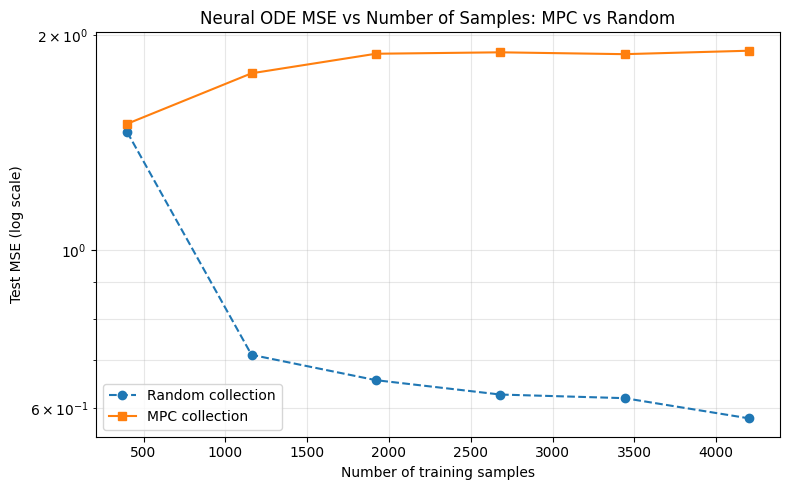

N=  400 | Random MSE=1.462588 | MPC MSE=1.502271
N= 1160 | Random MSE=0.712557 | MPC MSE=1.768297
N= 1920 | Random MSE=0.656580 | MPC MSE=1.883525
N= 2680 | Random MSE=0.626801 | MPC MSE=1.892239
N= 3440 | Random MSE=0.619516 | MPC MSE=1.880967
N= 4200 | Random MSE=0.580436 | MPC MSE=1.902043


In [46]:
# MSE vs #samples: MPC vs Random (MPC-collected data already in `states/actions/next_states`)
# Assumes the classes/functions from your cell exist:
# EviNeuralODE, NIG_NLL, NIG_Reg, train_steps, extract_uncertainties,
# reset_obs, step_env, osc_env, etc.

import math
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt

# 0) Preconditions and shared setup
assert 'states' in globals() and len(states) > 0, \
    "No MPC-collected data found. Run your active loop (main()) first to populate states/actions/next_states."

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
env_for_dims = osc_env.oscillatorEnv(len_state=8)
obs_shape = env_for_dims.observation_space.shape  # (2, len_state)
state_dim = int(np.prod(obs_shape))               # 16
action_dim = int(env_for_dims.action_space.shape[0])  # 1
dt_eval = 1.0
torch.manual_seed(1234); np.random.seed(1234)

# 1) Freeze MPC dataset from your global replay
mpc_states_np      = np.stack(states).astype(np.float32).reshape(-1, state_dim)
mpc_actions_np     = np.stack(actions).astype(np.float32).reshape(-1, action_dim)
mpc_next_states_np = np.stack(next_states).astype(np.float32).reshape(-1, state_dim)
N_max = len(mpc_states_np)

# 2) Build a random-collection dataset of equal size
rand_env = osc_env.oscillatorEnv(len_state=8)
ro = rand_env.reset()
obs = ro[0] if isinstance(ro, tuple) else ro

rand_states, rand_actions, rand_next_states = [], [], []
while len(rand_states) < N_max:
    a = rand_env.action_space.sample()
    rand_states.append(obs)
    rand_actions.append(a)
    step_out = rand_env.step(a)
    if len(step_out) == 5:
        obs_next, r, terminated, truncated, info = step_out
        done = terminated or truncated
    else:
        obs_next, r, done, info = step_out
    rand_next_states.append(obs_next)
    obs = rand_env.reset()[0] if done and isinstance(rand_env.reset(), tuple) else (rand_env.reset() if done else obs_next)
rand_states_np      = np.asarray(rand_states, dtype=np.float32).reshape(-1, state_dim)
rand_actions_np     = np.asarray(rand_actions, dtype=np.float32).reshape(-1, action_dim)
rand_next_states_np = np.asarray(rand_next_states, dtype=np.float32).reshape(-1, state_dim)

# 3) Common test set (reuse if already built)
if 'torch_test_states' not in globals():
    test_env = osc_env.oscillatorEnv(len_state=8)
    num_test_samples = 10000  # reduce if needed for speed
    ts, ta, ty = [], [], []
    r = test_env.reset()
    tobs = r[0] if isinstance(r, tuple) else r
    for _ in range(num_test_samples):
        act = test_env.action_space.sample()
        ts.append(tobs); ta.append(act)
        step_out = test_env.step(act)
        if len(step_out) == 5:
            nobs, _, terminated, truncated, _ = step_out
            done = terminated or truncated
        else:
            nobs, _, done, _ = step_out
        ty.append(nobs)
        tobs = test_env.reset()[0] if done and isinstance(test_env.reset(), tuple) else (test_env.reset() if done else nobs)
    test_states       = np.asarray(ts, dtype=np.float32).reshape(-1, state_dim)
    test_actions      = np.asarray(ta, dtype=np.float32).reshape(-1, action_dim)
    test_next_states  = np.asarray(ty, dtype=np.float32).reshape(-1, state_dim)
    torch_test_states      = torch.from_numpy(test_states).to(device)
    torch_test_actions     = torch.from_numpy(test_actions).to(device)
    torch_test_next_states = torch.from_numpy(test_next_states).to(device)

t_eval = torch.tensor([0.0, dt_eval], dtype=torch.float32, device=device)

def tensors_from_np(Xnp, Unp, Ynp, N, device):
    X = torch.from_numpy(Xnp[:N].copy()).to(device)
    U = torch.from_numpy(Unp[:N].copy()).to(device)
    Y = torch.from_numpy(Ynp[:N].copy()).to(device)
    return X, U, Y

@torch.no_grad()
def eval_mse(model, Xtest, Utest, Ytest, dt=1.0, batch=2048):
    model.eval()
    n = Xtest.shape[0]
    sse = 0.0
    for i in range(0, n, batch):
        xb = Xtest[i:i+batch]
        ub = Utest[i:i+batch]
        yb = Ytest[i:i+batch]
        mu_hat, _, _, _ = extract_uncertainties(model, xb, ub, dt=dt)
        sse += torch.mean((mu_hat - yb) ** 2, dim=0).sum().item() * (xb.shape[0])  # sum over states; weight by batch size
    mse = sse / n
    return mse

def train_and_eval_on_N(N, data_kind, epochs=10, batch_size=256, lr=1e-3, reg_coeff=0.01):
    # Fresh model per run; same seed to reduce variance
    torch.manual_seed(1234); np.random.seed(1234)
    model = EviNeuralODE(state_dim, action_dim, hidden=64).to(device)
    opt = optim.Adam(model.parameters(), lr=lr)

    if data_kind == 'mpc':
        X, U, Y = tensors_from_np(mpc_states_np, mpc_actions_np, mpc_next_states_np, N, device)
    else:
        X, U, Y = tensors_from_np(rand_states_np, rand_actions_np, rand_next_states_np, N, device)

    # Keep epochs constant across strategies and sizes
    steps = max(1, epochs * math.ceil(N / max(1, batch_size)))
    train_steps(model, opt, X, U, Y, steps=steps, batch=batch_size, reg_coeff=reg_coeff, dt=dt_eval)

    return eval_mse(model, torch_test_states, torch_test_actions, torch_test_next_states, dt=dt_eval)

# 4) Sweep sizes and compute MSEs
sample_sizes = np.unique(np.linspace(min(400, N_max), N_max, 6, dtype=int))
mpc_mses, rand_mses = [], []
for N in sample_sizes:
    print(f"Training/eval with N={N} samples ...")
    mpc_mse  = train_and_eval_on_N(N, data_kind='mpc',  epochs=10, batch_size=256, lr=1e-3, reg_coeff=0.01)
    rand_mse = train_and_eval_on_N(N, data_kind='rand', epochs=10, batch_size=256, lr=1e-3, reg_coeff=0.01)
    mpc_mses.append(mpc_mse); rand_mses.append(rand_mse)

# 5) Plot: Neural ODE MSE vs number of samples
plt.figure(figsize=(8,5))
plt.semilogy(sample_sizes, rand_mses, 'o--', label='Random collection')
plt.semilogy(sample_sizes, mpc_mses,  's-',  label='MPC collection')
plt.xlabel('Number of training samples')
plt.ylabel('Test MSE (log scale)')
plt.title('Neural ODE MSE vs Number of Samples: MPC vs Random')
plt.grid(True, which='both', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# Print table summary
for n, r, m in zip(sample_sizes, rand_mses, mpc_mses):
    print(f"N={n:5d} | Random MSE={r:.6f} | MPC MSE={m:.6f}")

## CEM-MPC Enhanced Version

In [66]:
from collections import deque
import random
from pathlib import Path
import os, time

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.distributions.normal import Normal
from torchdiffeq import odeint

# --- Your env ---
# pip install gym torchdiffeq
import gym_oscillator.envs.osc_env as osc_env


# =====================
# Neural ODE model (Plain, without evidential)
# =====================

class MLP(nn.Module):
    def __init__(self, in_dim, out_dim, hidden=[64, 64, 64], act=nn.Tanh):
        super().__init__()
        layers, d = [], in_dim
        for h in hidden:
            layers += [nn.Linear(d, h), act()]
            d = h
        layers.append(nn.Linear(d, out_dim))
        self.net = nn.Sequential(*layers)
    def forward(self, x): return self.net(x)

class ODEFunc(nn.Module):
    """dx/dt = f_theta(x, u)"""
    def __init__(self, state_dim, action_dim, hidden=64):
        super().__init__()
        self.f = MLP(state_dim + action_dim, state_dim, hidden=[hidden]*3, act=nn.Tanh)
    def forward(self, t, x, u):
        xu = torch.cat([x, u], dim=-1)
        return self.f(xu)

class ODEBlock(nn.Module):
    """x_{t+Δt} via fixed-step RK4 over [0, dt]"""
    def __init__(self, func: ODEFunc, step_size=0.5):
        super().__init__()
        self.func = func
        self.step_size = step_size
    def forward(self, x0, u, t):
        dyn = lambda tt, x: self.func(tt, x, u)
        x_traj = odeint(dyn, x0, t, method='rk4', options=dict(step_size=self.step_size))
        return x_traj[-1]

class NeuralODE(nn.Module):
    def __init__(self, state_dim, action_dim, hidden=64, ode_step=0.5):
        super().__init__()
        self.func = ODEFunc(state_dim, action_dim, hidden)
        self.ode  = ODEBlock(self.func, step_size=ode_step)
    def forward(self, x, u, t):
        mu_hat = self.ode(x, u, t)
        return mu_hat

@torch.no_grad()
def extract_uncertainties(ensemble, x, u, t):
    """Return mu_hat, epistemic (variance over ensemble means)."""
    for model in ensemble:
        model.eval()
    mus = torch.stack([model(x, u, t) for model in ensemble], dim=0)  # [M, B, S]
    mu_hat = mus.mean(dim=0)
    epistemic = mus.var(dim=0)  # [B, S]
    return mu_hat, epistemic


# =====================
# Running state stats (kept but not used in scoring)
# =====================

class RunningScale:
    """Track per-dimension std for states."""
    def __init__(self, dim, eps=1e-8, device="cpu"):
        self.dim = dim
        self.eps = eps
        self.n = 0
        self.mean = torch.zeros(dim, device=device)
        self.M2 = torch.zeros(dim, device=device)
    def update(self, x_batch: torch.Tensor):
        x = x_batch.detach()
        n_b = x.shape[0]
        if n_b == 0: return
        self.n += n_b
        delta = x.mean(0) - self.mean
        self.mean += delta * (n_b / max(self.n, 1))
        var_b = x.var(dim=0, unbiased=True)
        alpha = min(0.1, n_b / max(self.n, 1.0))
        self.M2 = (1 - alpha) * self.M2 + alpha * var_b * max(self.n - 1, 1)
    def std(self):
        var = self.M2 / max(self.n - 1, 1)
        return torch.sqrt(var + self.eps)


# =====================
# Replay buffer (unchanged)
# =====================

class ReplayBuffer:
    def __init__(self, capacity):
        self.buffer = deque(maxlen=capacity)
    def add(self, state, action, next_state):
        self.buffer.append((state, action, next_state))
    def sample(self, batch_size):
        return random.sample(self.buffer, batch_size)
    def get_all_data(self):
        states, actions, next_states = zip(*self.buffer)
        return np.array(states), np.array(actions), np.array(next_states)
    def __len__(self):
        return len(self.buffer)


def save_replay_npz(replay_buffer, path="mpc_dataset.npz", *, state_dim=None, action_dim=None):
    if len(replay_buffer) == 0:
        print("ReplayBuffer empty; skipping save.")
        return
    states, actions, next_states = replay_buffer.get_all_data()
    states = np.asarray(states,  dtype=np.float32)
    actions = np.asarray(actions, dtype=np.float32)
    next_states = np.asarray(next_states, dtype=np.float32)
    if state_dim is not None:
        states = states.reshape(-1, state_dim)
        next_states = next_states.reshape(-1, state_dim)
    if action_dim is not None:
        actions = actions.reshape(-1, action_dim)

    Path(os.path.dirname(path) or ".").mkdir(parents=True, exist_ok=True)
    np.savez_compressed(path, states=states, actions=actions, next_states=next_states)
    print(f"Saved MPC dataset: {path} | N={len(states)}")


# =====================
# CEM Uncertainty-seeking MPC with Optimism
# =====================

class MPC_CEM_Collector:
    def __init__(self, ensemble, action_space, dt, horizon, num_sequences, num_elites, num_iterations, device,
                 init_std_frac=0.40, min_std_frac=0.10, discount=0.98, lam_du=0.05, use_log_score=False,
                 optimism_beta=1.0):
        self.ensemble = ensemble
        self.device = device

        self.action_dim = int(np.prod(action_space.shape))
        self.action_low  = torch.tensor(action_space.low,  dtype=torch.float32, device=device)
        self.action_high = torch.tensor(action_space.high, dtype=torch.float32, device=device)
        self.action_range = (self.action_high - self.action_low).clamp(min=1e-6)

        self.horizon = horizon
        self.num_sequences = num_sequences
        self.num_elites = num_elites
        self.num_iterations = num_iterations

        self.mean = torch.zeros(horizon, self.action_dim, device=device)
        self.std  = (init_std_frac * self.action_range).repeat(horizon, 1)
        self.min_std = (min_std_frac * self.action_range)

        self.discount = discount
        self.lam_du = lam_du
        self.use_log_score = use_log_score
        self.optimism_beta = optimism_beta  # Beta for optimistic rollout

        self.t = torch.tensor([0.0, dt], dtype=torch.float32, device=device)

        self.state_scale = None

    def set_state_scale(self, state_scale: torch.Tensor):
        self.state_scale = state_scale

    def _sample_actions(self, mean, std):
        dist = Normal(mean, std.clamp(min=1e-6))
        U = dist.sample((self.num_sequences,))
        U = torch.clamp(U, self.action_low, self.action_high)
        return U

    @torch.no_grad()
    def get_action(self, current_state_np: np.ndarray):
        x0 = torch.from_numpy(current_state_np).float().to(self.device)

        self.mean = torch.cat([self.mean[1:], torch.zeros_like(self.mean[-1:])], dim=0)
        self.std  = torch.maximum(torch.cat([self.std[1:], self.std[-1:]], dim=0), self.min_std)

        mean = self.mean.clone()
        std  = self.std.clone()

        if self.state_scale is None:
            self.state_scale = torch.ones_like(x0)

        for _ in range(self.num_iterations):
            U = self._sample_actions(mean, std)

            scores = torch.zeros(self.num_sequences, device=self.device)
            X = x0.unsqueeze(0).repeat(self.num_sequences, 1)
            prev_a = None
            gamma = 1.0

            for h in range(self.horizon):
                a_h = U[:, h, :]
                mu, epistemic = extract_uncertainties(self.ensemble, X, a_h, self.t)
                # FIXED: Simple sum epistemic (no /state_scale or aleatoric)
                info = epistemic

                if self.use_log_score:
                    step_score = torch.log(info + 1e-8).sum(-1)
                else:
                    step_score = info.sum(-1)

                du = 0.0 if prev_a is None else (a_h - prev_a).pow(2).sum(-1)

                scores += gamma * (step_score - self.lam_du * du)
                gamma *= self.discount
                prev_a = a_h
                # FIXED: Optimistic rollout
                optimism_dir = torch.sign(torch.randn_like(epistemic))  # Random direction in [-1,1]
                X = mu + self.optimism_beta * torch.sqrt(epistemic) * optimism_dir

            vals, idx = torch.topk(scores, self.num_elites, largest=True)
            elites = U[idx]

            w = torch.softmax((vals - vals.max()), dim=0).view(-1, 1, 1)
            mean = (w * elites).sum(dim=0) / (w.sum(dim=0) + 1e-8)
            var  = (w * (elites - mean).pow(2)).sum(dim=0) / (w.sum(dim=0) + 1e-8)
            std  = torch.sqrt(var + 1e-6)

            std = torch.clamp(std, self.min_std, self.action_range)

        self.mean, self.std = mean.detach(), std.detach()
        return mean[0].cpu().numpy()


# =====================
# Training loop (adapted for ensemble)
# =====================

def train_model(ensemble, optimizers, replay_buffer, device, dt, train_steps, batch_size):
    for model in ensemble:
        model.train()
    if len(replay_buffer) < batch_size:
        print("Not enough data in buffer to train. Skipping.")
        return

    states, actions, next_states = replay_buffer.get_all_data()
    torch_states = torch.from_numpy(np.asarray(states, dtype=np.float32)).to(device)
    torch_actions = torch.from_numpy(np.asarray(actions, dtype=np.float32)).to(device)
    torch_next_states = torch.from_numpy(np.asarray(next_states, dtype=np.float32)).to(device)

    t = torch.tensor([0.0, dt], dtype=torch.float32, device=device)

    print(f"Training on {len(torch_states)} samples for {train_steps} steps...")
    losses = [[] for _ in ensemble]

    for step in range(train_steps):
        idx = torch.randint(0, len(torch_states), (min(batch_size, len(torch_states)),), device=device)
        xb = torch_states[idx]
        ub = torch_actions[idx]
        yb = torch_next_states[idx]

        for i, model in enumerate(ensemble):
            mu_hat = model(xb, ub, t)
            loss = nn.MSELoss()(mu_hat, yb)  # Simple MSE for plain ODEs

            optimizers[i].zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizers[i].step()
            losses[i].append(loss.item())

        if (step + 1) % 100 == 0:
            avg_loss = np.mean([np.mean(l[-100:]) for l in losses])
            print(f"  step {step+1}/{train_steps} | avg loss (ensemble)={avg_loss:.4f}")


# =====================
# Main active loop
# =====================

def main():
    # ---- Hyperparameters ----
    HIDDEN_DIM = 128
    ENSEMBLE_SIZE = 5  # FIXED: For better uncertainty

    # Training
    LEARNING_RATE = 1e-3
    BATCH_SIZE = 256
    REPLAY_BUFFER_CAPACITY = 100_000

    # Data collection
    SEED_STEPS = 500  # Increased for better initial calibration
    INITIAL_TRAIN_STEPS = 300
    EPISODES = 40
    STEPS_PER_EPISODE = 100
    RETRAIN_STEPS_BASE = 400  # Increased

    # CEM policy
    MPC_HORIZON = 35  # Increased
    MPC_ITERATIONS = 8  # Increased
    MPC_SEQUENCES = 512  # Increased
    MPC_ELITES = 50  # Increased
    CEM_DISCOUNT = 0.98
    CEM_LAM_DU = 0.05
    ACTION_NOISE_PROB = 0.2  # Increased
    OPTIMISM_BETA = 1.5  # For optimistic rollouts

    # ---- Setup ----
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    env = osc_env.oscillatorEnv(len_state=8)

    STATE_DIM = int(np.prod(env.observation_space.shape))
    ACTION_DIM = int(np.prod(env.action_space.shape))
    print(f"Env ready | state_dim={STATE_DIM} | action_dim={ACTION_DIM}")

    # FIXED: Ensemble of NeuralODEs
    ensemble = [NeuralODE(STATE_DIM, ACTION_DIM, hidden=HIDDEN_DIM, ode_step=0.5).to(device) for _ in range(ENSEMBLE_SIZE)]
    optimizers = [optim.Adam(model.parameters(), lr=LEARNING_RATE) for model in ensemble]
    replay_buffer = ReplayBuffer(REPLAY_BUFFER_CAPACITY)

    dt_env = 1.0

    scale_tracker = RunningScale(dim=STATE_DIM, device=device)

    # ---- 1) Seeding with random actions ----
    print(f"--- Seeding {SEED_STEPS} random steps ---")
    obs = env.reset()
    if isinstance(obs, tuple): obs = obs[0]

    step_count = 0
    for _ in range(SEED_STEPS):
        a = env.action_space.sample()
        step = env.step(a)
        if len(step) == 5:
            next_obs, _, terminated, truncated, _ = step
            done = bool(terminated or truncated)
        else:
            next_obs, _, done, _ = step

        replay_buffer.add(np.asarray(obs).flatten(), np.asarray(a), np.asarray(next_obs).flatten())
        obs = next_obs if not done else env.reset()[0] if isinstance(env.reset(), tuple) else env.reset()

    print(f"Seed buffer size: {len(replay_buffer)}")

    # ---- 2) Initial training ----
    print("\n--- Initial training ---")
    train_model(ensemble, optimizers, replay_buffer, device, dt_env,
                train_steps=INITIAL_TRAIN_STEPS, batch_size=BATCH_SIZE)
    print("Initial training done.")

    # ---- 3) Active learning with CEM ----
    print(f"\n--- Active learning for {EPISODES} episodes ---")

    mpc_policy = MPC_CEM_Collector(
        ensemble, env.action_space, dt_env, MPC_HORIZON,
        MPC_SEQUENCES, MPC_ELITES, MPC_ITERATIONS, device,
        init_std_frac=0.40, min_std_frac=0.10,
        discount=CEM_DISCOUNT, lam_du=CEM_LAM_DU, use_log_score=False,  # Try True if needed
        optimism_beta=OPTIMISM_BETA
    )

    def update_state_scale_from_buffer():
        if len(replay_buffer) == 0:
            mpc_policy.set_state_scale(torch.ones(STATE_DIM, device=device))
            return
        s_np, _, _ = replay_buffer.get_all_data()
        s_t = torch.from_numpy(np.asarray(s_np, dtype=np.float32)).to(device)
        if s_t.shape[0] > 5000:
            idx = torch.randint(0, s_t.shape[0], (5000,), device=device)
            s_t = s_t[idx]
        scale_tracker.update(s_t)
        mpc_policy.set_state_scale(scale_tracker.std())

    obs = obs

    for ep in range(EPISODES):
        print(f"\n--- Episode {ep+1}/{EPISODES} ---")

        print(f"Collecting {STEPS_PER_EPISODE} steps with CEM (uncertainty-seeking)...")
        update_state_scale_from_buffer()

        for s in range(STEPS_PER_EPISODE):
            if random.random() < ACTION_NOISE_PROB:
                action = env.action_space.sample()
            else:
                action = mpc_policy.get_action(np.asarray(obs).flatten())
            action = np.clip(action, env.action_space.low, env.action_space.high)

            step = env.step(action)
            if len(step) == 5:
                next_obs, _, terminated, truncated, _ = step
                done = bool(terminated or truncated)
            else:
                next_obs, _, done, _ = step

            replay_buffer.add(np.asarray(obs).flatten(), np.asarray(action), np.asarray(next_obs).flatten())
            obs = next_obs
            step_count += 1
            # FIXED: Periodic reset for diversity (every 50 steps if no done)
            # if done or (step_count % 50 == 0):
            #     r = env.reset()
            #     obs = r[0] if isinstance(r, tuple) else r
            #     done = False

        print(f"Collection done. Buffer size: {len(replay_buffer)}")

        retrain_steps = min(300, RETRAIN_STEPS_BASE + int(len(replay_buffer) / 500))  # Scale more
        train_model(ensemble, optimizers, replay_buffer, device, dt_env,
                    train_steps=retrain_steps, batch_size=BATCH_SIZE)

    save_replay_npz(
        replay_buffer,
        path="data/mpc_dataset_final.npz",
        state_dim=STATE_DIM,
        action_dim=ACTION_DIM,
    )
    print("\n--- Active Learning Finished ---")


if __name__ == "__main__":
    main()

Using device: cuda
Env ready | state_dim=16 | action_dim=1
--- Seeding 500 random steps ---
Seed buffer size: 500

--- Initial training ---
Training on 500 samples for 300 steps...
  step 100/300 | avg loss (ensemble)=0.0281
  step 200/300 | avg loss (ensemble)=0.0021
  step 300/300 | avg loss (ensemble)=0.0009
Initial training done.

--- Active learning for 40 episodes ---

--- Episode 1/40 ---
Collection done. Buffer size: 600
Training on 600 samples for 300 steps...
  step 100/300 | avg loss (ensemble)=0.0006
  step 200/300 | avg loss (ensemble)=0.0004
  step 300/300 | avg loss (ensemble)=0.0004

--- Episode 2/40 ---
Collection done. Buffer size: 700
Training on 700 samples for 300 steps...
  step 100/300 | avg loss (ensemble)=0.0006
  step 200/300 | avg loss (ensemble)=0.0005
  step 300/300 | avg loss (ensemble)=0.0004

--- Episode 3/40 ---
Collection done. Buffer size: 800
Training on 800 samples for 300 steps...
  step 100/300 | avg loss (ensemble)=0.0005
  step 200/300 | avg los

Loaded MPC dataset from data/mpc_dataset_final.npz
MPC dataset size: 4500 (state_dim=16, action_dim=1)
Train/Eval with N=400 samples
Train/Eval with N=1220 samples
Train/Eval with N=2040 samples
Train/Eval with N=2860 samples
Train/Eval with N=3680 samples
Train/Eval with N=4500 samples


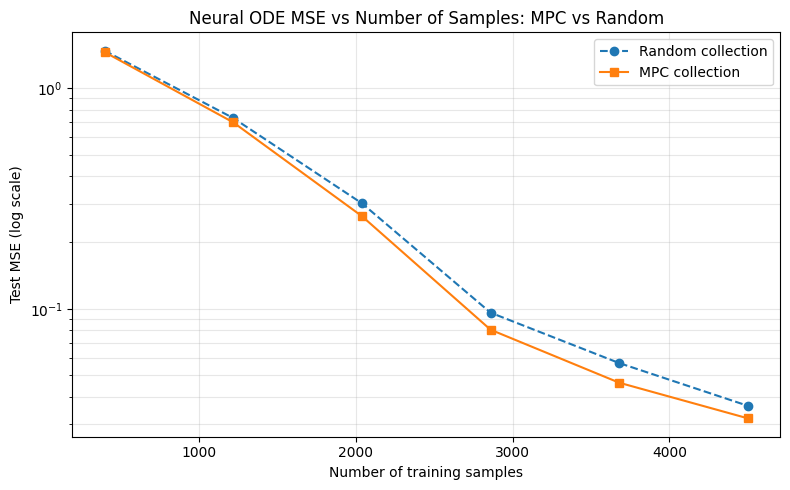

N=  400 | Random MSE=1.479373 | MPC MSE=1.457988
N= 1220 | Random MSE=0.732466 | MPC MSE=0.700322
N= 2040 | Random MSE=0.300927 | MPC MSE=0.263123
N= 2860 | Random MSE=0.096107 | MPC MSE=0.080452
N= 3680 | Random MSE=0.056803 | MPC MSE=0.046272
N= 4500 | Random MSE=0.036362 | MPC MSE=0.031902


In [67]:
# Evaluation: Neural ODE MSE vs number of samples — MPC (saved data) vs Random

import os, math
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import gym_oscillator.envs.osc_env as osc_env

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(1234); np.random.seed(1234)

# 0) Setup and dims
env_eval = osc_env.oscillatorEnv(len_state=8)
state_dim  = int(np.prod(env_eval.observation_space.shape))   # 16 for (2,8)
action_dim = int(np.prod(env_eval.action_space.shape))        # likely 1
dt_eval = 1.0

# 1) Load MPC dataset (prefer NPZ saved on disk)
def load_mpc_dataset():
    candidate_paths = [
        "data/mpc_dataset_final.npz",
        "mpc_dataset.npz"
    ]
    for p in candidate_paths:
        if os.path.exists(p):
            d = np.load(p)
            print(f"Loaded MPC dataset from {p}")
            return (d["states"].astype(np.float32).reshape(-1, state_dim),
                    d["actions"].astype(np.float32).reshape(-1, action_dim),
                    d["next_states"].astype(np.float32).reshape(-1, state_dim))
    # Fallbacks (if you didn't save to disk in this session)
    if 'replay_buffer' in globals() and hasattr(replay_buffer, 'get_all_data') and len(replay_buffer) > 0:
        s,a,y = replay_buffer.get_all_data()
        return (np.asarray(s, dtype=np.float32).reshape(-1, state_dim),
                np.asarray(a, dtype=np.float32).reshape(-1, action_dim),
                np.asarray(y, dtype=np.float32).reshape(-1, state_dim))
    if 'states' in globals() and len(states) > 0:
        return (np.asarray(states, dtype=np.float32).reshape(-1, state_dim),
                np.asarray(actions, dtype=np.float32).reshape(-1, action_dim),
                np.asarray(next_states, dtype=np.float32).reshape(-1, state_dim))
    raise RuntimeError("No MPC dataset found. Save to NPZ or keep replay_buffer in memory before running this cell.")

mpc_states_np, mpc_actions_np, mpc_next_states_np = load_mpc_dataset()
N_max = len(mpc_states_np)
print(f"MPC dataset size: {N_max} (state_dim={state_dim}, action_dim={action_dim})")

# Optional: shuffle once to avoid ordering bias
rng = np.random.RandomState(1234)
perm_mpc = rng.permutation(N_max)
mpc_states_np      = mpc_states_np[perm_mpc]
mpc_actions_np     = mpc_actions_np[perm_mpc]
mpc_next_states_np = mpc_next_states_np[perm_mpc]

# 2) Build a random baseline dataset of equal size
rand_env = osc_env.oscillatorEnv(len_state=8)
r = rand_env.reset()
obs = r[0] if isinstance(r, tuple) else r
rand_states, rand_actions, rand_next_states = [], [], []
while len(rand_states) < N_max:
    a = rand_env.action_space.sample()
    rand_states.append(obs)
    rand_actions.append(a)
    step_out = rand_env.step(a)
    if len(step_out) == 5:
        obs_next, _, terminated, truncated, _ = step_out
        done = bool(terminated or truncated)
    else:
        obs_next, _, done, _ = step_out
    rand_next_states.append(obs_next)
    obs = obs_next

rand_states_np      = np.asarray(rand_states, dtype=np.float32).reshape(-1, state_dim)
rand_actions_np     = np.asarray(rand_actions, dtype=np.float32).reshape(-1, action_dim)
rand_next_states_np = np.asarray(rand_next_states, dtype=np.float32).reshape(-1, state_dim)

# Shuffle random baseline similarly
perm_rand = rng.permutation(len(rand_states_np))
rand_states_np      = rand_states_np[perm_rand]
rand_actions_np     = rand_actions_np[perm_rand]
rand_next_states_np = rand_next_states_np[perm_rand]

# 3) Common test set (reuse if already present)
if 'torch_test_states' not in globals():
    test_env = osc_env.oscillatorEnv(len_state=8)
    num_test = 10000
    ts, ta, ty = [], [], []
    r = test_env.reset()
    tobs = r[0] if isinstance(r, tuple) else r
    for _ in range(num_test):
        act = test_env.action_space.sample()
        ts.append(tobs); ta.append(act)
        step_out = test_env.step(act)
        if len(step_out) == 5:
            nobs, _, terminated, truncated, _ = step_out
            done = bool(terminated or truncated)
        else:
            nobs, _, done, _ = step_out
        ty.append(nobs)
        tobs = nobs
    test_states       = np.asarray(ts, dtype=np.float32).reshape(-1, state_dim)
    test_actions      = np.asarray(ta, dtype=np.float32).reshape(-1, action_dim)
    test_next_states  = np.asarray(ty, dtype=np.float32).reshape(-1, state_dim)
    torch_test_states      = torch.from_numpy(test_states).to(device)
    torch_test_actions     = torch.from_numpy(test_actions).to(device)
    torch_test_next_states = torch.from_numpy(test_next_states).to(device)

# Neural ODE definition (plain, for ensemble)
class MLP(nn.Module):
    def __init__(self, in_dim, out_dim, hidden=[64, 64, 64], act=nn.Tanh):
        super().__init__()
        layers, d = [], in_dim
        for h in hidden:
            layers += [nn.Linear(d, h), act()]
            d = h
        layers.append(nn.Linear(d, out_dim))
        self.net = nn.Sequential(*layers)
    def forward(self, x): return self.net(x)

class ODEFunc(nn.Module):
    def __init__(self, state_dim, action_dim, hidden=64):
        super().__init__()
        self.f = MLP(state_dim + action_dim, state_dim, hidden=[hidden]*3, act=nn.Tanh)
    def forward(self, t, x, u):
        xu = torch.cat([x, u], dim=-1)
        return self.f(xu)

class ODEBlock(nn.Module):
    def __init__(self, func: ODEFunc, step_size=0.5):
        super().__init__()
        self.func = func
        self.step_size = step_size
    def forward(self, x0, u, t):
        dyn = lambda tt, x: self.func(tt, x, u)
        x_traj = odeint(dyn, x0, t, method='rk4', options=dict(step_size=self.step_size))
        return x_traj[-1]

class NeuralODE(nn.Module):
    def __init__(self, state_dim, action_dim, hidden=64, ode_step=0.5):
        super().__init__()
        self.func = ODEFunc(state_dim, action_dim, hidden)
        self.ode  = ODEBlock(self.func, step_size=ode_step)
    def forward(self, x, u, t):
        mu_hat = self.ode(x, u, t)
        return mu_hat

@torch.no_grad()
def extract_uncertainties(ensemble, x, u, t):
    for model in ensemble:
        model.eval()
    mus = torch.stack([model(x, u, t) for model in ensemble], dim=0)  # [M, B, S]
    mu_hat = mus.mean(dim=0)
    epistemic = mus.var(dim=0)  # [B, S]
    return mu_hat, epistemic

# 4) Helpers: training and evaluation
def tensors_from_np(Xnp, Unp, Ynp, N):
    return (torch.from_numpy(Xnp[:N].copy()).to(device),
            torch.from_numpy(Unp[:N].copy()).to(device),
            torch.from_numpy(Ynp[:N].copy()).to(device))

def _predict_mu(ensemble, xb, ub, dt):
    t = torch.tensor([0.0, dt], dtype=torch.float32, device=xb.device)
    mu_hat, _ = extract_uncertainties(ensemble, xb, ub, t)
    return mu_hat

@torch.no_grad()
def eval_mse(ensemble, Xtest, Utest, Ytest, dt=1.0, batch=2048):
    n = Xtest.shape[0]
    sse = 0.0
    for i in range(0, n, batch):
        xb = Xtest[i:i+batch]
        ub = Utest[i:i+batch]
        yb = Ytest[i:i+batch]
        mu_hat = _predict_mu(ensemble, xb, ub, dt)
        sse += torch.mean((mu_hat - yb) ** 2, dim=0).sum().item() * xb.shape[0]
    return sse / n

def train_steps_eval(ensemble, optimizers, X, U, Y, steps=1000, batch=256, dt=1.0):
    for model in ensemble:
        model.train()
    t = torch.tensor([0.0, dt], dtype=torch.float32, device=X.device)
    for _ in range(steps):
        bsz = min(batch, X.shape[0])
        idx = torch.randint(0, X.shape[0], (bsz,), device=X.device)
        xb, ub, yb = X[idx], U[idx], Y[idx]
        for i, model in enumerate(ensemble):
            mu_hat = model(xb, ub, t)
            loss = nn.MSELoss()(mu_hat, yb)
            optimizers[i].zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizers[i].step()

def train_and_eval_on_N(N, data_kind, epochs=10, batch_size=256, lr=1e-3, ensemble_size=5):
    torch.manual_seed(1234); np.random.seed(1234)
    ensemble = [NeuralODE(state_dim, action_dim, hidden=64).to(device) for _ in range(ensemble_size)]
    optimizers = [optim.Adam(model.parameters(), lr=lr) for model in ensemble]
    if data_kind == 'mpc':
        X, U, Y = tensors_from_np(mpc_states_np, mpc_actions_np, mpc_next_states_np, N)
    else:
        X, U, Y = tensors_from_np(rand_states_np, rand_actions_np, rand_next_states_np, N)
    steps = max(1, epochs * math.ceil(N / max(1, batch_size)))
    train_steps_eval(ensemble, optimizers, X, U, Y, steps=steps, batch=batch_size, dt=dt_eval)
    return eval_mse(ensemble, torch_test_states, torch_test_actions, torch_test_next_states, dt=dt_eval)

# 5) Sweep sizes and compute MSEs (fixed hyperparams for fairness)
sample_sizes = np.unique(np.linspace(min(400, N_max), N_max, 6, dtype=int))
mpc_mses, rand_mses = [], []
for N in sample_sizes:
    print(f"Train/Eval with N={N} samples")
    mpc_mses.append(train_and_eval_on_N(N, 'mpc',  epochs=10, batch_size=256, lr=1e-3))
    rand_mses.append(train_and_eval_on_N(N, 'rand', epochs=10, batch_size=256, lr=1e-3))

# 6) Plot
plt.figure(figsize=(8,5))
plt.semilogy(sample_sizes, rand_mses, 'o--', label='Random collection')
plt.semilogy(sample_sizes, mpc_mses,  's-',  label='MPC collection')
plt.xlabel('Number of training samples')
plt.ylabel('Test MSE (log scale)')
plt.title('Neural ODE MSE vs Number of Samples: MPC vs Random')
plt.grid(True, which='both', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

for n, r, m in zip(sample_sizes, rand_mses, mpc_mses):
    print(f"N={n:5d} | Random MSE={r:.6f} | MPC MSE={m:.6f}")

Loaded MPC dataset from data/mpc_dataset_final.npz
MPC dataset size: 4500 (state_dim=16, action_dim=1)
Train/Eval with N=400 samples
Train/Eval with N=1220 samples
Train/Eval with N=2040 samples
Train/Eval with N=2860 samples
Train/Eval with N=3680 samples
Train/Eval with N=4500 samples


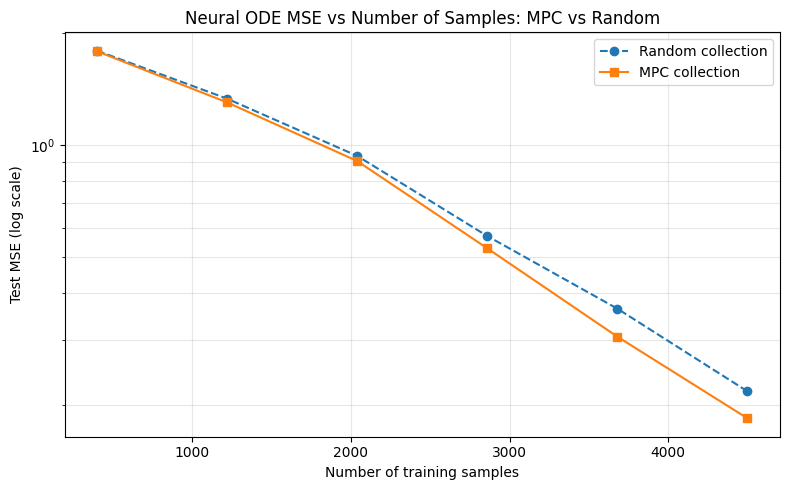

N=  400 | Random MSE=1.788567 | MPC MSE=1.781978
N= 1220 | Random MSE=1.329628 | MPC MSE=1.299372
N= 2040 | Random MSE=0.933756 | MPC MSE=0.904608
N= 2860 | Random MSE=0.569041 | MPC MSE=0.527460
N= 3680 | Random MSE=0.363338 | MPC MSE=0.305609
N= 4500 | Random MSE=0.218035 | MPC MSE=0.184548


In [79]:
# Evaluation: Neural ODE MSE vs number of samples — MPC (saved data) vs Random

import os, math
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import gym_oscillator.envs.osc_env as osc_env

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(1234); np.random.seed(1234)

# 0) Setup and dims
env_eval = osc_env.oscillatorEnv(len_state=8)
state_dim  = int(np.prod(env_eval.observation_space.shape))   # 16 for (2,8)
action_dim = int(np.prod(env_eval.action_space.shape))        # likely 1
dt_eval = 1.0

# 1) Load MPC dataset (prefer NPZ saved on disk)
def load_mpc_dataset():
    candidate_paths = [
        "data/mpc_dataset_final.npz",
        "mpc_dataset.npz"
    ]
    for p in candidate_paths:
        if os.path.exists(p):
            d = np.load(p)
            print(f"Loaded MPC dataset from {p}")
            return (d["states"].astype(np.float32).reshape(-1, state_dim),
                    d["actions"].astype(np.float32).reshape(-1, action_dim),
                    d["next_states"].astype(np.float32).reshape(-1, state_dim))
    # Fallbacks (if you didn't save to disk in this session)
    if 'replay_buffer' in globals() and hasattr(replay_buffer, 'get_all_data') and len(replay_buffer) > 0:
        s,a,y = replay_buffer.get_all_data()
        return (np.asarray(s, dtype=np.float32).reshape(-1, state_dim),
                np.asarray(a, dtype=np.float32).reshape(-1, action_dim),
                np.asarray(y, dtype=np.float32).reshape(-1, state_dim))
    if 'states' in globals() and len(states) > 0:
        return (np.asarray(states, dtype=np.float32).reshape(-1, state_dim),
                np.asarray(actions, dtype=np.float32).reshape(-1, action_dim),
                np.asarray(next_states, dtype=np.float32).reshape(-1, state_dim))
    raise RuntimeError("No MPC dataset found. Save to NPZ or keep replay_buffer in memory before running this cell.")

mpc_states_np, mpc_actions_np, mpc_next_states_np = load_mpc_dataset()
N_max = len(mpc_states_np)
print(f"MPC dataset size: {N_max} (state_dim={state_dim}, action_dim={action_dim})")

# Optional: shuffle once to avoid ordering bias
rng = np.random.RandomState(1234)
perm_mpc = rng.permutation(N_max)
mpc_states_np      = mpc_states_np[perm_mpc]
mpc_actions_np     = mpc_actions_np[perm_mpc]
mpc_next_states_np = mpc_next_states_np[perm_mpc]

# 2) Build a random baseline dataset of equal size
rand_env = osc_env.oscillatorEnv(len_state=8)
r = rand_env.reset()
obs = r[0] if isinstance(r, tuple) else r
rand_states, rand_actions, rand_next_states = [], [], []
while len(rand_states) < N_max:
    a = rand_env.action_space.sample()
    rand_states.append(obs)
    rand_actions.append(a)
    step_out = rand_env.step(a)
    if len(step_out) == 5:
        obs_next, _, terminated, truncated, _ = step_out
        done = bool(terminated or truncated)
    else:
        obs_next, _, done, _ = step_out
    rand_next_states.append(obs_next)
    obs = obs_next

rand_states_np      = np.asarray(rand_states, dtype=np.float32).reshape(-1, state_dim)
rand_actions_np     = np.asarray(rand_actions, dtype=np.float32).reshape(-1, action_dim)
rand_next_states_np = np.asarray(rand_next_states, dtype=np.float32).reshape(-1, state_dim)

# Shuffle random baseline similarly
perm_rand = rng.permutation(len(rand_states_np))
rand_states_np      = rand_states_np[perm_rand]
rand_actions_np     = rand_actions_np[perm_rand]
rand_next_states_np = rand_next_states_np[perm_rand]

# 3) Common test set (reuse if already present)
if 'torch_test_states' not in globals():
    test_env = osc_env.oscillatorEnv(len_state=8)
    num_test = 10000
    ts, ta, ty = [], [], []
    r = test_env.reset()
    tobs = r[0] if isinstance(r, tuple) else r
    for _ in range(num_test):
        act = test_env.action_space.sample()
        ts.append(tobs); ta.append(act)
        step_out = test_env.step(act)
        if len(step_out) == 5:
            nobs, _, terminated, truncated, _ = step_out
            done = bool(terminated or truncated)
        else:
            nobs, _, done, _ = step_out
        ty.append(nobs)
        tobs = nobs
    test_states       = np.asarray(ts, dtype=np.float32).reshape(-1, state_dim)
    test_actions      = np.asarray(ta, dtype=np.float32).reshape(-1, action_dim)
    test_next_states  = np.asarray(ty, dtype=np.float32).reshape(-1, state_dim)
    torch_test_states      = torch.from_numpy(test_states).to(device)
    torch_test_actions     = torch.from_numpy(test_actions).to(device)
    torch_test_next_states = torch.from_numpy(test_next_states).to(device)

# Neural ODE definition (plain, for ensemble)
class MLP(nn.Module):
    def __init__(self, in_dim, out_dim, hidden=[64, 64, 64], act=nn.Tanh):
        super().__init__()
        layers, d = [], in_dim
        for h in hidden:
            layers += [nn.Linear(d, h), act()]
            d = h
        layers.append(nn.Linear(d, out_dim))
        self.net = nn.Sequential(*layers)
    def forward(self, x): return self.net(x)

class ODEFunc(nn.Module):
    def __init__(self, state_dim, action_dim, hidden=64):
        super().__init__()
        self.f = MLP(state_dim + action_dim, state_dim, hidden=[hidden]*3, act=nn.Tanh)
    def forward(self, t, x, u):
        xu = torch.cat([x, u], dim=-1)
        return self.f(xu)

class ODEBlock(nn.Module):
    def __init__(self, func: ODEFunc, step_size=0.5):
        super().__init__()
        self.func = func
        self.step_size = step_size
    def forward(self, x0, u, t):
        dyn = lambda tt, x: self.func(tt, x, u)
        x_traj = odeint(dyn, x0, t, method='rk4', options=dict(step_size=self.step_size))
        return x_traj[-1]

class NeuralODE(nn.Module):
    def __init__(self, state_dim, action_dim, hidden=64, ode_step=0.5):
        super().__init__()
        self.func = ODEFunc(state_dim, action_dim, hidden)
        self.ode  = ODEBlock(self.func, step_size=ode_step)
    def forward(self, x, u, t):
        mu_hat = self.ode(x, u, t)
        return mu_hat

@torch.no_grad()
def extract_uncertainties(ensemble, x, u, t):
    for model in ensemble:
        model.eval()
    mus = torch.stack([model(x, u, t) for model in ensemble], dim=0)  # [M, B, S]
    mu_hat = mus.mean(dim=0)
    epistemic = mus.var(dim=0)  # [B, S]
    return mu_hat, epistemic

# 4) Helpers: training and evaluation
def tensors_from_np(Xnp, Unp, Ynp, N):
    return (torch.from_numpy(Xnp[:N].copy()).to(device),
            torch.from_numpy(Unp[:N].copy()).to(device),
            torch.from_numpy(Ynp[:N].copy()).to(device))

def _predict_mu(ensemble, xb, ub, dt):
    t = torch.tensor([0.0, dt], dtype=torch.float32, device=xb.device)
    mu_hat, _ = extract_uncertainties(ensemble, xb, ub, t)
    return mu_hat

@torch.no_grad()
def eval_mse(ensemble, Xtest, Utest, Ytest, dt=1.0, batch=2048):
    n = Xtest.shape[0]
    sse = 0.0
    for i in range(0, n, batch):
        xb = Xtest[i:i+batch]
        ub = Utest[i:i+batch]
        yb = Ytest[i:i+batch]
        mu_hat = _predict_mu(ensemble, xb, ub, dt)
        sse += torch.mean((mu_hat - yb) ** 2, dim=0).sum().item() * xb.shape[0]
    return sse / n

def train_steps_eval(ensemble, optimizers, X, U, Y, steps=1000, batch=256, dt=1.0):
    for model in ensemble:
        model.train()
    t = torch.tensor([0.0, dt], dtype=torch.float32, device=X.device)
    for _ in range(steps):
        bsz = min(batch, X.shape[0])
        idx = torch.randint(0, X.shape[0], (bsz,), device=X.device)
        xb, ub, yb = X[idx], U[idx], Y[idx]
        for i, model in enumerate(ensemble):
            mu_hat = model(xb, ub, t)
            loss = nn.MSELoss()(mu_hat, yb)
            optimizers[i].zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizers[i].step()

def train_and_eval_on_N(N, data_kind, epochs=10, batch_size=256, lr=1e-3, ensemble_size=5):
    torch.manual_seed(1234); np.random.seed(1234)
    ensemble = [NeuralODE(state_dim, action_dim, hidden=64).to(device) for _ in range(ensemble_size)]
    optimizers = [optim.Adam(model.parameters(), lr=lr) for model in ensemble]
    if data_kind == 'mpc':
        X, U, Y = tensors_from_np(mpc_states_np, mpc_actions_np, mpc_next_states_np, N)
    else:
        X, U, Y = tensors_from_np(rand_states_np, rand_actions_np, rand_next_states_np, N)
    steps = max(1, epochs * math.ceil(N / max(1, batch_size)))
    train_steps_eval(ensemble, optimizers, X, U, Y, steps=steps, batch=batch_size, dt=dt_eval)
    return eval_mse(ensemble, torch_test_states, torch_test_actions, torch_test_next_states, dt=dt_eval)

# 5) Sweep sizes and compute MSEs (fixed hyperparams for fairness)
sample_sizes = np.unique(np.linspace(min(400, N_max), N_max, 6, dtype=int))
mpc_mses, rand_mses = [], []
for N in sample_sizes:
    print(f"Train/Eval with N={N} samples")
    mpc_mses.append(train_and_eval_on_N(N, 'mpc',  epochs=5, batch_size=256, lr=1e-3))
    rand_mses.append(train_and_eval_on_N(N, 'rand', epochs=5, batch_size=256, lr=1e-3))

# 6) Plot
plt.figure(figsize=(8,5))
plt.semilogy(sample_sizes, rand_mses, 'o--', label='Random collection')
plt.semilogy(sample_sizes, mpc_mses,  's-',  label='MPC collection')
plt.xlabel('Number of training samples')
plt.ylabel('Test MSE (log scale)')
plt.title('Neural ODE MSE vs Number of Samples: MPC vs Random')
plt.grid(True, which='both', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

for n, r, m in zip(sample_sizes, rand_mses, mpc_mses):
    print(f"N={n:5d} | Random MSE={r:.6f} | MPC MSE={m:.6f}")

In [81]:
from collections import deque
import random
from pathlib import Path
import os, time

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.distributions.normal import Normal
from torchdiffeq import odeint

# --- Your env ---
# pip install gym torchdiffeq
import gym_oscillator.envs.osc_env as osc_env


# =====================
# Neural ODE model (Plain, without evidential)
# =====================

class MLP(nn.Module):
    def __init__(self, in_dim, out_dim, hidden=[64, 64, 64], act=nn.Tanh):
        super().__init__()
        layers, d = [], in_dim
        for h in hidden:
            layers += [nn.Linear(d, h), act()]
            d = h
        layers.append(nn.Linear(d, out_dim))
        self.net = nn.Sequential(*layers)
    def forward(self, x): return self.net(x)

class ODEFunc(nn.Module):
    """dx/dt = f_theta(x, u)"""
    def __init__(self, state_dim, action_dim, hidden=64):
        super().__init__()
        self.f = MLP(state_dim + action_dim, state_dim, hidden=[hidden]*3, act=nn.Tanh)
    def forward(self, t, x, u):
        xu = torch.cat([x, u], dim=-1)
        return self.f(xu)

class ODEBlock(nn.Module):
    """x_{t+Δt} via fixed-step RK4 over [0, dt]"""
    def __init__(self, func: ODEFunc, step_size=0.5):
        super().__init__()
        self.func = func
        self.step_size = step_size
    def forward(self, x0, u, t):
        dyn = lambda tt, x: self.func(tt, x, u)
        x_traj = odeint(dyn, x0, t, method='rk4', options=dict(step_size=self.step_size))
        return x_traj[-1]

class NeuralODE(nn.Module):
    def __init__(self, state_dim, action_dim, hidden=64, ode_step=0.5):
        super().__init__()
        self.func = ODEFunc(state_dim, action_dim, hidden)
        self.ode  = ODEBlock(self.func, step_size=ode_step)
    def forward(self, x, u, t):
        mu_hat = self.ode(x, u, t)
        return mu_hat

@torch.no_grad()
def extract_uncertainties(ensemble, x, u, t):
    """Return mu_hat, epistemic (variance over ensemble means)."""
    for model in ensemble:
        model.eval()
    mus = torch.stack([model(x, u, t) for model in ensemble], dim=0)  # [M, B, S]
    mu_hat = mus.mean(dim=0)
    epistemic = mus.var(dim=0)  # [B, S]
    return mu_hat, epistemic


# =====================
# Running state stats (kept but not used in scoring)
# =====================

class RunningScale:
    """Track per-dimension std for states."""
    def __init__(self, dim, eps=1e-8, device="cpu"):
        self.dim = dim
        self.eps = eps
        self.n = 0
        self.mean = torch.zeros(dim, device=device)
        self.M2 = torch.zeros(dim, device=device)
    def update(self, x_batch: torch.Tensor):
        x = x_batch.detach()
        n_b = x.shape[0]
        if n_b == 0: return
        self.n += n_b
        delta = x.mean(0) - self.mean
        self.mean += delta * (n_b / max(self.n, 1))
        var_b = x.var(dim=0, unbiased=True)
        alpha = min(0.1, n_b / max(self.n, 1.0))
        self.M2 = (1 - alpha) * self.M2 + alpha * var_b * max(self.n - 1, 1)
    def std(self):
        var = self.M2 / max(self.n - 1, 1)
        return torch.sqrt(var + self.eps)


# =====================
# Replay buffer (unchanged)
# =====================

class ReplayBuffer:
    def __init__(self, capacity):
        self.buffer = deque(maxlen=capacity)
    def add(self, state, action, next_state):
        self.buffer.append((state, action, next_state))
    def sample(self, batch_size):
        return random.sample(self.buffer, batch_size)
    def get_all_data(self):
        states, actions, next_states = zip(*self.buffer)
        return np.array(states), np.array(actions), np.array(next_states)
    def __len__(self):
        return len(self.buffer)


def save_replay_npz(replay_buffer, path="mpc_dataset3.npz", *, state_dim=None, action_dim=None):
    if len(replay_buffer) == 0:
        print("ReplayBuffer empty; skipping save.")
        return
    states, actions, next_states = replay_buffer.get_all_data()
    states = np.asarray(states,  dtype=np.float32)
    actions = np.asarray(actions, dtype=np.float32)
    next_states = np.asarray(next_states, dtype=np.float32)
    if state_dim is not None:
        states = states.reshape(-1, state_dim)
        next_states = next_states.reshape(-1, state_dim)
    if action_dim is not None:
        actions = actions.reshape(-1, action_dim)

    Path(os.path.dirname(path) or ".").mkdir(parents=True, exist_ok=True)
    np.savez_compressed(path, states=states, actions=actions, next_states=next_states)
    print(f"Saved MPC dataset: {path} | N={len(states)}")


# =====================
# CEM Uncertainty-seeking MPC with Optimism
# =====================

class MPC_CEM_Collector:
    def __init__(self, ensemble, action_space, dt, horizon, num_sequences, num_elites, num_iterations, device,
                 init_std_frac=0.40, min_std_frac=0.10, discount=0.98, lam_du=0.05, use_log_score=False,
                 optimism_beta=1.0):
        self.ensemble = ensemble
        self.device = device

        self.action_dim = int(np.prod(action_space.shape))
        self.action_low  = torch.tensor(action_space.low,  dtype=torch.float32, device=device)
        self.action_high = torch.tensor(action_space.high, dtype=torch.float32, device=device)
        self.action_range = (self.action_high - self.action_low).clamp(min=1e-6)

        self.horizon = horizon
        self.num_sequences = num_sequences
        self.num_elites = num_elites
        self.num_iterations = num_iterations

        self.mean = torch.zeros(horizon, self.action_dim, device=device)
        self.std  = (init_std_frac * self.action_range).repeat(horizon, 1)
        self.min_std = (min_std_frac * self.action_range)

        self.discount = discount
        self.lam_du = lam_du
        self.use_log_score = use_log_score
        self.optimism_beta = optimism_beta  # Beta for optimistic rollout

        self.t = torch.tensor([0.0, dt], dtype=torch.float32, device=device)

        self.state_scale = None

    def set_state_scale(self, state_scale: torch.Tensor):
        self.state_scale = state_scale

    def _sample_actions(self, mean, std):
        dist = Normal(mean, std.clamp(min=1e-6))
        U = dist.sample((self.num_sequences,))
        U = torch.clamp(U, self.action_low, self.action_high)
        return U

    @torch.no_grad()
    def get_action(self, current_state_np: np.ndarray):
        x0 = torch.from_numpy(current_state_np).float().to(self.device)

        self.mean = torch.cat([self.mean[1:], torch.zeros_like(self.mean[-1:])], dim=0)
        self.std  = torch.maximum(torch.cat([self.std[1:], self.std[-1:]], dim=0), self.min_std)

        mean = self.mean.clone()
        std  = self.std.clone()

        if self.state_scale is None:
            self.state_scale = torch.ones_like(x0)

        for _ in range(self.num_iterations):
            U = self._sample_actions(mean, std)

            scores = torch.zeros(self.num_sequences, device=self.device)
            X = x0.unsqueeze(0).repeat(self.num_sequences, 1)
            prev_a = None
            gamma = 1.0

            for h in range(self.horizon):
                a_h = U[:, h, :]
                mu, epistemic = extract_uncertainties(self.ensemble, X, a_h, self.t)
                # FIXED: Simple sum epistemic (no /state_scale or aleatoric)
                info = epistemic

                if self.use_log_score:
                    step_score = torch.log(info + 1e-8).sum(-1)
                else:
                    step_score = info.sum(-1)

                du = 0.0 if prev_a is None else (a_h - prev_a).pow(2).sum(-1)

                scores += gamma * (step_score - self.lam_du * du)
                gamma *= self.discount
                prev_a = a_h
                # FIXED: Optimistic rollout
                optimism_dir = torch.sign(torch.randn_like(epistemic))  # Random direction in [-1,1]
                X = mu + self.optimism_beta * torch.sqrt(epistemic) * optimism_dir

            vals, idx = torch.topk(scores, self.num_elites, largest=True)
            elites = U[idx]

            w = torch.softmax((vals - vals.max()), dim=0).view(-1, 1, 1)
            mean = (w * elites).sum(dim=0) / (w.sum(dim=0) + 1e-8)
            var  = (w * (elites - mean).pow(2)).sum(dim=0) / (w.sum(dim=0) + 1e-8)
            std  = torch.sqrt(var + 1e-6)

            std = torch.clamp(std, self.min_std, self.action_range)

        self.mean, self.std = mean.detach(), std.detach()
        return mean[0].cpu().numpy()


# =====================
# Training loop (adapted for ensemble)
# =====================

def train_model(ensemble, optimizers, replay_buffer, device, dt, train_steps, batch_size):
    for model in ensemble:
        model.train()
    if len(replay_buffer) < batch_size:
        print("Not enough data in buffer to train. Skipping.")
        return

    states, actions, next_states = replay_buffer.get_all_data()
    torch_states = torch.from_numpy(np.asarray(states, dtype=np.float32)).to(device)
    torch_actions = torch.from_numpy(np.asarray(actions, dtype=np.float32)).to(device)
    torch_next_states = torch.from_numpy(np.asarray(next_states, dtype=np.float32)).to(device)

    t = torch.tensor([0.0, dt], dtype=torch.float32, device=device)

    print(f"Training on {len(torch_states)} samples for {train_steps} steps...")
    losses = [[] for _ in ensemble]

    for step in range(train_steps):
        idx = torch.randint(0, len(torch_states), (min(batch_size, len(torch_states)),), device=device)
        xb = torch_states[idx]
        ub = torch_actions[idx]
        yb = torch_next_states[idx]

        for i, model in enumerate(ensemble):
            mu_hat = model(xb, ub, t)
            loss = nn.MSELoss()(mu_hat, yb)  # Simple MSE for plain ODEs

            optimizers[i].zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizers[i].step()
            losses[i].append(loss.item())

        if (step + 1) % 100 == 0:
            avg_loss = np.mean([np.mean(l[-100:]) for l in losses])
            print(f"  step {step+1}/{train_steps} | avg loss (ensemble)={avg_loss:.4f}")


# =====================
# Main active loop
# =====================

def main():
    # ---- Hyperparameters ----
    HIDDEN_DIM = 128
    ENSEMBLE_SIZE = 5  # FIXED: For better uncertainty

    # Training
    LEARNING_RATE = 1e-3
    BATCH_SIZE = 256
    REPLAY_BUFFER_CAPACITY = 100_000

    # Data collection
    SEED_STEPS = 500  # Increased for better initial calibration
    INITIAL_TRAIN_STEPS = 300
    EPISODES = 40
    STEPS_PER_EPISODE = 100
    RETRAIN_STEPS_BASE = 400  # Increased

    # CEM policy
    MPC_HORIZON = 35  # Increased
    MPC_ITERATIONS = 8  # Increased
    MPC_SEQUENCES = 800  # Increased
    MPC_ELITES = 80  # Increased
    CEM_DISCOUNT = 0.98
    CEM_LAM_DU = 0.05
    ACTION_NOISE_PROB = 0.2  # Increased
    OPTIMISM_BETA = 1.5  # For optimistic rollouts

    # ---- Setup ----
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    env = osc_env.oscillatorEnv(len_state=8)

    STATE_DIM = int(np.prod(env.observation_space.shape))
    ACTION_DIM = int(np.prod(env.action_space.shape))
    print(f"Env ready | state_dim={STATE_DIM} | action_dim={ACTION_DIM}")

    # FIXED: Ensemble of NeuralODEs
    ensemble = [NeuralODE(STATE_DIM, ACTION_DIM, hidden=HIDDEN_DIM, ode_step=0.5).to(device) for _ in range(ENSEMBLE_SIZE)]
    optimizers = [optim.Adam(model.parameters(), lr=LEARNING_RATE) for model in ensemble]
    replay_buffer = ReplayBuffer(REPLAY_BUFFER_CAPACITY)

    dt_env = 1.0

    scale_tracker = RunningScale(dim=STATE_DIM, device=device)

    # ---- 1) Seeding with random actions ----
    print(f"--- Seeding {SEED_STEPS} random steps ---")
    obs = env.reset()
    if isinstance(obs, tuple): obs = obs[0]

    step_count = 0
    for _ in range(SEED_STEPS):
        a = env.action_space.sample()
        step = env.step(a)
        if len(step) == 5:
            next_obs, _, terminated, truncated, _ = step
            done = bool(terminated or truncated)
        else:
            next_obs, _, done, _ = step

        replay_buffer.add(np.asarray(obs).flatten(), np.asarray(a), np.asarray(next_obs).flatten())
        obs = next_obs if not done else env.reset()[0] if isinstance(env.reset(), tuple) else env.reset()

    print(f"Seed buffer size: {len(replay_buffer)}")

    # ---- 2) Initial training ----
    print("\n--- Initial training ---")
    train_model(ensemble, optimizers, replay_buffer, device, dt_env,
                train_steps=INITIAL_TRAIN_STEPS, batch_size=BATCH_SIZE)
    print("Initial training done.")

    # ---- 3) Active learning with CEM ----
    print(f"\n--- Active learning for {EPISODES} episodes ---")

    mpc_policy = MPC_CEM_Collector(
        ensemble, env.action_space, dt_env, MPC_HORIZON,
        MPC_SEQUENCES, MPC_ELITES, MPC_ITERATIONS, device,
        init_std_frac=0.40, min_std_frac=0.10,
        discount=CEM_DISCOUNT, lam_du=CEM_LAM_DU, use_log_score=False,  # Try True if needed
        optimism_beta=OPTIMISM_BETA
    )

    def update_state_scale_from_buffer():
        if len(replay_buffer) == 0:
            mpc_policy.set_state_scale(torch.ones(STATE_DIM, device=device))
            return
        s_np, _, _ = replay_buffer.get_all_data()
        s_t = torch.from_numpy(np.asarray(s_np, dtype=np.float32)).to(device)
        if s_t.shape[0] > 5000:
            idx = torch.randint(0, s_t.shape[0], (5000,), device=device)
            s_t = s_t[idx]
        scale_tracker.update(s_t)
        mpc_policy.set_state_scale(scale_tracker.std())

    obs = obs

    for ep in range(EPISODES):
        print(f"\n--- Episode {ep+1}/{EPISODES} ---")

        print(f"Collecting {STEPS_PER_EPISODE} steps with CEM (uncertainty-seeking)...")
        update_state_scale_from_buffer()

        for s in range(STEPS_PER_EPISODE):
            if random.random() < ACTION_NOISE_PROB:
                action = env.action_space.sample()
            else:
                action = mpc_policy.get_action(np.asarray(obs).flatten())
            action = np.clip(action, env.action_space.low, env.action_space.high)

            step = env.step(action)
            if len(step) == 5:
                next_obs, _, terminated, truncated, _ = step
                done = bool(terminated or truncated)
            else:
                next_obs, _, done, _ = step

            replay_buffer.add(np.asarray(obs).flatten(), np.asarray(action), np.asarray(next_obs).flatten())
            obs = next_obs
            step_count += 1
            # FIXED: Periodic reset for diversity (every 50 steps if no done)
            # if done or (step_count % 50 == 0):
            #     r = env.reset()
            #     obs = r[0] if isinstance(r, tuple) else r
            #     done = False

        print(f"Collection done. Buffer size: {len(replay_buffer)}")

        retrain_steps = min(300, RETRAIN_STEPS_BASE + int(len(replay_buffer) / 500))  # Scale more
        train_model(ensemble, optimizers, replay_buffer, device, dt_env,
                    train_steps=retrain_steps, batch_size=BATCH_SIZE)

    save_replay_npz(
        replay_buffer,
        path="data/mpc_dataset_final3.npz",
        state_dim=STATE_DIM,
        action_dim=ACTION_DIM,
    )
    print("\n--- Active Learning Finished ---")


if __name__ == "__main__":
    main()

Using device: cuda
Env ready | state_dim=16 | action_dim=1
--- Seeding 500 random steps ---
Seed buffer size: 500

--- Initial training ---
Training on 500 samples for 300 steps...
  step 100/300 | avg loss (ensemble)=0.0302
  step 200/300 | avg loss (ensemble)=0.0019
  step 300/300 | avg loss (ensemble)=0.0009
Initial training done.

--- Active learning for 40 episodes ---

--- Episode 1/40 ---
Collection done. Buffer size: 600
Training on 600 samples for 300 steps...
  step 100/300 | avg loss (ensemble)=0.0008
  step 200/300 | avg loss (ensemble)=0.0005
  step 300/300 | avg loss (ensemble)=0.0005

--- Episode 2/40 ---
Collection done. Buffer size: 700
Training on 700 samples for 300 steps...
  step 100/300 | avg loss (ensemble)=0.0005
  step 200/300 | avg loss (ensemble)=0.0004
  step 300/300 | avg loss (ensemble)=0.0003

--- Episode 3/40 ---
Collection done. Buffer size: 800
Training on 800 samples for 300 steps...
  step 100/300 | avg loss (ensemble)=0.0005
  step 200/300 | avg los

Loaded MPC dataset from data/mpc_dataset_final3.npz
MPC dataset size: 4500 (state_dim=16, action_dim=1)
Train/Eval with N=400 samples
Train/Eval with N=1220 samples
Train/Eval with N=2040 samples
Train/Eval with N=2860 samples
Train/Eval with N=3680 samples
Train/Eval with N=4500 samples


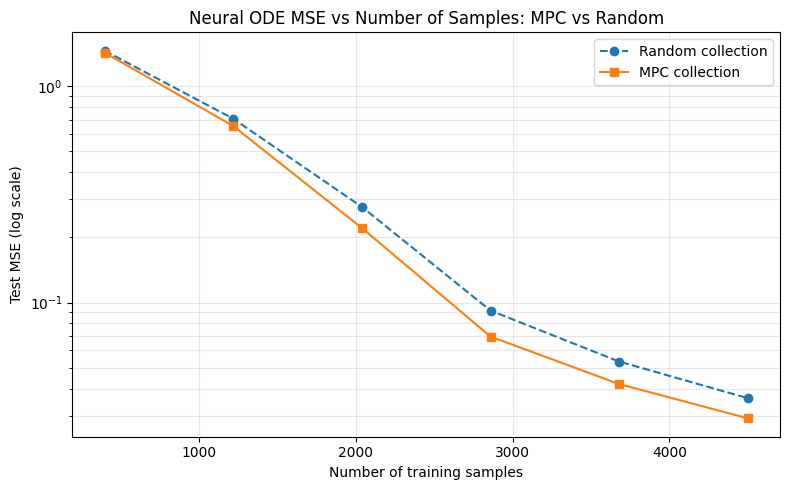

N=  400 | Random MSE=1.462883 | MPC MSE=1.433703
N= 1220 | Random MSE=0.708664 | MPC MSE=0.655326
N= 2040 | Random MSE=0.276889 | MPC MSE=0.221174
N= 2860 | Random MSE=0.091741 | MPC MSE=0.069531
N= 3680 | Random MSE=0.053289 | MPC MSE=0.041940
N= 4500 | Random MSE=0.036078 | MPC MSE=0.029110


In [83]:
# Evaluation: Neural ODE MSE vs number of samples — MPC (saved data) vs Random

import os, math
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import gym_oscillator.envs.osc_env as osc_env

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(1234); np.random.seed(1234)

# 0) Setup and dims
env_eval = osc_env.oscillatorEnv(len_state=8)
state_dim  = int(np.prod(env_eval.observation_space.shape))   # 16 for (2,8)
action_dim = int(np.prod(env_eval.action_space.shape))        # likely 1
dt_eval = 1.0

# 1) Load MPC dataset (prefer NPZ saved on disk)
def load_mpc_dataset():
    candidate_paths = [
        "data/mpc_dataset_final3.npz"
        # "mpc_dataset.npz
    ]
    for p in candidate_paths:
        if os.path.exists(p):
            d = np.load(p)
            print(f"Loaded MPC dataset from {p}")
            return (d["states"].astype(np.float32).reshape(-1, state_dim),
                    d["actions"].astype(np.float32).reshape(-1, action_dim),
                    d["next_states"].astype(np.float32).reshape(-1, state_dim))
    # Fallbacks (if you didn't save to disk in this session)
    if 'replay_buffer' in globals() and hasattr(replay_buffer, 'get_all_data') and len(replay_buffer) > 0:
        s,a,y = replay_buffer.get_all_data()
        return (np.asarray(s, dtype=np.float32).reshape(-1, state_dim),
                np.asarray(a, dtype=np.float32).reshape(-1, action_dim),
                np.asarray(y, dtype=np.float32).reshape(-1, state_dim))
    if 'states' in globals() and len(states) > 0:
        return (np.asarray(states, dtype=np.float32).reshape(-1, state_dim),
                np.asarray(actions, dtype=np.float32).reshape(-1, action_dim),
                np.asarray(next_states, dtype=np.float32).reshape(-1, state_dim))
    raise RuntimeError("No MPC dataset found. Save to NPZ or keep replay_buffer in memory before running this cell.")

mpc_states_np, mpc_actions_np, mpc_next_states_np = load_mpc_dataset()
N_max = len(mpc_states_np)
print(f"MPC dataset size: {N_max} (state_dim={state_dim}, action_dim={action_dim})")

# Optional: shuffle once to avoid ordering bias
rng = np.random.RandomState(1234)
perm_mpc = rng.permutation(N_max)
mpc_states_np      = mpc_states_np[perm_mpc]
mpc_actions_np     = mpc_actions_np[perm_mpc]
mpc_next_states_np = mpc_next_states_np[perm_mpc]

# 2) Build a random baseline dataset of equal size
rand_env = osc_env.oscillatorEnv(len_state=8)
r = rand_env.reset()
obs = r[0] if isinstance(r, tuple) else r
rand_states, rand_actions, rand_next_states = [], [], []
while len(rand_states) < N_max:
    a = rand_env.action_space.sample()
    rand_states.append(obs)
    rand_actions.append(a)
    step_out = rand_env.step(a)
    if len(step_out) == 5:
        obs_next, _, terminated, truncated, _ = step_out
        done = bool(terminated or truncated)
    else:
        obs_next, _, done, _ = step_out
    rand_next_states.append(obs_next)
    obs = obs_next

rand_states_np      = np.asarray(rand_states, dtype=np.float32).reshape(-1, state_dim)
rand_actions_np     = np.asarray(rand_actions, dtype=np.float32).reshape(-1, action_dim)
rand_next_states_np = np.asarray(rand_next_states, dtype=np.float32).reshape(-1, state_dim)

# Shuffle random baseline similarly
perm_rand = rng.permutation(len(rand_states_np))
rand_states_np      = rand_states_np[perm_rand]
rand_actions_np     = rand_actions_np[perm_rand]
rand_next_states_np = rand_next_states_np[perm_rand]

# 3) Common test set (reuse if already present)
if 'torch_test_states' not in globals():
    test_env = osc_env.oscillatorEnv(len_state=8)
    num_test = 10000
    ts, ta, ty = [], [], []
    r = test_env.reset()
    tobs = r[0] if isinstance(r, tuple) else r
    for _ in range(num_test):
        act = test_env.action_space.sample()
        ts.append(tobs); ta.append(act)
        step_out = test_env.step(act)
        if len(step_out) == 5:
            nobs, _, terminated, truncated, _ = step_out
            done = bool(terminated or truncated)
        else:
            nobs, _, done, _ = step_out
        ty.append(nobs)
        tobs = nobs
    test_states       = np.asarray(ts, dtype=np.float32).reshape(-1, state_dim)
    test_actions      = np.asarray(ta, dtype=np.float32).reshape(-1, action_dim)
    test_next_states  = np.asarray(ty, dtype=np.float32).reshape(-1, state_dim)
    torch_test_states      = torch.from_numpy(test_states).to(device)
    torch_test_actions     = torch.from_numpy(test_actions).to(device)
    torch_test_next_states = torch.from_numpy(test_next_states).to(device)

# Neural ODE definition (plain, for ensemble)
class MLP(nn.Module):
    def __init__(self, in_dim, out_dim, hidden=[64, 64, 64], act=nn.Tanh):
        super().__init__()
        layers, d = [], in_dim
        for h in hidden:
            layers += [nn.Linear(d, h), act()]
            d = h
        layers.append(nn.Linear(d, out_dim))
        self.net = nn.Sequential(*layers)
    def forward(self, x): return self.net(x)

class ODEFunc(nn.Module):
    def __init__(self, state_dim, action_dim, hidden=64):
        super().__init__()
        self.f = MLP(state_dim + action_dim, state_dim, hidden=[hidden]*3, act=nn.Tanh)
    def forward(self, t, x, u):
        xu = torch.cat([x, u], dim=-1)
        return self.f(xu)

class ODEBlock(nn.Module):
    def __init__(self, func: ODEFunc, step_size=0.5):
        super().__init__()
        self.func = func
        self.step_size = step_size
    def forward(self, x0, u, t):
        dyn = lambda tt, x: self.func(tt, x, u)
        x_traj = odeint(dyn, x0, t, method='rk4', options=dict(step_size=self.step_size))
        return x_traj[-1]

class NeuralODE(nn.Module):
    def __init__(self, state_dim, action_dim, hidden=64, ode_step=0.5):
        super().__init__()
        self.func = ODEFunc(state_dim, action_dim, hidden)
        self.ode  = ODEBlock(self.func, step_size=ode_step)
    def forward(self, x, u, t):
        mu_hat = self.ode(x, u, t)
        return mu_hat

@torch.no_grad()
def extract_uncertainties(ensemble, x, u, t):
    for model in ensemble:
        model.eval()
    mus = torch.stack([model(x, u, t) for model in ensemble], dim=0)  # [M, B, S]
    mu_hat = mus.mean(dim=0)
    epistemic = mus.var(dim=0)  # [B, S]
    return mu_hat, epistemic

# 4) Helpers: training and evaluation
def tensors_from_np(Xnp, Unp, Ynp, N):
    return (torch.from_numpy(Xnp[:N].copy()).to(device),
            torch.from_numpy(Unp[:N].copy()).to(device),
            torch.from_numpy(Ynp[:N].copy()).to(device))

def _predict_mu(ensemble, xb, ub, dt):
    t = torch.tensor([0.0, dt], dtype=torch.float32, device=xb.device)
    mu_hat, _ = extract_uncertainties(ensemble, xb, ub, t)
    return mu_hat

@torch.no_grad()
def eval_mse(ensemble, Xtest, Utest, Ytest, dt=1.0, batch=2048):
    n = Xtest.shape[0]
    sse = 0.0
    for i in range(0, n, batch):
        xb = Xtest[i:i+batch]
        ub = Utest[i:i+batch]
        yb = Ytest[i:i+batch]
        mu_hat = _predict_mu(ensemble, xb, ub, dt)
        sse += torch.mean((mu_hat - yb) ** 2, dim=0).sum().item() * xb.shape[0]
    return sse / n

def train_steps_eval(ensemble, optimizers, X, U, Y, steps=1000, batch=256, dt=1.0):
    for model in ensemble:
        model.train()
    t = torch.tensor([0.0, dt], dtype=torch.float32, device=X.device)
    for _ in range(steps):
        bsz = min(batch, X.shape[0])
        idx = torch.randint(0, X.shape[0], (bsz,), device=X.device)
        xb, ub, yb = X[idx], U[idx], Y[idx]
        for i, model in enumerate(ensemble):
            mu_hat = model(xb, ub, t)
            loss = nn.MSELoss()(mu_hat, yb)
            optimizers[i].zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizers[i].step()

def train_and_eval_on_N(N, data_kind, epochs=10, batch_size=256, lr=1e-3, ensemble_size=5):
    torch.manual_seed(1234); np.random.seed(1234)
    ensemble = [NeuralODE(state_dim, action_dim, hidden=64).to(device) for _ in range(ensemble_size)]
    optimizers = [optim.Adam(model.parameters(), lr=lr) for model in ensemble]
    if data_kind == 'mpc':
        X, U, Y = tensors_from_np(mpc_states_np, mpc_actions_np, mpc_next_states_np, N)
    else:
        X, U, Y = tensors_from_np(rand_states_np, rand_actions_np, rand_next_states_np, N)
    steps = max(1, epochs * math.ceil(N / max(1, batch_size)))
    train_steps_eval(ensemble, optimizers, X, U, Y, steps=steps, batch=batch_size, dt=dt_eval)
    return eval_mse(ensemble, torch_test_states, torch_test_actions, torch_test_next_states, dt=dt_eval)

# 5) Sweep sizes and compute MSEs (fixed hyperparams for fairness)
sample_sizes = np.unique(np.linspace(min(400, N_max), N_max, 6, dtype=int))
mpc_mses, rand_mses = [], []
for N in sample_sizes:
    print(f"Train/Eval with N={N} samples")
    mpc_mses.append(train_and_eval_on_N(N, 'mpc',  epochs=10, batch_size=256, lr=1e-3))
    rand_mses.append(train_and_eval_on_N(N, 'rand', epochs=10, batch_size=256, lr=1e-3))

# 6) Plot
plt.figure(figsize=(8,5))
plt.semilogy(sample_sizes, rand_mses, 'o--', label='Random collection')
plt.semilogy(sample_sizes, mpc_mses,  's-',  label='MPC collection')
plt.xlabel('Number of training samples')
plt.ylabel('Test MSE (log scale)')
plt.title('Neural ODE MSE vs Number of Samples: MPC vs Random')
plt.grid(True, which='both', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

for n, r, m in zip(sample_sizes, rand_mses, mpc_mses):
    print(f"N={n:5d} | Random MSE={r:.6f} | MPC MSE={m:.6f}")

In [84]:
for n, r, m in zip(sample_sizes, rand_mses, mpc_mses):
    print(f"N={n:5d} | Random MSE={r:.6f} | MPC MSE={m:.6f}")

# 7) Statistical Significance Test
from scipy import stats

# A paired t-test is appropriate here because the MSEs for each method are generated
# from the same set of increasing sample sizes, creating matched pairs.
# The null hypothesis (H0) is that the mean difference between the MSEs of the two methods is zero.
t_statistic, p_value = stats.ttest_rel(mpc_mses, rand_mses)

print("\n--- Statistical Significance Analysis ---")
print(f"Paired t-test results for MPC vs. Random MSEs:")
print(f"T-statistic: {t_statistic:.4f}")
print(f"P-value: {p_value:.4f}")

# Interpretation of the result
alpha = 0.05
if p_value < alpha:
    mean_diff = np.mean(mpc_mses) - np.mean(rand_mses)
    if mean_diff < 0:
        print("\nThe result is statistically significant (p < 0.05).")
        print("The MPC data collection method leads to significantly lower test MSEs compared to random data collection.")
    else:
        print("\nThe result is statistically significant (p < 0.05).")
        print("The Random data collection method leads to significantly lower test MSEs compared to MPC data collection.")
else:
    print("\nThe result is not statistically significant (p >= 0.05).")
    print("There is not enough evidence to conclude a significant difference in test MSEs between the two methods.")


N=  400 | Random MSE=1.462883 | MPC MSE=1.433703
N= 1220 | Random MSE=0.708664 | MPC MSE=0.655326
N= 2040 | Random MSE=0.276889 | MPC MSE=0.221174
N= 2860 | Random MSE=0.091741 | MPC MSE=0.069531
N= 3680 | Random MSE=0.053289 | MPC MSE=0.041940
N= 4500 | Random MSE=0.036078 | MPC MSE=0.029110

--- Statistical Significance Analysis ---
Paired t-test results for MPC vs. Random MSEs:
T-statistic: -3.5231
P-value: 0.0169

The result is statistically significant (p < 0.05).
The MPC data collection method leads to significantly lower test MSEs compared to random data collection.


✅ Sample size comparison plot saved as:
   📄 neural_ode_sample_size_comparison.pdf
   🎨 neural_ode_sample_size_comparison.svg
   🖼️  neural_ode_sample_size_comparison.png


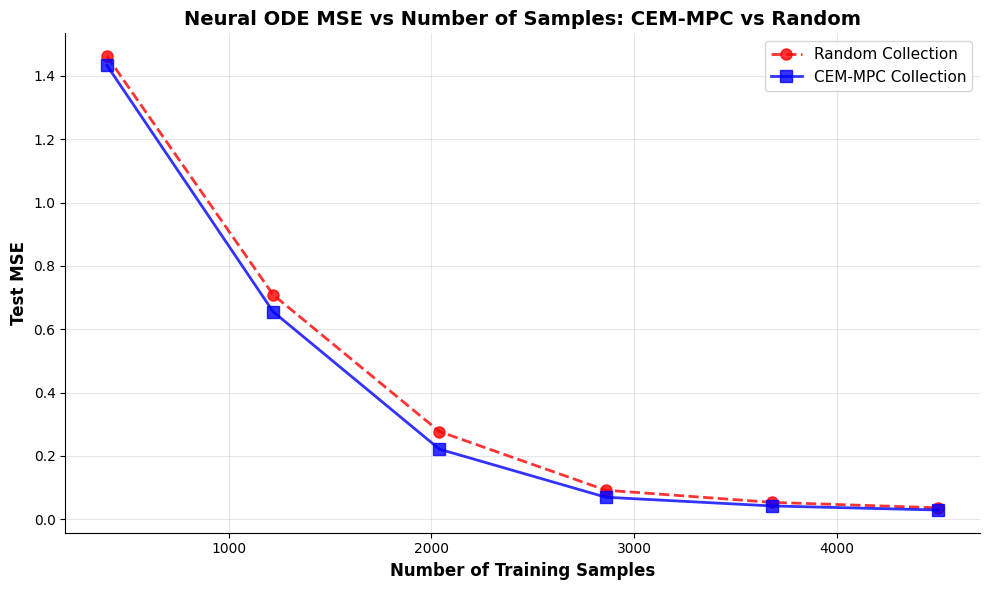


--- Results Summary ---
N=  400 | Random MSE=1.462883 | CEM-MPC MSE=1.433703 | 2.0% better with CEM-MPC
N= 1220 | Random MSE=0.708664 | CEM-MPC MSE=0.655326 | 7.5% better with CEM-MPC
N= 2040 | Random MSE=0.276889 | CEM-MPC MSE=0.221174 | 20.1% better with CEM-MPC
N= 2860 | Random MSE=0.091741 | CEM-MPC MSE=0.069531 | 24.2% better with CEM-MPC
N= 3680 | Random MSE=0.053289 | CEM-MPC MSE=0.041940 | 21.3% better with CEM-MPC
N= 4500 | Random MSE=0.036078 | CEM-MPC MSE=0.029110 | 19.3% better with CEM-MPC

--- Overall Analysis ---
Average improvement with CEM-MPC: 15.7%
Best improvement: 24.2% (at N=2860)


In [108]:
sample_sizes = np.array([400, 1220, 2040, 2860, 3680, 4500])
rand_mses = np.array([1.462883, 0.708664, 0.276889, 0.091741, 0.053289, 0.036078])
mpc_mses = np.array([1.433703, 0.655326, 0.221174, 0.069531, 0.041940, 0.029110])

# Plot without log scale
plt.figure(figsize=(10, 6))
plt.plot(sample_sizes, rand_mses, 'o--', label='Random Collection', 
         color='red', linewidth=2, markersize=8, alpha=0.8)
plt.plot(sample_sizes, mpc_mses, 's-', label='CEM-MPC Collection', 
         color='blue', linewidth=2, markersize=8, alpha=0.8)

plt.xlabel('Number of Training Samples', fontsize=12, fontweight='bold')
plt.ylabel('Test MSE', fontsize=12, fontweight='bold')
plt.title('Neural ODE MSE vs Number of Samples: CEM-MPC vs Random', fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3)
plt.legend(fontsize=11)

# Add some styling
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()

# Save the plot
output_name = "neural_ode_sample_size_comparison"
plt.savefig(f"{output_name}.pdf", dpi=300, bbox_inches='tight', format='pdf')
plt.savefig(f"{output_name}.svg", dpi=300, bbox_inches='tight', format='svg')
plt.savefig(f"{output_name}.png", dpi=300, bbox_inches='tight', format='png')

print(f"✅ Sample size comparison plot saved as:")
print(f"   📄 {output_name}.pdf")
print(f"   🎨 {output_name}.svg") 
print(f"   🖼️  {output_name}.png")

plt.show()

# Print the results table with improvements
print("\n--- Results Summary ---")
for n, r, m in zip(sample_sizes, rand_mses, mpc_mses):
    improvement = ((r - m) / r * 100)
    print(f"N={n:5d} | Random MSE={r:.6f} | CEM-MPC MSE={m:.6f} | {improvement:.1f}% better with CEM-MPC")

# Overall improvement analysis
print(f"\n--- Overall Analysis ---")
print(f"Average improvement with CEM-MPC: {np.mean([(r-m)/r*100 for r,m in zip(rand_mses, mpc_mses)]):.1f}%")
print(f"Best improvement: {max([(r-m)/r*100 for r,m in zip(rand_mses, mpc_mses)]):.1f}% (at N={sample_sizes[np.argmax([(r-m)/r*100 for r,m in zip(rand_mses, mpc_mses)])]})")

✅ Log scale comparison plot saved as:
   📄 neural_ode_cem_mpc_vs_random_comparison.pdf
   🎨 neural_ode_cem_mpc_vs_random_comparison.svg
   🖼️  neural_ode_cem_mpc_vs_random_comparison.png


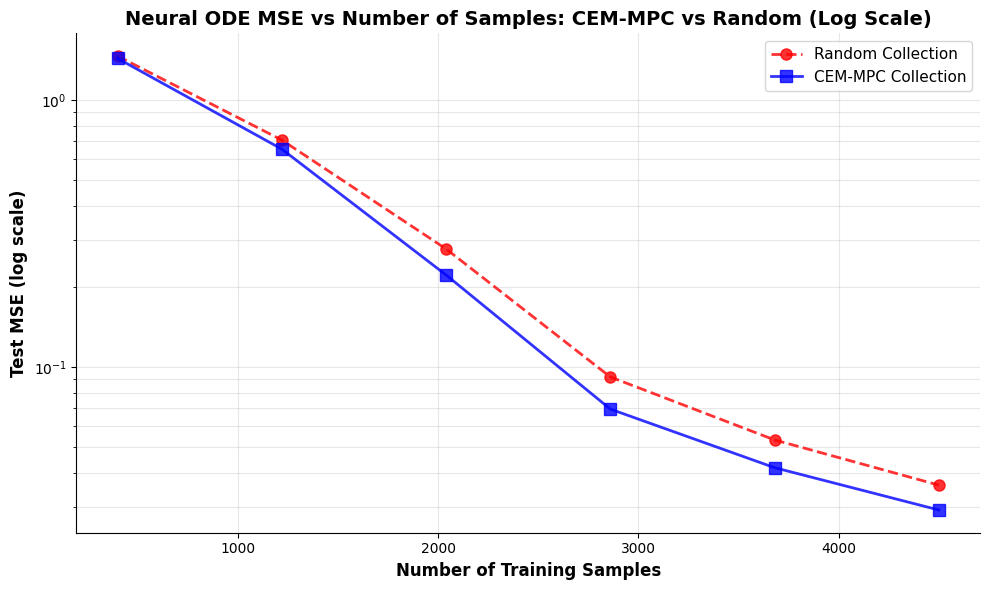


--- Results Summary ---
N=  400 | Random MSE=1.462883 | CEM-MPC MSE=1.433703 | 2.0% better with CEM-MPC
N= 1220 | Random MSE=0.708664 | CEM-MPC MSE=0.655326 | 7.5% better with CEM-MPC
N= 2040 | Random MSE=0.276889 | CEM-MPC MSE=0.221174 | 20.1% better with CEM-MPC
N= 2860 | Random MSE=0.091741 | CEM-MPC MSE=0.069531 | 24.2% better with CEM-MPC
N= 3680 | Random MSE=0.053289 | CEM-MPC MSE=0.041940 | 21.3% better with CEM-MPC
N= 4500 | Random MSE=0.036078 | CEM-MPC MSE=0.029110 | 19.3% better with CEM-MPC

--- Overall Analysis ---
Average improvement with CEM-MPC: 15.7%
Best improvement: 24.2% (at N=2860)


In [114]:
# Data
sample_sizes = np.array([400, 1220, 2040, 2860, 3680, 4500])
rand_mses = np.array([1.462883, 0.708664, 0.276889, 0.091741, 0.053289, 0.036078])
mpc_mses = np.array([1.433703, 0.655326, 0.221174, 0.069531, 0.041940, 0.029110])

# Plot with log scale
plt.figure(figsize=(10, 6))
plt.semilogy(sample_sizes, rand_mses, 'o--', label='Random Collection', 
             color='red', linewidth=2, markersize=8, alpha=0.8)
plt.semilogy(sample_sizes, mpc_mses, 's-', label='CEM-MPC Collection', 
             color='blue', linewidth=2, markersize=8, alpha=0.8)

plt.xlabel('Number of Training Samples', fontsize=12, fontweight='bold')
plt.ylabel('Test MSE (log scale)', fontsize=12, fontweight='bold')
plt.title('Neural ODE MSE vs Number of Samples: CEM-MPC vs Random (Log Scale)', fontsize=14, fontweight='bold')
plt.grid(True, which='both', alpha=0.3)
plt.legend(fontsize=11)

# Add some styling
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()

# Save the plot
output_name = "neural_ode_cem_mpc_vs_random_comparison"
plt.savefig(f"{output_name}.pdf", dpi=300, bbox_inches='tight', format='pdf')
plt.savefig(f"{output_name}.svg", dpi=300, bbox_inches='tight', format='svg')
plt.savefig(f"{output_name}.png", dpi=300, bbox_inches='tight', format='png')

print(f"✅ Log scale comparison plot saved as:")
print(f"   📄 {output_name}.pdf")
print(f"   🎨 {output_name}.svg") 
print(f"   🖼️  {output_name}.png")

plt.show()

# Print the results table with improvements
print("\n--- Results Summary ---")
for n, r, m in zip(sample_sizes, rand_mses, mpc_mses):
    improvement = ((r - m) / r * 100)
    print(f"N={n:5d} | Random MSE={r:.6f} | CEM-MPC MSE={m:.6f} | {improvement:.1f}% better with CEM-MPC")

# Overall improvement analysis
print(f"\n--- Overall Analysis ---")
print(f"Average improvement with CEM-MPC: {np.mean([(r-m)/r*100 for r,m in zip(rand_mses, mpc_mses)]):.1f}%")
print(f"Best improvement: {max([(r-m)/r*100 for r,m in zip(rand_mses, mpc_mses)]):.1f}% (at N={sample_sizes[np.argmax([(r-m)/r*100 for r,m in zip(rand_mses, mpc_mses)])]})")

✅ Improvement percentage bar chart saved as:
   📄 neural_ode_cem_mpc_improvement_percentage.pdf
   🎨 neural_ode_cem_mpc_improvement_percentage.svg
   🖼️  neural_ode_cem_mpc_improvement_percentage.png


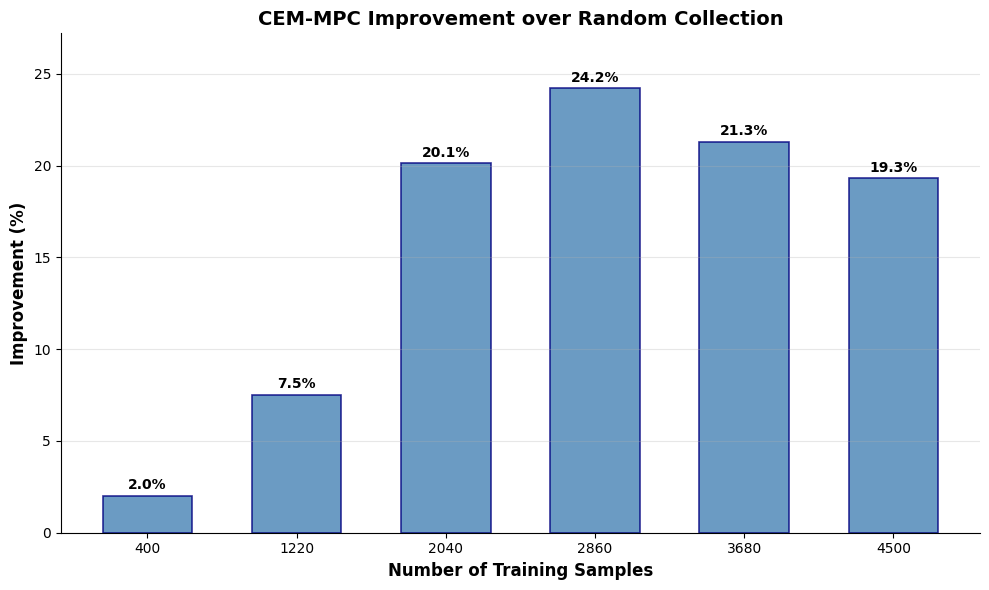


--- Improvement Percentages ---
N=  400 samples: 2.0% improvement with CEM-MPC
N= 1220 samples: 7.5% improvement with CEM-MPC
N= 2040 samples: 20.1% improvement with CEM-MPC
N= 2860 samples: 24.2% improvement with CEM-MPC
N= 3680 samples: 21.3% improvement with CEM-MPC
N= 4500 samples: 19.3% improvement with CEM-MPC

--- Summary Statistics ---
Average improvement: 15.7%
Best improvement: 24.2% (at N=2860 samples)
Lowest improvement: 2.0% (at N=400 samples)


In [116]:
sample_sizes = np.array([400, 1220, 2040, 2860, 3680, 4500])
rand_mses = np.array([1.462883, 0.708664, 0.276889, 0.091741, 0.053289, 0.036078])
mpc_mses = np.array([1.433703, 0.655326, 0.221174, 0.069531, 0.041940, 0.029110])

# Calculate improvement percentages
improvements = [(r - m) / r * 100 for r, m in zip(rand_mses, mpc_mses)]

# Create bar chart using index positions
plt.figure(figsize=(10, 6))
x_pos = np.arange(len(sample_sizes))
bars = plt.bar(x_pos, improvements, color='steelblue', alpha=0.8, edgecolor='navy', linewidth=1.2, width=0.6)

# Customize the plot
plt.xlabel('Number of Training Samples', fontsize=12, fontweight='bold')
plt.ylabel('Improvement (%)', fontsize=12, fontweight='bold')
plt.title('CEM-MPC Improvement over Random Collection', fontsize=14, fontweight='bold')
plt.grid(True, axis='y', alpha=0.3)

# Set x-axis labels to show actual sample sizes
plt.xticks(x_pos, sample_sizes)

# Add value labels on top of each bar
for bar, improvement in zip(bars, improvements):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.2,
             f'{improvement:.1f}%', ha='center', va='bottom', fontweight='bold')

# Style the plot
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.ylim(0, max(improvements) + 3)  # Add some space at the top
plt.tight_layout()

# Save the plot
output_name = "neural_ode_cem_mpc_improvement_percentage"
plt.savefig(f"{output_name}.pdf", dpi=300, bbox_inches='tight', format='pdf')
plt.savefig(f"{output_name}.svg", dpi=300, bbox_inches='tight', format='svg')
plt.savefig(f"{output_name}.png", dpi=300, bbox_inches='tight', format='png')

print(f"✅ Improvement percentage bar chart saved as:")
print(f"   📄 {output_name}.pdf")
print(f"   🎨 {output_name}.svg") 
print(f"   🖼️  {output_name}.png")

plt.show()

# Print the improvement values
print("\n--- Improvement Percentages ---")
for n, improvement in zip(sample_sizes, improvements):
    print(f"N={n:5d} samples: {improvement:.1f}% improvement with CEM-MPC")

print(f"\n--- Summary Statistics ---")
print(f"Average improvement: {np.mean(improvements):.1f}%")
print(f"Best improvement: {max(improvements):.1f}% (at N={sample_sizes[np.argmax(improvements)]} samples)")
print(f"Lowest improvement: {min(improvements):.1f}% (at N={sample_sizes[np.argmin(improvements)]} samples)")

✅ Combined 1x2 plot saved as:
   📄 neural_ode_cem_mpc_vs_random_combined.pdf
   🎨 neural_ode_cem_mpc_vs_random_combined.svg
   🖼️  neural_ode_cem_mpc_vs_random_combined.png


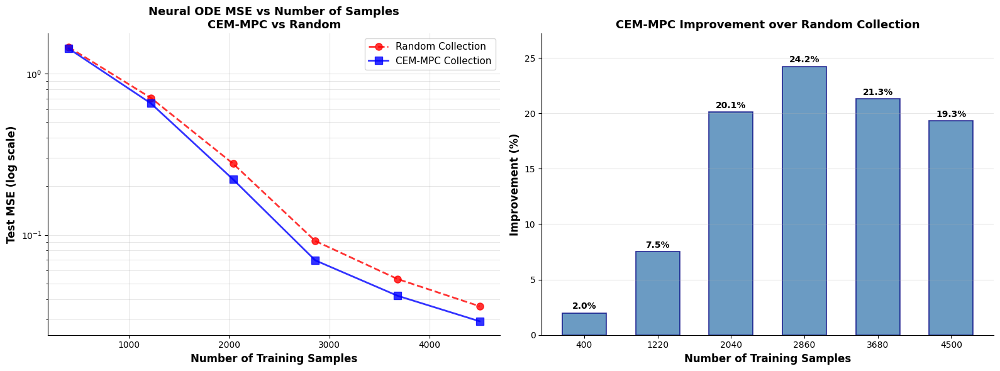

In [118]:
# Data
sample_sizes = np.array([400, 1220, 2040, 2860, 3680, 4500])
rand_mses = np.array([1.462883, 0.708664, 0.276889, 0.091741, 0.053289, 0.036078])
mpc_mses = np.array([1.433703, 0.655326, 0.221174, 0.069531, 0.041940, 0.029110])
improvements = [(r - m) / r * 100 for r, m in zip(rand_mses, mpc_mses)]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Left: Log-scale MSE plot
ax1.semilogy(sample_sizes, rand_mses, 'o--', label='Random Collection', 
             color='red', linewidth=2, markersize=8, alpha=0.8)
ax1.semilogy(sample_sizes, mpc_mses, 's-', label='CEM-MPC Collection', 
             color='blue', linewidth=2, markersize=8, alpha=0.8)
ax1.set_xlabel('Number of Training Samples', fontsize=12, fontweight='bold')
ax1.set_ylabel('Test MSE (log scale)', fontsize=12, fontweight='bold')
ax1.set_title('Neural ODE MSE vs Number of Samples\nCEM-MPC vs Random', fontsize=13, fontweight='bold')
ax1.grid(True, which='both', alpha=0.3)
ax1.legend(fontsize=11)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Right: Improvement percentage bar chart
x_pos = np.arange(len(sample_sizes))
bars = ax2.bar(x_pos, improvements, color='steelblue', alpha=0.8, edgecolor='navy', linewidth=1.2, width=0.6)
ax2.set_xlabel('Number of Training Samples', fontsize=12, fontweight='bold')
ax2.set_ylabel('Improvement (%)', fontsize=12, fontweight='bold')
ax2.set_title('CEM-MPC Improvement over Random Collection', fontsize=13, fontweight='bold')
ax2.grid(True, axis='y', alpha=0.3)
ax2.set_xticks(x_pos)
ax2.set_xticklabels(sample_sizes)
for bar, improvement in zip(bars, improvements):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height + 0.2,
             f'{improvement:.1f}%', ha='center', va='bottom', fontweight='bold')
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.set_ylim(0, max(improvements) + 3)

plt.tight_layout()

# Save the combined figure
output_name = "neural_ode_cem_mpc_vs_random_combined"
plt.savefig(f"{output_name}.pdf", dpi=300, bbox_inches='tight', format='pdf')
plt.savefig(f"{output_name}.svg", dpi=300, bbox_inches='tight', format='svg')
plt.savefig(f"{output_name}.png", dpi=300, bbox_inches='tight', format='png')

print(f"✅ Combined 1x2 plot saved as:")
print(f"   📄 {output_name}.pdf")
print(f"   🎨 {output_name}.svg") 
print(f"   🖼️  {output_name}.png")

plt.show()

Loaded MPC dataset from data/mpc_dataset_final3.npz
MPC dataset size: 4500 (state_dim=16, action_dim=1)
Random dataset size: 4500

[1/2] Training single model on MPC data...
Training on 4500 samples for 180 steps (10 epochs)...
Step 100/180, Loss: 0.011514
Training complete.

[2/2] Training single model on Random data...
Training on 4500 samples for 180 steps (10 epochs)...
Step 100/180, Loss: 0.010932
Training complete.

--- Generating Unseen Test Trajectory ---

--- Evaluating Models ---

--- Performance Comparison on Unseen Trajectory ---
Metric     | MPC-Trained Model | Random-Trained Model
-----------|-------------------|--------------------
Test MSE   | 0.002500          | 0.003012          
Improvement| 16.98% better with MPC

--- Plotting Trajectory Predictions ---


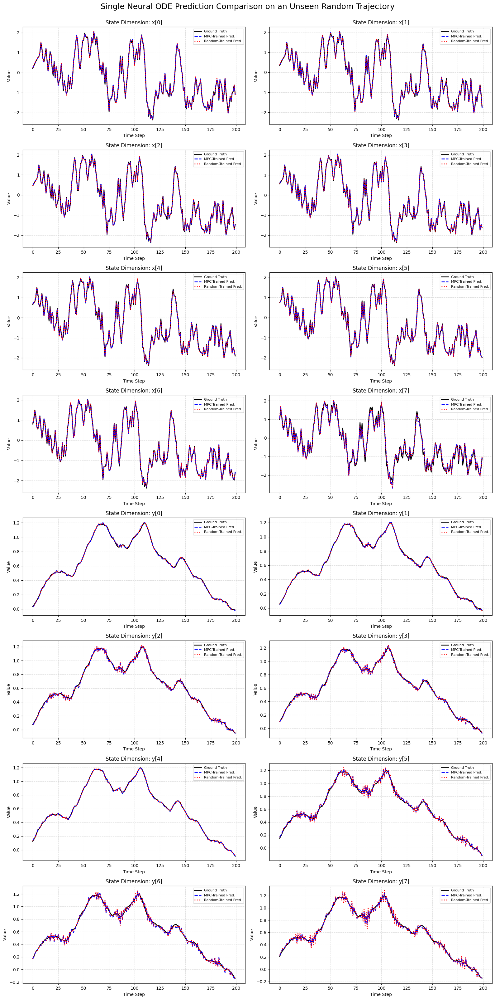


--- Per-Dimension MSE Analysis ---
Dimension | MPC MSE      | Random MSE   | Improvement
----------|--------------|--------------|------------
x[0]      | 0.00189694 | 0.00357404 | 46.92%
x[1]      | 0.00218102 | 0.00363743 | 40.04%
x[2]      | 0.00191779 | 0.00277906 | 30.99%
x[3]      | 0.00201838 | 0.00238035 | 15.21%
x[4]      | 0.00223017 | 0.00266897 | 16.44%
x[5]      | 0.00163812 | 0.00178163 | 8.06%
x[6]      | 0.00174981 | 0.00197974 | 11.61%
x[7]      | 0.02179804 | 0.02209639 | 1.35%
y[0]      | 0.00007315 | 0.00005707 | -28.16%
y[1]      | 0.00009413 | 0.00007565 | -24.43%
y[2]      | 0.00038196 | 0.00046359 | 17.61%
y[3]      | 0.00053918 | 0.00065341 | 17.48%
y[4]      | 0.00004754 | 0.00006941 | 31.51%
y[5]      | 0.00096436 | 0.00154435 | 37.56%
y[6]      | 0.00123235 | 0.00146894 | 16.11%
y[7]      | 0.00124017 | 0.00295608 | 58.05%


In [ ]:
import os, math
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import gym_oscillator.envs.osc_env as osc_env
from torchdiffeq import odeint

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(1234); np.random.seed(1234)

# 0) Setup and dims
env_eval = osc_env.oscillatorEnv(len_state=8)
state_dim  = int(np.prod(env_eval.observation_space.shape))   # 16 for (2,8)
action_dim = int(np.prod(env_eval.action_space.shape))        # likely 1
dt_eval = 1.0

# 1) Load MPC dataset (prefer NPZ saved on disk)
def load_mpc_dataset():
    candidate_paths = [
        "data/mpc_dataset_final3.npz",
        # "data/mpc_dataset_final2.npz",
        # "data/mpc_dataset_final.npz"
    ]
    for p in candidate_paths:
        if os.path.exists(p):
            d = np.load(p)
            print(f"Loaded MPC dataset from {p}")
            return (d["states"].astype(np.float32).reshape(-1, state_dim),
                    d["actions"].astype(np.float32).reshape(-1, action_dim),
                    d["next_states"].astype(np.float32).reshape(-1, state_dim))
    # Fallbacks (if you didn't save to disk in this session)
    if 'replay_buffer' in globals() and hasattr(replay_buffer, 'get_all_data') and len(replay_buffer) > 0:
        s,a,y = replay_buffer.get_all_data()
        return (np.asarray(s, dtype=np.float32).reshape(-1, state_dim),
                np.asarray(a, dtype=np.float32).reshape(-1, action_dim),
                np.asarray(y, dtype=np.float32).reshape(-1, state_dim))
    if 'states' in globals() and len(states) > 0:
        return (np.asarray(states, dtype=np.float32).reshape(-1, state_dim),
                np.asarray(actions, dtype=np.float32).reshape(-1, action_dim),
                np.asarray(next_states, dtype=np.float32).reshape(-1, state_dim))
    raise RuntimeError("No MPC dataset found. Save to NPZ or keep replay_buffer in memory before running this cell.")

mpc_states_np, mpc_actions_np, mpc_next_states_np = load_mpc_dataset()
N_max = len(mpc_states_np)
print(f"MPC dataset size: {N_max} (state_dim={state_dim}, action_dim={action_dim})")

# Optional: shuffle once to avoid ordering bias
rng = np.random.RandomState(1234)
perm_mpc = rng.permutation(N_max)
mpc_states_np      = mpc_states_np[perm_mpc]
mpc_actions_np     = mpc_actions_np[perm_mpc]
mpc_next_states_np = mpc_next_states_np[perm_mpc]

# 2) Build a random baseline dataset of equal size
rand_env = osc_env.oscillatorEnv(len_state=8)
r = rand_env.reset()
obs = r[0] if isinstance(r, tuple) else r
rand_states, rand_actions, rand_next_states = [], [], []
while len(rand_states) < N_max:
    a = rand_env.action_space.sample()
    rand_states.append(obs)
    rand_actions.append(a)
    step_out = rand_env.step(a)
    if len(step_out) == 5:
        obs_next, _, terminated, truncated, _ = step_out
        done = bool(terminated or truncated)
    else:
        obs_next, _, done, _ = step_out
    rand_next_states.append(obs_next)
    obs = obs_next
    
    # Reset if done
    if done:
        r = rand_env.reset()
        obs = r[0] if isinstance(r, tuple) else r

rand_states_np      = np.asarray(rand_states, dtype=np.float32).reshape(-1, state_dim)
rand_actions_np     = np.asarray(rand_actions, dtype=np.float32).reshape(-1, action_dim)
rand_next_states_np = np.asarray(rand_next_states, dtype=np.float32).reshape(-1, state_dim)

# Shuffle random baseline similarly
perm_rand = rng.permutation(len(rand_states_np))
rand_states_np      = rand_states_np[perm_rand]
rand_actions_np     = rand_actions_np[perm_rand]
rand_next_states_np = rand_next_states_np[perm_rand]

print(f"Random dataset size: {len(rand_states_np)}")

# Neural ODE definition (same as your original code)
class MLP(nn.Module):
    def __init__(self, in_dim, out_dim, hidden=[64, 64, 64], act=nn.Tanh):
        super().__init__()
        layers, d = [], in_dim
        for h in hidden:
            layers += [nn.Linear(d, h), act()]
            d = h
        layers.append(nn.Linear(d, out_dim))
        self.net = nn.Sequential(*layers)
    def forward(self, x): return self.net(x)

class ODEFunc(nn.Module):
    def __init__(self, state_dim, action_dim, hidden=64):
        super().__init__()
        self.f = MLP(state_dim + action_dim, state_dim, hidden=[hidden]*3, act=nn.Tanh)
    def forward(self, t, x, u):
        xu = torch.cat([x, u], dim=-1)
        return self.f(xu)

class ODEBlock(nn.Module):
    def __init__(self, func: ODEFunc, step_size=0.5):
        super().__init__()
        self.func = func
        self.step_size = step_size
    def forward(self, x0, u, t):
        dyn = lambda tt, x: self.func(tt, x, u)
        x_traj = odeint(dyn, x0, t, method='rk4', options=dict(step_size=self.step_size))
        return x_traj[-1]

class NeuralODE(nn.Module):
    def __init__(self, state_dim, action_dim, hidden=64, ode_step=0.5):
        super().__init__()
        self.func = ODEFunc(state_dim, action_dim, hidden)
        self.ode  = ODEBlock(self.func, step_size=ode_step)
    def forward(self, x, u, t):
        mu_hat = self.ode(x, u, t)
        return mu_hat

# Training function for a single Neural ODE (matching your ensemble training approach)
def train_single_ode(X_np, U_np, Y_np, epochs=10, batch_size=256, lr=1e-3):
    """Trains and returns a single NeuralODE model using similar approach as ensemble training."""
    torch.manual_seed(1234)
    np.random.seed(1234)
    
    model = NeuralODE(state_dim, action_dim, hidden=64).to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    
    X = torch.from_numpy(X_np).to(device)
    U = torch.from_numpy(U_np).to(device) 
    Y = torch.from_numpy(Y_np).to(device)
    
    num_samples = X.shape[0]
    # Calculate steps similar to your ensemble version
    steps = max(1, epochs * math.ceil(num_samples / batch_size))
    t = torch.tensor([0.0, dt_eval], dtype=torch.float32, device=device)
    
    print(f"Training on {num_samples} samples for {steps} steps ({epochs} epochs)...")
    
    model.train()
    for step in range(steps):
        # Sample batch similar to your ensemble training
        bsz = min(batch_size, X.shape[0])
        idx = torch.randint(0, X.shape[0], (bsz,), device=X.device)
        xb, ub, yb = X[idx], U[idx], Y[idx]
        
        mu_hat = model(xb, ub, t)
        loss = nn.MSELoss()(mu_hat, yb)
        
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)  # Same clipping as ensemble
        optimizer.step()
        
        if (step + 1) % 100 == 0:
            print(f"Step {step+1}/{steps}, Loss: {loss.item():.6f}")

    print("Training complete.")
    model.eval()
    return model

# Train one model on MPC data and another on Random data
print("\n[1/2] Training single model on MPC data...")
model_mpc = train_single_ode(mpc_states_np, mpc_actions_np, mpc_next_states_np, epochs=10)

print("\n[2/2] Training single model on Random data...")
model_rand = train_single_ode(rand_states_np, rand_actions_np, rand_next_states_np, epochs=10)

# Generate a new, unseen test trajectory
print("\n--- Generating Unseen Test Trajectory ---")
test_env = osc_env.oscillatorEnv(len_state=8)
num_test_samples = 2000
test_s, test_a, test_ns = [], [], []

reset_out = test_env.reset()
obs = reset_out[0] if isinstance(reset_out, tuple) else reset_out

for _ in range(num_test_samples):
    action = test_env.action_space.sample()
    test_s.append(obs)
    test_a.append(action)

    step_out = test_env.step(action)
    if len(step_out) == 5:  # New API: obs, reward, terminated, truncated, info
        next_obs, _, terminated, truncated, _ = step_out
        done = terminated or truncated
    else:  # Old API: obs, reward, done, info
        next_obs, _, done, _ = step_out
    
    test_ns.append(next_obs)
    obs = next_obs
    
    # Reset environment if the episode is done
    if done:
        reset_out = test_env.reset()
        obs = reset_out[0] if isinstance(reset_out, tuple) else reset_out

# Prepare test data
test_states_np = np.array(test_s, dtype=np.float32).reshape(num_test_samples, -1)
test_actions_np = np.array(test_a, dtype=np.float32).reshape(num_test_samples, -1)
test_next_states_np = np.array(test_ns, dtype=np.float32).reshape(num_test_samples, -1)

torch_test_s = torch.from_numpy(test_states_np).to(device)
torch_test_a = torch.from_numpy(test_actions_np).to(device)
t_eval = torch.tensor([0.0, dt_eval], dtype=torch.float32, device=device)

# Evaluate both models on the test trajectory
@torch.no_grad()
def evaluate_single_model(model, states_tensor, actions_tensor, next_states_true_np):
    model.eval()
    pred_mean = model(states_tensor, actions_tensor, t_eval)
    pred_np = pred_mean.cpu().numpy()
    mse = np.mean((pred_np - next_states_true_np)**2)
    return pred_np, mse

print("\n--- Evaluating Models ---")
pred_mpc, mse_mpc = evaluate_single_model(model_mpc, torch_test_s, torch_test_a, test_next_states_np)
pred_rand, mse_rand = evaluate_single_model(model_rand, torch_test_s, torch_test_a, test_next_states_np)

print("\n--- Performance Comparison on Unseen Trajectory ---")
print(f"Metric     | MPC-Trained Model | Random-Trained Model")
print(f"-----------|-------------------|--------------------")
print(f"Test MSE   | {mse_mpc:<17.6f} | {mse_rand:<18.6f}")
print(f"Improvement| {((mse_rand - mse_mpc) / mse_rand * 100):.2f}% better with MPC")

# Visualization: Plotting predictions from both models against the truth
print("\n--- Plotting Trajectory Predictions ---")
plt.figure(figsize=(16, 32))
samples_to_plot = slice(0, 200)

for i in range(state_dim):
    plt.subplot(8, 2, i + 1)
    
    plt.plot(test_next_states_np[samples_to_plot, i], label='Ground Truth', color='k', linewidth=2)
    plt.plot(pred_mpc[samples_to_plot, i], label='MPC-Trained Pred.', color='blue', linestyle='--', linewidth=2)
    plt.plot(pred_rand[samples_to_plot, i], label='Random-Trained Pred.', color='red', linestyle=':', linewidth=2)
    
    dim_type = 'x' if i < 8 else 'y'
    dim_idx = i if i < 8 else i - 8
    plt.title(f'State Dimension: {dim_type}[{dim_idx}]')
    plt.xlabel('Time Step')
    plt.ylabel('Value')
    plt.legend(fontsize=8)
    plt.grid(True, which='both', linestyle='--', alpha=0.4)

plt.suptitle('Single Neural ODE Prediction Comparison on an Unseen Random Trajectory', fontsize=18, y=1.0)
plt.tight_layout()
plt.show()

# Additional comparison: compute MSE per state dimension
print("\n--- Per-Dimension MSE Analysis ---")
mse_per_dim_mpc = np.mean((pred_mpc - test_next_states_np)**2, axis=0)
mse_per_dim_rand = np.mean((pred_rand - test_next_states_np)**2, axis=0)

print(f"Dimension | MPC MSE      | Random MSE   | Improvement")
print(f"----------|--------------|--------------|------------")
for i in range(state_dim):
    improvement = (mse_per_dim_rand[i] - mse_per_dim_mpc[i]) / mse_per_dim_rand[i] * 100
    dim_type = 'x' if i < 8 else 'y'
    dim_idx = i if i < 8 else i - 8
    print(f"{dim_type}[{dim_idx}]      | {mse_per_dim_mpc[i]:.8f} | {mse_per_dim_rand[i]:.8f} | {improvement:.2f}%")

In [99]:
pip install seaborn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 5.5 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.



--- Plotting Trajectory Predictions ---
✅ Plots saved as:
   📄 neural_ode_cem_mpc_vs_random_comparison.pdf (vector, best for papers)
   🎨 neural_ode_cem_mpc_vs_random_comparison.svg (vector, editable)
   🖼️  neural_ode_cem_mpc_vs_random_comparison.png (high-res raster)


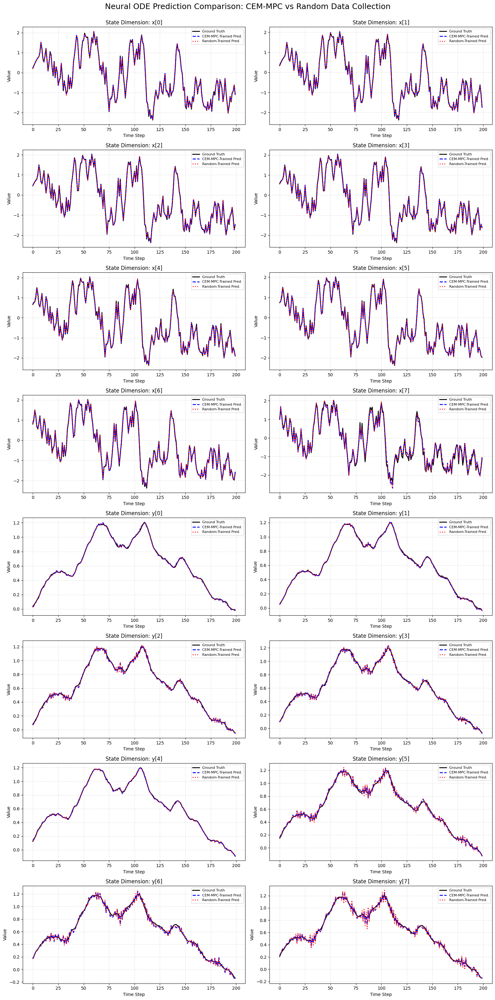


✅ Summary plots saved as:
   📄 neural_ode_cem_mpc_performance_summary.pdf
   🎨 neural_ode_cem_mpc_performance_summary.svg
   🖼️  neural_ode_cem_mpc_performance_summary.png


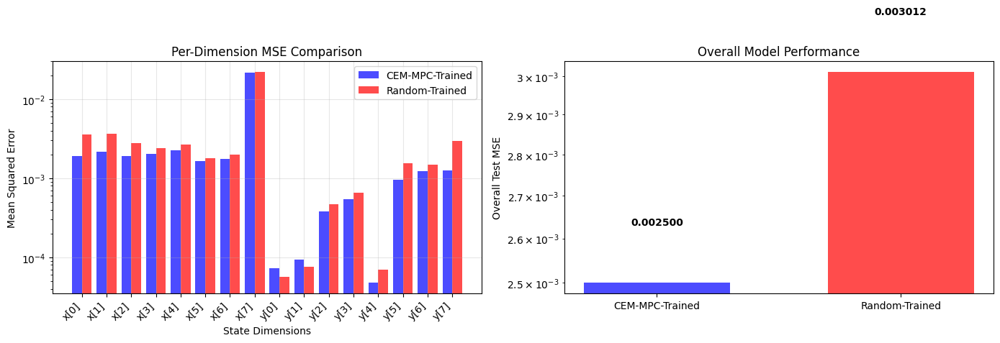

In [101]:
print("\n--- Plotting Trajectory Predictions ---")
plt.figure(figsize=(16, 32))
samples_to_plot = slice(0, 200)

for i in range(state_dim):
    plt.subplot(8, 2, i + 1)
    
    plt.plot(test_next_states_np[samples_to_plot, i], label='Ground Truth', color='k', linewidth=2)
    plt.plot(pred_mpc[samples_to_plot, i], label='CEM-MPC-Trained Pred.', color='blue', linestyle='--', linewidth=2)
    plt.plot(pred_rand[samples_to_plot, i], label='Random-Trained Pred.', color='red', linestyle=':', linewidth=2)
    
    dim_type = 'x' if i < 8 else 'y'
    dim_idx = i if i < 8 else i - 8
    plt.title(f'State Dimension: {dim_type}[{dim_idx}]')
    plt.xlabel('Time Step')
    plt.ylabel('Value')
    plt.legend(fontsize=8)
    plt.grid(True, which='both', linestyle='--', alpha=0.4)

plt.suptitle('Neural ODE Prediction Comparison: CEM-MPC vs Random Data Collection', fontsize=18, y=1.0)
plt.tight_layout()

# Save in multiple formats for publication
output_name = "neural_ode_cem_mpc_vs_random_comparison"

# Save as PDF (vector format, best for papers)
plt.savefig(f"{output_name}.pdf", dpi=300, bbox_inches='tight', 
            facecolor='white', edgecolor='none', format='pdf')

# Save as SVG (vector format, editable)
plt.savefig(f"{output_name}.svg", dpi=300, bbox_inches='tight', 
            facecolor='white', edgecolor='none', format='svg')

# Save as high-resolution PNG (for presentations)
plt.savefig(f"{output_name}.png", dpi=300, bbox_inches='tight', 
            facecolor='white', edgecolor='none', format='png')

print(f"✅ Plots saved as:")
print(f"   📄 {output_name}.pdf (vector, best for papers)")
print(f"   🎨 {output_name}.svg (vector, editable)")
print(f"   🖼️  {output_name}.png (high-res raster)")

plt.show()

# Optional: Create a clean summary comparison plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Per-dimension MSE comparison
dimensions = [f'{("x" if i < 8 else "y")}[{i if i < 8 else i-8}]' for i in range(state_dim)]
x_pos = np.arange(len(dimensions))

ax1.bar(x_pos - 0.2, mse_per_dim_mpc, 0.4, label='CEM-MPC-Trained', 
        color='blue', alpha=0.7)
ax1.bar(x_pos + 0.2, mse_per_dim_rand, 0.4, label='Random-Trained', 
        color='red', alpha=0.7)

ax1.set_xlabel('State Dimensions')
ax1.set_ylabel('Mean Squared Error')
ax1.set_title('Per-Dimension MSE Comparison')
ax1.set_xticks(x_pos)
ax1.set_xticklabels(dimensions, rotation=45, ha='right')
ax1.legend()
ax1.grid(True, alpha=0.3)
ax1.set_yscale('log')

# Overall MSE comparison
models = ['CEM-MPC-Trained', 'Random-Trained']
mse_values = [mse_mpc, mse_rand]
bars = ax2.bar(models, mse_values, color=['blue', 'red'], alpha=0.7, width=0.6)

# Add value labels on bars
for bar, value in zip(bars, mse_values):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() * 1.05,
             f'{value:.6f}', ha='center', va='bottom', fontweight='bold')

ax2.set_ylabel('Overall Test MSE')
ax2.set_title('Overall Model Performance')
ax2.grid(True, alpha=0.3, axis='y')
ax2.set_yscale('log')

plt.tight_layout()

# Save the summary plot
summary_name = "neural_ode_cem_mpc_performance_summary"
plt.savefig(f"{summary_name}.pdf", dpi=300, bbox_inches='tight', format='pdf')
plt.savefig(f"{summary_name}.svg", dpi=300, bbox_inches='tight', format='svg')
plt.savefig(f"{summary_name}.png", dpi=300, bbox_inches='tight', format='png')

print(f"\n✅ Summary plots saved as:")
print(f"   📄 {summary_name}.pdf")
print(f"   🎨 {summary_name}.svg") 
print(f"   🖼️  {summary_name}.png")

plt.show()


[1/2] Training ensemble model on CEM-MPC data...

[2/2] Training ensemble model on Random data...

--- Evaluating Ensemble Models ---

--- Performance Comparison on Unseen Trajectory ---
Metric     | CEM-MPC-Trained Model | Random-Trained Model
-----------|----------------------|--------------------
Test MSE   | 0.002046             | 0.002640          
Improvement| 22.49% better with CEM-MPC

--- Plotting Trajectory Predictions with Uncertainty ---
✅ Plots with uncertainty saved as:
   📄 neural_ode_cem_mpc_vs_random_with_uncertainty.pdf (vector, best for papers)
   🎨 neural_ode_cem_mpc_vs_random_with_uncertainty.svg (vector, editable)
   🖼️  neural_ode_cem_mpc_vs_random_with_uncertainty.png (high-res raster)


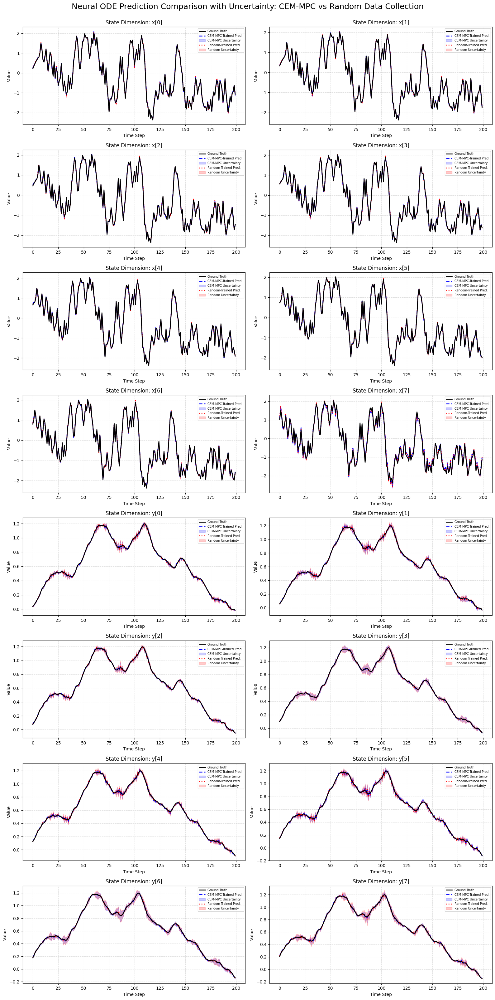


--- Uncertainty Analysis ---
Average Uncertainty (Standard Deviation):
CEM-MPC Model:  0.019481
Random Model:   0.020982
Uncertainty Reduction: 7.15%

Per-Dimension Uncertainty Analysis:
Dimension | CEM-MPC Std  | Random Std   | Reduction
----------|--------------|--------------|----------
x[0]      | 0.01938453 | 0.02045174 | 5.22%
x[1]      | 0.01958488 | 0.01974195 | 0.80%
x[2]      | 0.01899107 | 0.02080647 | 8.73%
x[3]      | 0.01863746 | 0.01941377 | 4.00%
x[4]      | 0.02048397 | 0.02250186 | 8.97%
x[5]      | 0.01993941 | 0.02044650 | 2.48%
x[6]      | 0.01946756 | 0.01882955 | -3.39%
x[7]      | 0.02820319 | 0.02449345 | -15.15%
y[0]      | 0.01425415 | 0.01645491 | 13.37%
y[1]      | 0.01799829 | 0.01934422 | 6.96%
y[2]      | 0.01373560 | 0.01539186 | 10.76%
y[3]      | 0.02133982 | 0.02364972 | 9.77%
y[4]      | 0.01427763 | 0.01871603 | 23.71%
y[5]      | 0.02026122 | 0.02172534 | 6.74%
y[6]      | 0.02473444 | 0.02745205 | 9.90%
y[7]      | 0.02039867 | 0.02628646 | 22.4

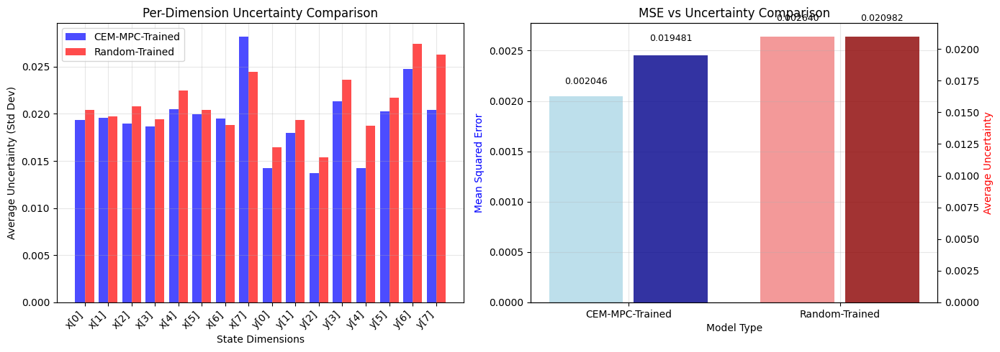

In [102]:
from torchdiffeq import odeint
import torch.nn.functional as F

# First, let's create ensemble models to get uncertainty estimates
def train_ensemble_ode(X_np, U_np, Y_np, ensemble_size=5, epochs=10, batch_size=256, lr=1e-3):
    """Trains and returns an ensemble of NeuralODE models for uncertainty estimation."""
    torch.manual_seed(1234)
    np.random.seed(1234)
    
    ensemble = []
    for i in range(ensemble_size):
        # Different seed for each ensemble member
        torch.manual_seed(1234 + i)
        model = NeuralODE(state_dim, action_dim, hidden=64).to(device)
        optimizer = optim.Adam(model.parameters(), lr=lr)
        
        X = torch.from_numpy(X_np).to(device)
        U = torch.from_numpy(U_np).to(device) 
        Y = torch.from_numpy(Y_np).to(device)
        
        num_samples = X.shape[0]
        steps = max(1, epochs * math.ceil(num_samples / batch_size))
        t = torch.tensor([0.0, dt_eval], dtype=torch.float32, device=device)
        
        model.train()
        for step in range(steps):
            bsz = min(batch_size, X.shape[0])
            idx = torch.randint(0, X.shape[0], (bsz,), device=X.device)
            xb, ub, yb = X[idx], U[idx], Y[idx]
            
            mu_hat = model(xb, ub, t)
            loss = nn.MSELoss()(mu_hat, yb)
            
            optimizer.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
        
        model.eval()
        ensemble.append(model)
    
    return ensemble

@torch.no_grad()
def evaluate_ensemble_model(ensemble, states_tensor, actions_tensor, next_states_true_np):
    """Evaluate ensemble and return predictions with uncertainty."""
    predictions = []
    t_eval = torch.tensor([0.0, dt_eval], dtype=torch.float32, device=device)
    
    for model in ensemble:
        model.eval()
        pred = model(states_tensor, actions_tensor, t_eval)
        predictions.append(pred.cpu().numpy())
    
    predictions = np.stack(predictions, axis=0)  # [ensemble_size, num_samples, state_dim]
    
    pred_mean = np.mean(predictions, axis=0)
    pred_std = np.std(predictions, axis=0)  # Epistemic uncertainty
    mse = np.mean((pred_mean - next_states_true_np)**2)
    
    return pred_mean, pred_std, mse

# Train ensemble models
print("\n[1/2] Training ensemble model on CEM-MPC data...")
ensemble_mpc = train_ensemble_ode(mpc_states_np, mpc_actions_np, mpc_next_states_np, ensemble_size=5, epochs=10)

print("\n[2/2] Training ensemble model on Random data...")
ensemble_rand = train_ensemble_ode(rand_states_np, rand_actions_np, rand_next_states_np, ensemble_size=5, epochs=10)

print("\n--- Evaluating Ensemble Models ---")
pred_mpc, std_mpc, mse_mpc = evaluate_ensemble_model(ensemble_mpc, torch_test_s, torch_test_a, test_next_states_np)
pred_rand, std_rand, mse_rand = evaluate_ensemble_model(ensemble_rand, torch_test_s, torch_test_a, test_next_states_np)

print("\n--- Performance Comparison on Unseen Trajectory ---")
print(f"Metric     | CEM-MPC-Trained Model | Random-Trained Model")
print(f"-----------|----------------------|--------------------")
print(f"Test MSE   | {mse_mpc:<20.6f} | {mse_rand:<18.6f}")
print(f"Improvement| {((mse_rand - mse_mpc) / mse_rand * 100):.2f}% better with CEM-MPC")

# Visualization with Uncertainty
print("\n--- Plotting Trajectory Predictions with Uncertainty ---")
plt.figure(figsize=(16, 32))
samples_to_plot = slice(0, 200)
time_steps = np.arange(200)

for i in range(state_dim):
    plt.subplot(8, 2, i + 1)
    
    # Ground truth
    plt.plot(test_next_states_np[samples_to_plot, i], label='Ground Truth', color='k', linewidth=2, zorder=3)
    
    # CEM-MPC predictions with uncertainty
    plt.plot(pred_mpc[samples_to_plot, i], label='CEM-MPC-Trained Pred.', color='blue', linestyle='--', linewidth=2, zorder=2)
    plt.fill_between(time_steps, 
                    pred_mpc[samples_to_plot, i] - std_mpc[samples_to_plot, i], 
                    pred_mpc[samples_to_plot, i] + std_mpc[samples_to_plot, i],
                    color='blue', alpha=0.2, label='CEM-MPC Uncertainty', zorder=1)
    
    # Random predictions with uncertainty
    plt.plot(pred_rand[samples_to_plot, i], label='Random-Trained Pred.', color='red', linestyle=':', linewidth=2, zorder=2)
    plt.fill_between(time_steps, 
                    pred_rand[samples_to_plot, i] - std_rand[samples_to_plot, i], 
                    pred_rand[samples_to_plot, i] + std_rand[samples_to_plot, i],
                    color='red', alpha=0.2, label='Random Uncertainty', zorder=1)
    
    dim_type = 'x' if i < 8 else 'y'
    dim_idx = i if i < 8 else i - 8
    plt.title(f'State Dimension: {dim_type}[{dim_idx}]')
    plt.xlabel('Time Step')
    plt.ylabel('Value')
    plt.legend(fontsize=7)  # Smaller font due to more legend entries
    plt.grid(True, which='both', linestyle='--', alpha=0.4)

plt.suptitle('Neural ODE Prediction Comparison with Uncertainty: CEM-MPC vs Random Data Collection', fontsize=18, y=1.0)
plt.tight_layout()

# Save in multiple formats for publication
output_name = "neural_ode_cem_mpc_vs_random_with_uncertainty"

# Save as PDF (vector format, best for papers)
plt.savefig(f"{output_name}.pdf", dpi=300, bbox_inches='tight', 
            facecolor='white', edgecolor='none', format='pdf')

# Save as SVG (vector format, editable)
plt.savefig(f"{output_name}.svg", dpi=300, bbox_inches='tight', 
            facecolor='white', edgecolor='none', format='svg')

# Save as high-resolution PNG (for presentations)
plt.savefig(f"{output_name}.png", dpi=300, bbox_inches='tight', 
            facecolor='white', edgecolor='none', format='png')

print(f"✅ Plots with uncertainty saved as:")
print(f"   📄 {output_name}.pdf (vector, best for papers)")
print(f"   🎨 {output_name}.svg (vector, editable)")
print(f"   🖼️  {output_name}.png (high-res raster)")

plt.show()

# Additional analysis: Average uncertainty comparison
print("\n--- Uncertainty Analysis ---")
avg_std_mpc = np.mean(std_mpc, axis=0)
avg_std_rand = np.mean(std_rand, axis=0)
overall_avg_std_mpc = np.mean(avg_std_mpc)
overall_avg_std_rand = np.mean(avg_std_rand)

print(f"Average Uncertainty (Standard Deviation):")
print(f"CEM-MPC Model:  {overall_avg_std_mpc:.6f}")
print(f"Random Model:   {overall_avg_std_rand:.6f}")
print(f"Uncertainty Reduction: {((overall_avg_std_rand - overall_avg_std_mpc) / overall_avg_std_rand * 100):.2f}%")

# Per-dimension uncertainty analysis
print(f"\nPer-Dimension Uncertainty Analysis:")
print(f"Dimension | CEM-MPC Std  | Random Std   | Reduction")
print(f"----------|--------------|--------------|----------")
for i in range(state_dim):
    reduction = (avg_std_rand[i] - avg_std_mpc[i]) / avg_std_rand[i] * 100
    dim_type = 'x' if i < 8 else 'y'
    dim_idx = i if i < 8 else i - 8
    print(f"{dim_type}[{dim_idx}]      | {avg_std_mpc[i]:.8f} | {avg_std_rand[i]:.8f} | {reduction:.2f}%")

# Create uncertainty comparison plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Per-dimension uncertainty comparison
dimensions = [f'{("x" if i < 8 else "y")}[{i if i < 8 else i-8}]' for i in range(state_dim)]
x_pos = np.arange(len(dimensions))

ax1.bar(x_pos - 0.2, avg_std_mpc, 0.4, label='CEM-MPC-Trained', 
        color='blue', alpha=0.7)
ax1.bar(x_pos + 0.2, avg_std_rand, 0.4, label='Random-Trained', 
        color='red', alpha=0.7)

ax1.set_xlabel('State Dimensions')
ax1.set_ylabel('Average Uncertainty (Std Dev)')
ax1.set_title('Per-Dimension Uncertainty Comparison')
ax1.set_xticks(x_pos)
ax1.set_xticklabels(dimensions, rotation=45, ha='right')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Overall uncertainty and MSE comparison
models = ['CEM-MPC-Trained', 'Random-Trained']
uncertainty_values = [overall_avg_std_mpc, overall_avg_std_rand]
mse_values = [mse_mpc, mse_rand]

# Create dual y-axis plot
ax2_twin = ax2.twinx()

bars1 = ax2.bar([0.2, 1.2], mse_values, 0.35, label='MSE', color=['lightblue', 'lightcoral'], alpha=0.8)
bars2 = ax2_twin.bar([0.6, 1.6], uncertainty_values, 0.35, label='Uncertainty', color=['darkblue', 'darkred'], alpha=0.8)

ax2.set_xlabel('Model Type')
ax2.set_ylabel('Mean Squared Error', color='blue')
ax2_twin.set_ylabel('Average Uncertainty', color='red')
ax2.set_title('MSE vs Uncertainty Comparison')
ax2.set_xticks([0.4, 1.4])
ax2.set_xticklabels(models)
ax2.grid(True, alpha=0.3)

# Add value labels
for bar, value in zip(bars1, mse_values):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() * 1.05,
             f'{value:.6f}', ha='center', va='bottom', fontsize=9)

for bar, value in zip(bars2, uncertainty_values):
    ax2_twin.text(bar.get_x() + bar.get_width()/2, bar.get_height() * 1.05,
                  f'{value:.6f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()

# Save the uncertainty summary plot
uncertainty_summary_name = "neural_ode_uncertainty_analysis"
plt.savefig(f"{uncertainty_summary_name}.pdf", dpi=300, bbox_inches='tight', format='pdf')
plt.savefig(f"{uncertainty_summary_name}.svg", dpi=300, bbox_inches='tight', format='svg')
plt.savefig(f"{uncertainty_summary_name}.png", dpi=300, bbox_inches='tight', format='png')

print(f"\n✅ Uncertainty analysis plots saved as:")
print(f"   📄 {uncertainty_summary_name}.pdf")
print(f"   🎨 {uncertainty_summary_name}.svg") 
print(f"   🖼️  {uncertainty_summary_name}.png")

plt.show()

✅ Uncertainty and MSE analysis plots saved as:
   📄 neural_ode_uncertainty_and_mse_analysis.pdf
   🎨 neural_ode_uncertainty_and_mse_analysis.svg
   🖼️  neural_ode_uncertainty_and_mse_analysis.png


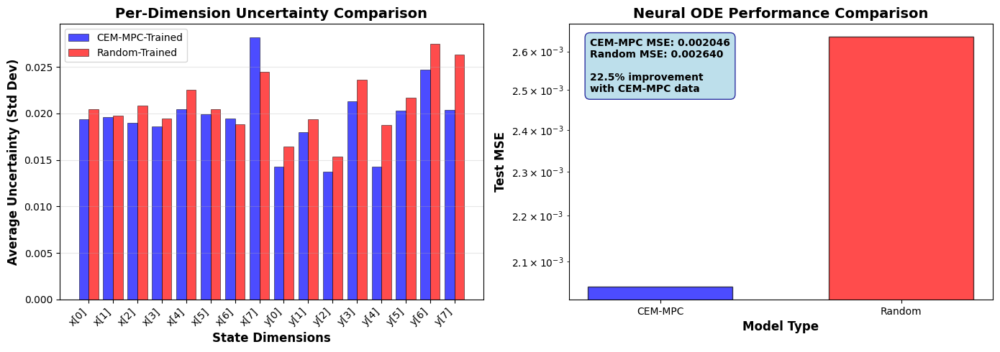

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Left plot: Per-dimension uncertainty comparison
dimensions = [f'{("x" if i < 8 else "y")}[{i if i < 8 else i-8}]' for i in range(state_dim)]
x_pos = np.arange(len(dimensions))

bars1 = ax1.bar(x_pos - 0.2, avg_std_mpc, 0.4, label='CEM-MPC-Trained', 
                color='blue', alpha=0.7, edgecolor='black', linewidth=0.5)
bars2 = ax1.bar(x_pos + 0.2, avg_std_rand, 0.4, label='Random-Trained', 
                color='red', alpha=0.7, edgecolor='black', linewidth=0.5)

ax1.set_xlabel('State Dimensions', fontsize=12, fontweight='bold')
ax1.set_ylabel('Average Uncertainty (Std Dev)', fontsize=12, fontweight='bold')
ax1.set_title('Per-Dimension Uncertainty Comparison', fontsize=14, fontweight='bold')
ax1.set_xticks(x_pos)
ax1.set_xticklabels(dimensions, rotation=45, ha='right')
ax1.legend(fontsize=10)
ax1.grid(True, alpha=0.3, axis='y')

# Right plot: Clean MSE comparison only
models = ['CEM-MPC', 'Random']
mse_values = [mse_mpc, mse_rand]

bars = ax2.bar(models, mse_values, color=['blue', 'red'], alpha=0.7, 
               edgecolor='black', linewidth=1, width=0.6)

ax2.set_xlabel('Model Type', fontsize=12, fontweight='bold')
ax2.set_ylabel('Test MSE', fontsize=12, fontweight='bold')
ax2.set_title('Neural ODE Performance Comparison', fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3, axis='y')
ax2.set_yscale('log')

# Combined info box at top-left of right plot
mse_improvement = ((mse_rand - mse_mpc) / mse_rand * 100)
info_text = f'CEM-MPC MSE: {mse_mpc:.6f}\nRandom MSE: {mse_rand:.6f}\n\n{mse_improvement:.1f}% improvement\nwith CEM-MPC data'

ax2.text(0.05, 0.95, info_text, ha='left', va='top', transform=ax2.transAxes, 
         fontsize=10, fontweight='bold',
         bbox=dict(boxstyle="round,pad=0.5", facecolor='lightblue', alpha=0.8, edgecolor='darkblue'))

plt.tight_layout()

# Save the plots
uncertainty_mse_name = "neural_ode_uncertainty_and_mse_analysis"
plt.savefig(f"{uncertainty_mse_name}.pdf", dpi=300, bbox_inches='tight', format='pdf')
plt.savefig(f"{uncertainty_mse_name}.svg", dpi=300, bbox_inches='tight', format='svg')
plt.savefig(f"{uncertainty_mse_name}.png", dpi=300, bbox_inches='tight', format='png')

print(f"✅ Uncertainty and MSE analysis plots saved as:")
print(f"   📄 {uncertainty_mse_name}.pdf")
print(f"   🎨 {uncertainty_mse_name}.svg")  
print(f"   🖼️  {uncertainty_mse_name}.png")

plt.show()

Creating multiple 2D trajectory segments (your original style)...
✅ Multiple 2D trajectory segments saved as:
   📄 multiple_2d_trajectory_segments.pdf
   🎨 multiple_2d_trajectory_segments.svg
   🖼️  multiple_2d_trajectory_segments.png


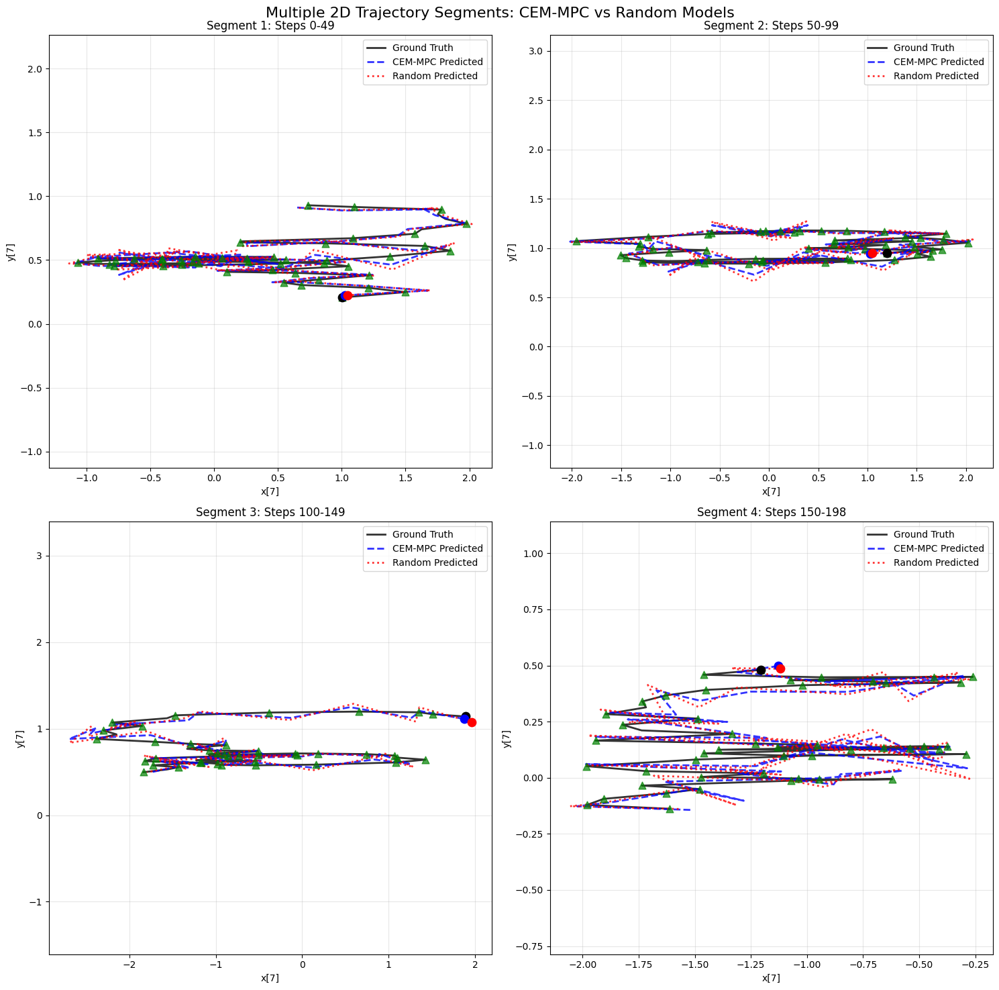


Creating original style comparison...
✅ Original style 2D trajectories saved as:
   📄 original_style_2d_trajectories.pdf
   🖼️  original_style_2d_trajectories.png


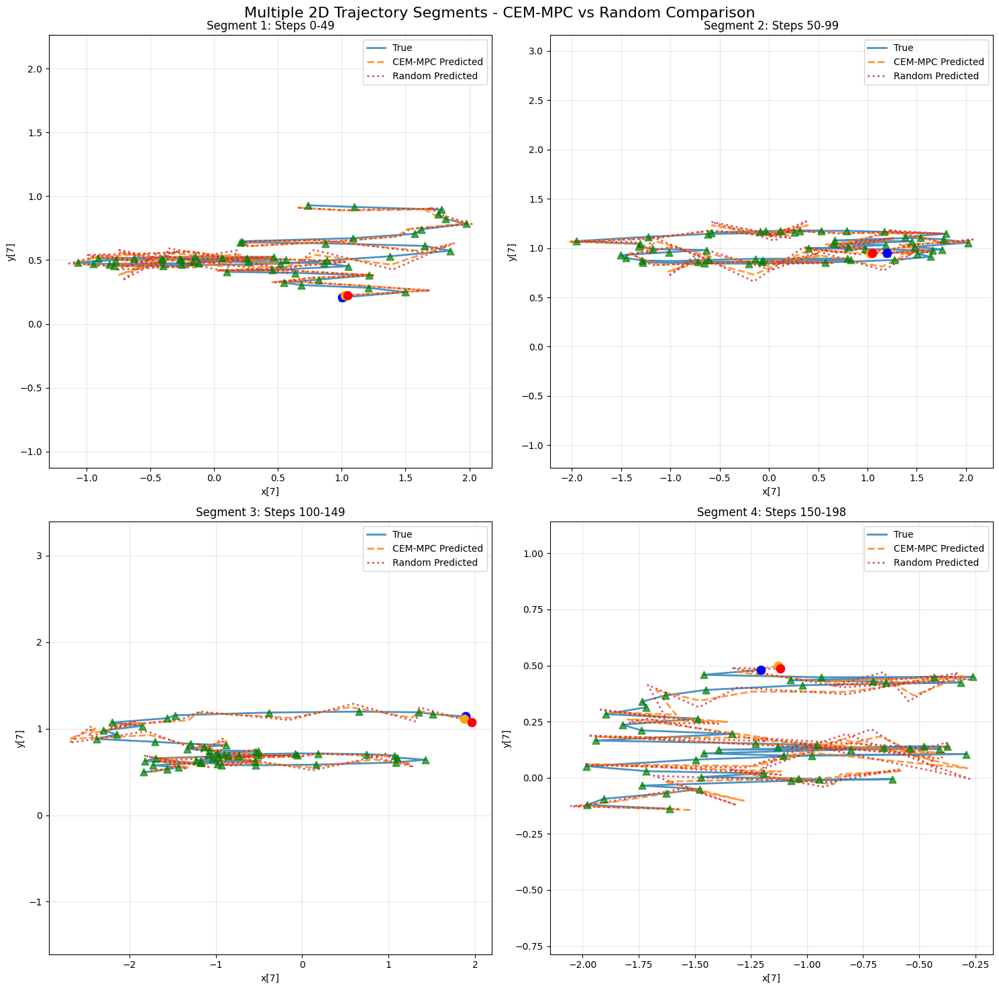

In [113]:
def plot_multiple_2d_trajectories_comparison(trajectory_data, episode_idx=0, num_segments=4, 
                                           segment_length=50, x_dim=7, y_dim=15):
    """
    Plot multiple 2D trajectory segments comparing CEM-MPC vs Random models
    Similar to your original format
    """
    
    # Use the trajectory data we generated
    true_states = trajectory_data['true_next']
    mpc_predictions = trajectory_data['mpc_pred']
    rand_predictions = trajectory_data['rand_pred']
    actions = trajectory_data['actions']
    
    total_length = len(true_states)
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 15))
    axes = axes.flatten()
    
    for i in range(min(num_segments, 4)):
        start = i * segment_length
        end = min(start + segment_length, total_length)
        
        if start >= total_length:
            break
            
        ax = axes[i]
        
        # Extract trajectory segments
        true_x = true_states[start:end, x_dim]
        true_y = true_states[start:end, y_dim]
        mpc_pred_x = mpc_predictions[start:end, x_dim]
        mpc_pred_y = mpc_predictions[start:end, y_dim]
        rand_pred_x = rand_predictions[start:end, x_dim]
        rand_pred_y = rand_predictions[start:end, y_dim]
        
        # Find action points
        if start < len(actions):
            segment_actions = actions[start:min(end, len(actions))]
            if segment_actions.ndim > 1:
                segment_actions = segment_actions.flatten()
            action_points = np.where(np.abs(segment_actions) > 0.1)[0]
        else:
            action_points = []
        
        # Plot trajectories (following your original style)
        ax.plot(true_x, true_y, label='Ground Truth', color='black', linewidth=2, alpha=0.8)
        ax.plot(mpc_pred_x, mpc_pred_y, label='CEM-MPC Predicted', color='blue', 
                linestyle='--', linewidth=2, alpha=0.8)
        ax.plot(rand_pred_x, rand_pred_y, label='Random Predicted', color='red', 
                linestyle=':', linewidth=2, alpha=0.8)
        
        # Mark start points
        ax.scatter(true_x[0], true_y[0], color='black', marker='o', s=80, zorder=5)
        ax.scatter(mpc_pred_x[0], mpc_pred_y[0], color='blue', marker='o', s=80, zorder=5)
        ax.scatter(rand_pred_x[0], rand_pred_y[0], color='red', marker='o', s=80, zorder=5)
        
        # Mark action points
        if len(action_points) > 0 and max(action_points) < len(true_x):
            ax.scatter(true_x[action_points], true_y[action_points], 
                      color='green', marker='^', s=60, alpha=0.7, zorder=4)
        
        ax.set_xlabel(f'x[{x_dim}]')
        ax.set_ylabel(f'y[{y_dim-8 if y_dim >= 8 else y_dim}]')
        ax.set_title(f'Segment {i+1}: Steps {start}-{end-1}')
        ax.legend()
        ax.grid(True, alpha=0.3)
        ax.axis('equal')
    
    # Hide unused subplots
    for i in range(num_segments, 4):
        axes[i].set_visible(False)
    
    plt.suptitle(f'Multiple 2D Trajectory Segments: CEM-MPC vs Random Models', fontsize=16)
    plt.tight_layout()
    
    # Save the plot
    multi_traj_name = "multiple_2d_trajectory_segments"
    plt.savefig(f"{multi_traj_name}.pdf", dpi=300, bbox_inches='tight', format='pdf')
    plt.savefig(f"{multi_traj_name}.svg", dpi=300, bbox_inches='tight', format='svg')
    plt.savefig(f"{multi_traj_name}.png", dpi=300, bbox_inches='tight', format='png')
    
    print(f"✅ Multiple 2D trajectory segments saved as:")
    print(f"   📄 {multi_traj_name}.pdf")
    print(f"   🎨 {multi_traj_name}.svg") 
    print(f"   🖼️  {multi_traj_name}.png")
    
    plt.show()

# Alternative version with your exact original structure
def plot_2d_trajectories_original_style(trajectory_data, num_segments=4, segment_length=50, x_dim=7, y_dim=15):
    """
    Plot exactly like your original function but with model comparison
    """
    
    # Prepare data in the format your original function expected
    system_states = trajectory_data['true_next']  # This acts as your "system_states"
    mpc_predictions = trajectory_data['mpc_pred']   # CEM-MPC model predictions
    rand_predictions = trajectory_data['rand_pred'] # Random model predictions
    actions_applied = trajectory_data['actions']
    
    total_length = len(system_states)
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 15))
    axes = axes.flatten()
    
    for i in range(min(num_segments, 4)):
        start = i * segment_length
        end = min(start + segment_length, total_length)
        
        if start >= total_length:
            break
            
        ax = axes[i]
        
        # Extract trajectory segments (your original way)
        true_x = system_states[start:end, x_dim]
        true_y = system_states[start:end, y_dim]
        mpc_pred_x = mpc_predictions[start:end, x_dim]
        mpc_pred_y = mpc_predictions[start:end, y_dim]
        rand_pred_x = rand_predictions[start:end, x_dim]
        rand_pred_y = rand_predictions[start:end, y_dim]
        
        # Find action points (your original way)
        if start < len(actions_applied):
            actions_segment = actions_applied[start:min(end, len(actions_applied))]
            if actions_segment.ndim > 1:
                actions_segment = actions_segment.flatten()
            action_points = np.where(actions_segment != 0)[0]
        else:
            action_points = []
        
        # Plot trajectories (your original style)
        ax.plot(true_x, true_y, label='True', color='tab:blue', linewidth=2, alpha=0.8)
        ax.plot(mpc_pred_x, mpc_pred_y, label='CEM-MPC Predicted', color='tab:orange', linewidth=2, 
                alpha=0.8, linestyle='--')
        ax.plot(rand_pred_x, rand_pred_y, label='Random Predicted', color='tab:red', linewidth=2, 
                alpha=0.8, linestyle=':')
        
        # Mark start points (your original way)
        ax.scatter(true_x[0], true_y[0], color='blue', marker='o', s=80, zorder=5)
        ax.scatter(mpc_pred_x[0], mpc_pred_y[0], color='orange', marker='o', s=80, zorder=5)
        ax.scatter(rand_pred_x[0], rand_pred_y[0], color='red', marker='o', s=80, zorder=5)
        
        # Mark action points (your original way)
        if len(action_points) > 0 and max(action_points) < len(true_x):
            ax.scatter(true_x[action_points], true_y[action_points], 
                      color='green', marker='^', s=60, alpha=0.7, zorder=4)
        
        ax.set_xlabel(f'x[{x_dim}]')
        ax.set_ylabel(f'y[{y_dim-8 if y_dim >= 8 else y_dim}]')
        ax.set_title(f'Segment {i+1}: Steps {start}-{end-1}')
        ax.legend()
        ax.grid(True, alpha=0.3)
        ax.axis('equal')
    
    # Hide unused subplots (your original way)
    for i in range(num_segments, 4):
        axes[i].set_visible(False)
    
    plt.suptitle(f'Multiple 2D Trajectory Segments - CEM-MPC vs Random Comparison', fontsize=16)
    plt.tight_layout()
    
    # Save
    original_style_name = "original_style_2d_trajectories"
    plt.savefig(f"{original_style_name}.pdf", dpi=300, bbox_inches='tight', format='pdf')
    plt.savefig(f"{original_style_name}.png", dpi=300, bbox_inches='tight', format='png')
    
    print(f"✅ Original style 2D trajectories saved as:")
    print(f"   📄 {original_style_name}.pdf")
    print(f"   🖼️  {original_style_name}.png")
    
    plt.show()

# Create the plots in your original style
print("Creating multiple 2D trajectory segments (your original style)...")
plot_multiple_2d_trajectories_comparison(clean_trajectory_data, num_segments=4, 
                                        segment_length=50, x_dim=7, y_dim=15)

print("\nCreating original style comparison...")
plot_2d_trajectories_original_style(clean_trajectory_data, num_segments=4, 
                                   segment_length=50, x_dim=7, y_dim=15)